In [1]:
import pandas as pd
import numpy as np

from sklearn.linear_model import LinearRegression
from sklearn.impute import KNNImputer
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.decomposition import PCA

import matplotlib
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
%matplotlib inline

plt.rcParams['figure.figsize'] = (10, 8)

In [3]:
df = pd.read_csv('./data/demographics_case_study.csv')

# General Data Exploration

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5317 entries, 0 to 5316
Data columns (total 82 columns):
 #   Column                                                             Non-Null Count  Dtype  
---  ------                                                             --------------  -----  
 0   u_code_federal_state                                               5317 non-null   int64  
 1   u_code_county                                                      5317 non-null   int64  
 2   u_code_district                                                    5317 non-null   int64  
 3   u_code_municipality                                                5317 non-null   int64  
 4   u_municipality                                                     5317 non-null   object 
 5   u_5_digit_postcode                                                 5317 non-null   int64  
 6   u_place                                                            5317 non-null   object 
 7   u_borough               

In [5]:
df.head()

,u_code_federal_state,u_code_county,u_code_district,u_code_municipality,u_municipality,u_5_digit_postcode,u_place,u_borough,u_inhabitants,u_households,...,u_3_6_family_accommodation,u_3_6_family_accommodation_percentage,u_3_6_family_accommodation_index_per_residential_building,u_7_19_family_accommodation,u_7_19_family_accommodation_percentage,u_7_19_family_accommodation_index_per_residential_building,u_20_and_more_family_accommodation,u_20_and_more_family_accommodation_percentage,u_20_and_more_family_accommodation_index_per_residential_building,coordinates
0,2,20,2000,2000000,Hamburg,22085,Hamburg,Barmbek-Süd,55.0,35.0,...,0.0,0.0,0.000,23.0,66.6667,1298.352,0.0,0.0000,0.000,POINT (53.5798172352973 10.0190116424376)
1,2,20,2000,2000000,Hamburg,22085,Hamburg,Barmbek-Süd,273.0,175.0,...,44.0,25.0,229.361,80.0,45.8333,892.617,0.0,0.0000,0.000,POINT (53.5781043070336 10.0190310911849)
2,2,20,2000,2000000,Hamburg,22085,Hamburg,Barmbek-Süd,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (53.5806090293635 10.0192291105621)
3,2,20,2000,2000000,Hamburg,22085,Hamburg,Barmbek-Süd,68.0,38.0,...,8.0,20.0,183.489,15.0,40.0000,779.011,0.0,0.0000,0.000,POINT (53.5754063568354 10.0210559876439)
4,2,20,2000,2000000,Hamburg,22085,Hamburg,Barmbek-Süd,136.0,99.0,...,0.0,0.0,0.000,0.0,0.0000,0.000,33.0,33.3333,6747.885,POINT (53.5709065528661 10.0262791393113)


In [6]:
df.iloc[:, [1, 9, 10, 38, 66, 67, 68, 22, 24, 65, 69, 81]]


,u_code_county,u_households,u_household_size_ø,u_household_head_age_ø,u_residential_building,u_residential_and_commercial_building,u_commercial_building,u_immigrant_households_per_household_index,u_household_head_up_to_under_30_years_percentage,"u_household_income_7,000_and_higher_per_household_index",u_1_2_family_accommodation,coordinates
0,20,35.0,1.57,46.4286,3.0,3.0,4.0,191.515,14.2857,"178,064",12.0,POINT (53.5798172352973 10.0190116424376)
1,20,175.0,1.56,43.5571,24.0,0.0,3.0,196.987,20.0000,"154,323",51.0,POINT (53.5781043070336 10.0190310911849)
2,20,0.0,NaN,NaN,0.0,0.0,2.0,NaN,NaN,NaN,NaN,POINT (53.5806090293635 10.0192291105621)
3,20,38.0,1.79,44.9333,5.0,0.0,0.0,102.142,10.0000,"166,193",15.0,POINT (53.5754063568354 10.0210559876439)
4,20,99.0,1.37,51.8038,3.0,0.0,1.0,155.152,8.8608,"147,26",66.0,POINT (53.5709065528661 10.0262791393113)
...,...,...,...,...,...,...,...,...,...,...,...,...
5312,57,8.0,2.62,54.5000,3.0,0.0,0.0,0.000,0.0000,0,5.0,POINT (52.1085649976213 8.77414649890642)
5313,57,11.0,2.45,64.5000,7.0,1.0,0.0,0.000,0.0000,0,11.0,POINT (52.1088629976008 8.77415700043544)
5314,57,11.0,2.73,54.6111,8.0,0.0,0.0,0.000,11.1111,"369,319",11.0,POINT (52.0909411553438 8.79299047227634)
5315,57,12.0,2.92,53.6000,6.0,1.0,0.0,0.000,10.0000,"166,193",10.0,POINT (52.0879084648331 8.80892665522601)


In [7]:
df[df.isnull().any(axis=1)].iloc[:, [1, 9, 10, 38, 66, 67, 68, 22, 24, 65]]


,u_code_county,u_households,u_household_size_ø,u_household_head_age_ø,u_residential_building,u_residential_and_commercial_building,u_commercial_building,u_immigrant_households_per_household_index,u_household_head_up_to_under_30_years_percentage,"u_household_income_7,000_and_higher_per_household_index"
2,20,0.0,NaN,NaN,0.0,0.0,2.0,NaN,NaN,NaN
8,20,0.0,NaN,NaN,0.0,0.0,1.0,NaN,NaN,NaN
10,20,0.0,NaN,NaN,0.0,0.0,1.0,NaN,NaN,NaN
22,20,0.0,NaN,NaN,0.0,0.0,1.0,NaN,NaN,NaN
64,20,0.0,NaN,NaN,0.0,0.0,2.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
5264,57,2.0,2.0,NaN,1.0,1.0,0.0,NaN,NaN,NaN
5265,57,5.0,2.8,NaN,3.0,0.0,0.0,NaN,NaN,NaN
5266,57,0.0,NaN,NaN,0.0,0.0,1.0,NaN,NaN,NaN
5294,57,0.0,NaN,NaN,0.0,0.0,1.0,NaN,NaN,NaN


In [8]:
df.iloc[:, 7].unique()

array(['Barmbek-Süd', 'Uhlenhorst', 'Barmbek-Nord', 'Winterhude',
       'Bergstedt', 'Rahlstedt', 'Volksdorf', 'Groß Flottbek',
       'Nienstedten', 'Osdorf', 'Othmarschen', 'Diebrock', 'Eickum',
       'Herringhausen', 'Innenstadt', 'Laar', 'Stedefreund',
       'Elverdissen', 'Schwarzenmoor', 'Schötmar', 'Biemsen-Ahmsen',
       'Grastrup-Hölsen', 'Holzhausen', 'Lockhausen', 'Werl-Aspe',
       'Wülfer-Bexten', 'Ehrsen-Breden', 'Papenhausen', 'Retzen',
       'Wüsten'], dtype=object)

# Data Cleansing: Handling Missing Values, Outliers and Inconsistencies

## Inconsistencies

### Naming

In [9]:
# noticeable inconcestency with the columns naming
# create regex including all "strange" chars
regex = '|'.join(['\x80', ',', '_ø'])
org_clmns = df.columns.tolist()
fixed_clmns = df.columns.str.replace(regex, '', regex=True).tolist()

In [10]:
clmns_new_naming = dict(zip(org_clmns, fixed_clmns))

In [11]:
df = df.rename(columns=clmns_new_naming)

### Column Type

In [12]:
# change u_household_income_7000_and_higher_per_household_index type into float64 (correct type)
df['u_household_income_7000_and_higher_per_household_index'] = df['u_household_income_7000_and_higher_per_household_index'].str.replace(',', '.').astype(np.float64)


In [13]:
df.iloc[:, 65]

0       178.064
1       154.323
2           NaN
3       166.193
4       147.260
         ...   
5312      0.000
5313      0.000
5314    369.319
5315    166.193
5316        NaN
Name: u_household_income_7000_and_higher_per_household_index, Length: 5317, dtype: float64

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5317 entries, 0 to 5316
Data columns (total 82 columns):
 #   Column                                                             Non-Null Count  Dtype  
---  ------                                                             --------------  -----  
 0   u_code_federal_state                                               5317 non-null   int64  
 1   u_code_county                                                      5317 non-null   int64  
 2   u_code_district                                                    5317 non-null   int64  
 3   u_code_municipality                                                5317 non-null   int64  
 4   u_municipality                                                     5317 non-null   object 
 5   u_5_digit_postcode                                                 5317 non-null   int64  
 6   u_place                                                            5317 non-null   object 
 7   u_borough               

### u_household_income_7000_and_higher*

It is noticeable that this set of columns include extremly higher values than the other (similar) columns, therefore we will handle this inconcistency.

In [15]:
df.iloc[:, 39:66].describe()

,u_household_income_up_to_1000,u_household_income_up_to_1000_percentage,u_household_income_up_to_1000_per_household_index,u_household_income_1000_to_under_1500,u_household_income_1000_to_under_1500_percentage,u_household_income_1000_to_under_1500_per_household_index,u_household_income_1500_to_under_2000,u_household_income_1500_to_under_2000_percentage,u_household_income_1500_to_under_2000_per_household_index,u_household_income_2000_to_under_2500,...,u_household_income_3000_to_under_4000_per_household_index,u_household_income_4000_to_under_5000,u_household_income_4000_to_under_5000_percentage,u_household_income_4000_to_under_5000_per_household_index,u_household_income_5000_to_under_7000,u_household_income_5000_to_under_7000_percentage,u_household_income_5000_to_under_7000_per_household_index,u_household_income_7000_and_higher,u_household_income_7000_and_higher_percentage,u_household_income_7000_and_higher_per_household_index
count,4783.000000,4783.000000,4783.000000,4783.000000,4783.000000,4783.000000,4783.000000,4783.000000,4783.000000,4783.000000,...,4783.000000,4783.00000,4783.000000,4783.000000,4783.000000,4783.000000,4783.000000,4783.000000,4783.000000,4783.000000
mean,2.632448,6.577383,84.430140,3.793017,10.408932,93.917927,4.333682,13.140807,102.165884,3.902781,...,85.646005,3.01798,13.143551,112.291170,2.909680,13.606775,119.260789,11705.132971,44031.928497,115.707593
std,5.596495,7.996898,102.651674,7.410149,11.000278,99.253573,7.751573,12.095895,94.042021,6.372610,...,78.120730,4.17468,12.647549,108.053638,4.264934,15.844677,138.875600,25713.837000,96425.883174,203.876054
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,28.523000,1.00000,2.222200,18.985000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,1.000000,9.090900,82.026000,1.000000,12.500000,97.184000,2.000000,...,72.893000,1.00000,11.111100,94.927000,1.000000,9.259300,81.156000,0.000000,0.000000,0.000000
75%,3.000000,12.947000,166.193000,4.000000,18.181800,164.051000,5.000000,20.512800,159.481000,5.000000,...,123.007000,4.00000,20.000000,170.869000,4.000000,20.000000,175.296000,12632.000000,51724.000000,166.193000
max,91.000000,42.857100,550.133000,92.000000,71.428600,644.487000,136.000000,87.500000,680.287000,130.000000,...,562.316000,50.00000,87.500000,747.551000,44.000000,100.000000,876.481000,300722.000000,857143.000000,1661.935000


#### 1. percentage

In [16]:
# get all necessary columns that needs to be handled for percentage
meta_data = df.iloc[:, [8, 9, 10]]
sum_percentages = df.iloc[:, [40, 43, 46, 49, 52, 55, 58, 61]].sum(axis=1)
higher_7000_p = df.iloc[:, 64]
df_h7000_p = pd.concat([meta_data, (100 - sum_percentages).rename('correct_percentage'), higher_7000_p], axis=1)
df_h7000_p.head(20)

,u_inhabitants,u_households,u_household_size,correct_percentage,u_household_income_7000_and_higher_percentage
0,55.0,35.0,1.57,10.7142,107143.0
1,273.0,175.0,1.56,9.2857,92857.0
2,0.0,0.0,NaN,100.0000,NaN
3,68.0,38.0,1.79,10.0000,10.0
4,136.0,99.0,1.37,8.8607,88608.0
5,21.0,12.0,1.75,0.0000,0.0
6,209.0,129.0,1.62,9.7086,97087.0
7,294.0,191.0,1.54,2.6144,26144.0
8,0.0,0.0,NaN,100.0000,NaN
9,18.0,12.0,1.50,0.0000,0.0


In [17]:
innac_households_percentage_idx = (df_h7000_p.iloc[:, 3] < 0).tolist()
df_h7000_p[innac_households_percentage_idx]

,u_inhabitants,u_households,u_household_size,correct_percentage,u_household_income_7000_and_higher_percentage
87,104.0,68.0,1.53,-0.0001,0.0
99,36.0,21.0,1.71,-0.0003,0.0
135,12.0,8.0,1.50,-0.0002,0.0
153,107.0,68.0,1.57,-0.0002,0.0
165,14.0,8.0,1.75,-0.0002,0.0
...,...,...,...,...,...
5238,21.0,15.0,1.40,-0.0001,0.0
5240,100.0,54.0,1.85,-0.0001,0.0
5262,53.0,22.0,2.41,-0.0002,0.0
5268,20.0,8.0,2.50,-0.0002,0.0


In [18]:
df.loc[~df['u_household_income_7000_and_higher_percentage'].isnull(), 'u_household_income_7000_and_higher_percentage'] = df_h7000_p.loc[~df['u_household_income_7000_and_higher_percentage'].isnull(), 'correct_percentage']
df.iloc[innac_households_percentage_idx, 64] = 0.
df['u_household_income_7000_and_higher_percentage'].head(20)

0     10.7142
1      9.2857
2         NaN
3     10.0000
4      8.8607
5      0.0000
6      9.7086
7      2.6144
8         NaN
9      0.0000
10        NaN
11    46.1539
12     7.6924
13     9.6776
14    11.7646
15     5.0000
16    15.3844
17     8.0000
18     1.8518
19     8.7719
Name: u_household_income_7000_and_higher_percentage, dtype: float64

In [19]:
df.iloc[innac_households_percentage_idx, 64]

87      0.0
99      0.0
135     0.0
153     0.0
165     0.0
       ... 
5238    0.0
5240    0.0
5262    0.0
5268    0.0
5312    0.0
Name: u_household_income_7000_and_higher_percentage, Length: 530, dtype: float64

#### 2. index

In [20]:
# get all necessary columns that needs to be handled for index
sum_indices = df.iloc[:, [41, 44, 47, 50, 53, 56, 59, 62]].sum(axis=1)
higher_7000_i = df.iloc[:, 65]
df_h7000_i = pd.concat([meta_data, sum_indices.rename('sum_indices'), higher_7000_i], axis=1)
df_h7000_i.iloc[20:40,:]

,u_inhabitants,u_households,u_household_size,sum_indices,u_household_income_7000_and_higher_per_household_index
20,95.0,61.0,1.56,790.912,135.668
21,88.0,52.0,1.69,691.279,276.989
22,0.0,0.0,NaN,0.000,NaN
23,100.0,61.0,1.64,730.867,237.419
24,91.0,62.0,1.47,773.035,132.955
25,81.0,46.0,1.76,829.847,89.834
26,272.0,174.0,1.56,816.842,83.695
27,21.0,14.0,1.50,725.697,151.085
28,77.0,45.0,1.71,772.319,46.165
29,14.0,10.0,1.40,589.320,415.484


In [21]:
df_h7000_i[df_h7000_i.iloc[:, 4] == df_h7000_i.iloc[:, 4].max()]

,u_inhabitants,u_households,u_household_size,sum_indices,u_household_income_7000_and_higher_per_household_index
891,8.0,8.0,1.00,0.0,1661.935
3959,23.0,6.0,3.83,0.0,1661.935
4376,35.0,9.0,3.89,0.0,1661.935
4575,32.0,9.0,3.56,0.0,1661.935


#### 3. income

In [22]:
# get all necessary columns that needs to be handled for income
sum_incomes_hlds = df.iloc[:, [39, 42, 45, 48, 51, 54, 57, 60]].sum(axis=1)
higher_7000_inc_hlds = df.iloc[:, 63]
corr_hlds_income_7000 = (meta_data.u_households - sum_incomes_hlds).rename('correct_household_income_7000_and_higher')
df_h7000_inc_hlds = pd.concat([meta_data, 
                               sum_incomes_hlds.rename('sum_households_income'), 
                               corr_hlds_income_7000, 
                               higher_7000_inc_hlds], 
                              axis=1)
df_h7000_inc_hlds.head(20)

,u_inhabitants,u_households,u_household_size,sum_households_income,correct_household_income_7000_and_higher,u_household_income_7000_and_higher
0,55.0,35.0,1.57,33.0,2.0,37500.0
1,273.0,175.0,1.56,159.0,16.0,162500.0
2,0.0,0.0,NaN,0.0,0.0,NaN
3,68.0,38.0,1.79,35.0,3.0,4.0
4,136.0,99.0,1.37,91.0,8.0,87722.0
5,21.0,12.0,1.75,10.0,2.0,0.0
6,209.0,129.0,1.62,116.0,13.0,125242.0
7,294.0,191.0,1.54,186.0,5.0,49935.0
8,0.0,0.0,NaN,0.0,0.0,NaN
9,18.0,12.0,1.50,10.0,2.0,0.0


In [23]:
innac_households_idx = (df_h7000_inc_hlds.iloc[:, 4] < 0).tolist()
df_h7000_inc_hlds[innac_households_idx]

,u_inhabitants,u_households,u_household_size,sum_households_income,correct_household_income_7000_and_higher,u_household_income_7000_and_higher
45,29.0,19.0,1.53,21.0,-2.0,0.0
87,104.0,68.0,1.53,69.0,-1.0,0.0
99,36.0,21.0,1.71,22.0,-1.0,0.0
110,38.0,24.0,1.58,27.0,-3.0,0.0
155,52.0,31.0,1.68,32.0,-1.0,0.0
...,...,...,...,...,...,...
5229,27.0,14.0,1.93,15.0,-1.0,0.0
5238,21.0,15.0,1.40,17.0,-2.0,0.0
5240,100.0,54.0,1.85,55.0,-1.0,0.0
5259,36.0,14.0,2.57,15.0,-1.0,0.0


In [24]:
df.iloc[innac_households_idx, [9, 39, 42, 45, 48, 51, 54, 57, 60, 63]]

,u_households,u_household_income_up_to_1000,u_household_income_1000_to_under_1500,u_household_income_1500_to_under_2000,u_household_income_2000_to_under_2500,u_household_income_2500_to_under_3000,u_household_income_3000_to_under_4000,u_household_income_4000_to_under_5000,u_household_income_5000_to_under_7000,u_household_income_7000_and_higher
45,19.0,3.0,3.0,3.0,4.0,3.0,3.0,1.0,1.0,0.0
87,68.0,4.0,9.0,10.0,10.0,9.0,10.0,9.0,8.0,0.0
99,21.0,0.0,1.0,1.0,4.0,4.0,4.0,4.0,4.0,0.0
110,24.0,3.0,4.0,4.0,4.0,3.0,3.0,3.0,3.0,0.0
155,31.0,4.0,5.0,5.0,4.0,1.0,5.0,4.0,4.0,0.0
...,...,...,...,...,...,...,...,...,...,...
5229,14.0,0.0,1.0,0.0,3.0,3.0,5.0,3.0,0.0,0.0
5238,15.0,0.0,0.0,3.0,3.0,1.0,4.0,3.0,3.0,0.0
5240,54.0,3.0,6.0,13.0,6.0,9.0,9.0,6.0,3.0,0.0
5259,14.0,0.0,0.0,1.0,3.0,3.0,3.0,1.0,4.0,0.0


In [25]:
df.iloc[innac_households_idx, [8, 9, 10, 39, 42, 45, 48, 51, 54, 57, 60, 63]]

,u_inhabitants,u_households,u_household_size,u_household_income_up_to_1000,u_household_income_1000_to_under_1500,u_household_income_1500_to_under_2000,u_household_income_2000_to_under_2500,u_household_income_2500_to_under_3000,u_household_income_3000_to_under_4000,u_household_income_4000_to_under_5000,u_household_income_5000_to_under_7000,u_household_income_7000_and_higher
45,29.0,19.0,1.53,3.0,3.0,3.0,4.0,3.0,3.0,1.0,1.0,0.0
87,104.0,68.0,1.53,4.0,9.0,10.0,10.0,9.0,10.0,9.0,8.0,0.0
99,36.0,21.0,1.71,0.0,1.0,1.0,4.0,4.0,4.0,4.0,4.0,0.0
110,38.0,24.0,1.58,3.0,4.0,4.0,4.0,3.0,3.0,3.0,3.0,0.0
155,52.0,31.0,1.68,4.0,5.0,5.0,4.0,1.0,5.0,4.0,4.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
5229,27.0,14.0,1.93,0.0,1.0,0.0,3.0,3.0,5.0,3.0,0.0,0.0
5238,21.0,15.0,1.40,0.0,0.0,3.0,3.0,1.0,4.0,3.0,3.0,0.0
5240,100.0,54.0,1.85,3.0,6.0,13.0,6.0,9.0,9.0,6.0,3.0,0.0
5259,36.0,14.0,2.57,0.0,0.0,1.0,3.0,3.0,3.0,1.0,4.0,0.0


In [26]:
df.loc[~df['u_household_income_7000_and_higher'].isnull(), 'u_household_income_7000_and_higher'] = df_h7000_inc_hlds.loc[~df['u_household_income_7000_and_higher'].isnull(), 'correct_household_income_7000_and_higher']
df.iloc[innac_households_idx, 63] = 0.
df.iloc[innac_households_idx, 9] = sum_incomes_hlds[innac_households_idx]
df.iloc[innac_households_idx, 10] = df.iloc[innac_households_idx, 8] / df.iloc[innac_households_idx, 9]
df['u_household_income_7000_and_higher'].head(20)

0      2.0
1     16.0
2      NaN
3      3.0
4      8.0
5      2.0
6     13.0
7      5.0
8      NaN
9      2.0
10     NaN
11     8.0
12     3.0
13     7.0
14     3.0
15     2.0
16     4.0
17    10.0
18     0.0
19     6.0
Name: u_household_income_7000_and_higher, dtype: float64

In [27]:
df.iloc[innac_households_idx, [8, 9, 10, 63]]

,u_inhabitants,u_households,u_household_size,u_household_income_7000_and_higher
45,29.0,21.0,1.380952,0.0
87,104.0,69.0,1.507246,0.0
99,36.0,22.0,1.636364,0.0
110,38.0,27.0,1.407407,0.0
155,52.0,32.0,1.625000,0.0
...,...,...,...,...
5229,27.0,15.0,1.800000,0.0
5238,21.0,17.0,1.235294,0.0
5240,100.0,55.0,1.818182,0.0
5259,36.0,15.0,2.400000,0.0


In [28]:
df.iloc[:, 38:66].describe()

,u_household_head_age,u_household_income_up_to_1000,u_household_income_up_to_1000_percentage,u_household_income_up_to_1000_per_household_index,u_household_income_1000_to_under_1500,u_household_income_1000_to_under_1500_percentage,u_household_income_1000_to_under_1500_per_household_index,u_household_income_1500_to_under_2000,u_household_income_1500_to_under_2000_percentage,u_household_income_1500_to_under_2000_per_household_index,...,u_household_income_3000_to_under_4000_per_household_index,u_household_income_4000_to_under_5000,u_household_income_4000_to_under_5000_percentage,u_household_income_4000_to_under_5000_per_household_index,u_household_income_5000_to_under_7000,u_household_income_5000_to_under_7000_percentage,u_household_income_5000_to_under_7000_per_household_index,u_household_income_7000_and_higher,u_household_income_7000_and_higher_percentage,u_household_income_7000_and_higher_per_household_index
count,4783.000000,4783.000000,4783.000000,4783.000000,4783.000000,4783.000000,4783.000000,4783.000000,4783.000000,4783.000000,...,4783.000000,4783.00000,4783.000000,4783.000000,4783.000000,4783.000000,4783.000000,4783.000000,4783.000000,4783.000000
mean,53.075745,2.632448,6.577383,84.430140,3.793017,10.408932,93.917927,4.333682,13.140807,102.165884,...,85.646005,3.01798,13.143551,112.291170,2.909680,13.606775,119.260789,2.002300,6.962243,115.707593
std,7.293036,5.596495,7.996898,102.651674,7.410149,11.000278,99.253573,7.751573,12.095895,94.042021,...,78.120730,4.17468,12.647549,108.053638,4.264934,15.844677,138.875600,2.756043,12.267385,203.876054
min,30.611100,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,28.523000,1.00000,2.222200,18.985000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,53.076900,0.000000,0.000000,0.000000,1.000000,9.090900,82.026000,1.000000,12.500000,97.184000,...,72.893000,1.00000,11.111100,94.927000,1.000000,9.259300,81.156000,1.000000,0.000100,0.000000
75%,58.250000,3.000000,12.947000,166.193000,4.000000,18.181800,164.051000,5.000000,20.512800,159.481000,...,123.007000,4.00000,20.000000,170.869000,4.000000,20.000000,175.296000,3.000000,10.000000,166.193000
max,74.500000,91.000000,42.857100,550.133000,92.000000,71.428600,644.487000,136.000000,87.500000,680.287000,...,562.316000,50.00000,87.500000,747.551000,44.000000,100.000000,876.481000,32.000000,100.000000,1661.935000


## Missing Values

Let's try to explore the columns with NaNs and see if it is possible to mitigate this problem using somem imputation.

In [29]:
list_nas_columns = df.columns[df.isnull().any(axis=0)].tolist()
print(list_nas_columns)

['u_household_size', 'u_single_person_households', 'u_single_person_households_percentage', 'u_single_person_households_per_household_index', 'u_multiple_person_households_without_children', 'u_multiple_person_households_without_children_percentage', 'u_multiple_person_households_without_children_per_household_index', 'u_multiple_person_households_with_children', 'u_multiple_person_households_with_children_percentage', 'u_multiple_person_households_with_children_per_household_index', 'u_immigrant_households', 'u_immigrant_households_percentage', 'u_immigrant_households_per_household_index', 'u_household_head_up_to_under_30_years', 'u_household_head_up_to_under_30_years_percentage', 'u_household_head_up_to_under_30_years_per_household_index', 'u_household_head_30_to_under_40_years', 'u_household_head_30_to_under_40_years_percentage', 'u_household_head_30_to_under_40_years_per_household_index', 'u_household_head_40_to_under_50_years', 'u_household_head_40_to_under_50_years_percentage', '

In [30]:
df.iloc[df.iloc[:, 10].isnull().tolist(), [8, 9, 10, 66, 67, 68]]

,u_inhabitants,u_households,u_household_size,u_residential_building,u_residential_and_commercial_building,u_commercial_building
2,0.0,0.0,NaN,0.0,0.0,2.0
8,0.0,0.0,NaN,0.0,0.0,1.0
10,0.0,0.0,NaN,0.0,0.0,1.0
22,0.0,0.0,NaN,0.0,0.0,1.0
64,0.0,0.0,NaN,0.0,0.0,2.0
...,...,...,...,...,...,...
5189,0.0,0.0,NaN,0.0,0.0,1.0
5215,0.0,0.0,NaN,0.0,0.0,1.0
5220,0.0,0.0,NaN,0.0,0.0,1.0
5266,0.0,0.0,NaN,0.0,0.0,1.0


In [31]:
df_comm = df.loc[((df.iloc[:, 8] == 0) & (df.iloc[:, 68] > 0)).tolist(), df.columns[~df.isnull().any(axis=0)].tolist()]
df_comm.reset_index(drop=True, inplace=True)

In [32]:
df_comm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 329 entries, 0 to 328
Data columns (total 14 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   u_code_federal_state                   329 non-null    int64  
 1   u_code_county                          329 non-null    int64  
 2   u_code_district                        329 non-null    int64  
 3   u_code_municipality                    329 non-null    int64  
 4   u_municipality                         329 non-null    object 
 5   u_5_digit_postcode                     329 non-null    int64  
 6   u_place                                329 non-null    object 
 7   u_borough                              329 non-null    object 
 8   u_inhabitants                          329 non-null    float64
 9   u_households                           329 non-null    float64
 10  u_residential_building                 329 non-null    float64
 11  u_resi

In [33]:
df_resid = df.iloc[(df.iloc[:, 8] > 0).tolist(), :]
df_resid.reset_index(drop=True, inplace=True)

In [34]:
df_resid.iloc[(df_resid.iloc[:, 11:18].isnull().all(axis=1)).tolist(), [8, 9, 10, 11, 14, 17, 20, 66, 67, 68]]

,u_inhabitants,u_households,u_household_size,u_single_person_households,u_multiple_person_households_without_children,u_multiple_person_households_with_children,u_immigrant_households,u_residential_building,u_residential_and_commercial_building,u_commercial_building
109,5.0,1.0,5.0,NaN,NaN,NaN,NaN,1.0,0.0,0.0
251,1.0,1.0,1.0,NaN,NaN,NaN,NaN,1.0,0.0,0.0
542,3.0,1.0,3.0,NaN,NaN,NaN,NaN,1.0,0.0,0.0
619,6.0,4.0,1.5,NaN,NaN,NaN,NaN,2.0,1.0,3.0
1017,3.0,1.0,3.0,NaN,NaN,NaN,NaN,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
4883,6.0,2.0,3.0,NaN,NaN,NaN,NaN,2.0,0.0,0.0
4884,16.0,5.0,3.2,NaN,NaN,NaN,NaN,3.0,1.0,2.0
4937,4.0,2.0,2.0,NaN,NaN,NaN,NaN,1.0,1.0,0.0
4938,14.0,5.0,2.8,NaN,NaN,NaN,NaN,3.0,0.0,0.0


In [35]:
df_resid.iloc[(df_resid.isnull().any(axis=1)).tolist(), [8, 9, 10, 11, 14, 17, 20, 66, 67, 68]]


,u_inhabitants,u_households,u_household_size,u_single_person_households,u_multiple_person_households_without_children,u_multiple_person_households_with_children,u_immigrant_households,u_residential_building,u_residential_and_commercial_building,u_commercial_building
66,29.0,18.0,1.61,8.0,5.0,5.0,4.0,0.0,2.0,3.0
69,35.0,19.0,1.84,11.0,4.0,4.0,3.0,0.0,1.0,0.0
109,5.0,1.0,5.00,NaN,NaN,NaN,NaN,1.0,0.0,0.0
115,30.0,19.0,1.58,9.0,6.0,4.0,9.0,0.0,2.0,1.0
125,12.0,8.0,1.50,4.0,3.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...
4883,6.0,2.0,3.00,NaN,NaN,NaN,NaN,2.0,0.0,0.0
4884,16.0,5.0,3.20,NaN,NaN,NaN,NaN,3.0,1.0,2.0
4937,4.0,2.0,2.00,NaN,NaN,NaN,NaN,1.0,1.0,0.0
4938,14.0,5.0,2.80,NaN,NaN,NaN,NaN,3.0,0.0,0.0


In [36]:
# List of columns with missing values
df_numeric = df_resid.select_dtypes(include=['float64', 'int64'])

columns_with_missing = df_numeric.columns[df_numeric.isnull().any(axis=0)].tolist()


idx_missing_vals = df_numeric.iloc[(df_numeric.isnull().any(axis=1)).tolist(), :].index.tolist()

# using KNNImputer to predict the missing values of each column 
# based on the values of similar (nearest neighbors) points
imp_mean = KNNImputer(n_neighbors=10, weights='distance')

imputed_vales = imp_mean.fit_transform(df_numeric)
    

new_df = pd.DataFrame(imputed_vales, columns=df_numeric.columns.tolist())


new_df.iloc[idx_missing_vals, 5:17]

,u_inhabitants,u_households,u_household_size,u_single_person_households,u_single_person_households_percentage,u_single_person_households_per_household_index,u_multiple_person_households_without_children,u_multiple_person_households_without_children_percentage,u_multiple_person_households_without_children_per_household_index,u_multiple_person_households_with_children,u_multiple_person_households_with_children_percentage,u_multiple_person_households_with_children_per_household_index
66,29.0,18.0,1.61,8.000000,42.857100,104.826000,5.000000,28.571400,95.111000,5.000000,28.571400,98.266000
69,35.0,19.0,1.84,11.000000,60.000000,146.756000,4.000000,20.000000,66.578000,4.000000,20.000000,68.786000
109,5.0,1.0,5.00,6.263578,45.142266,110.415158,3.911537,29.632147,98.642172,3.177154,25.225573,86.758346
115,30.0,19.0,1.58,9.000000,46.666700,114.144000,6.000000,33.333300,110.963000,4.000000,20.000000,68.786000
125,12.0,8.0,1.50,4.000000,50.000000,122.297000,3.000000,33.333300,110.963000,1.000000,16.666700,57.322000
...,...,...,...,...,...,...,...,...,...,...,...,...
4883,6.0,2.0,3.00,4.625246,74.413247,182.009867,1.199983,22.091327,73.539419,0.174771,3.495427,12.021821
4884,16.0,5.0,3.20,0.909342,18.186840,44.484016,2.330032,40.943666,136.296695,2.369799,40.869494,140.562452
4937,4.0,2.0,2.00,4.647301,74.793905,182.940926,1.184564,21.843407,72.714123,0.168134,3.362688,11.565292
4938,14.0,5.0,2.80,1.174544,23.490887,57.457250,2.935629,50.457797,167.967961,1.302566,26.051316,89.598291


In [37]:
idx_missing_vals = df_numeric.iloc[df_numeric.iloc[:, 8].isnull().tolist(), :].index.tolist()

diff = new_df.iloc[idx_missing_vals, 6] - new_df.iloc[idx_missing_vals, [8, 11, 14]].sum(axis=1)

diff.describe()

# It is noticeable that the KNNImputer (also LinearRegression) is not able to solve our problem
# Additionally some columns do not need a value for such columns
# E.g: a row with a #inhabitants=0 does not and should not have a value for u_household_head_age
# imputing random value or simply 0 is also not sensible in this case
# The followed solution is therefore to remove the rows with NaNs

count    205.000000
mean      -3.617495
std        1.758772
min      -12.352268
25%       -5.000000
50%       -4.000000
75%       -2.000000
max       -0.287655
dtype: float64

In [38]:
new_df.iloc[idx_missing_vals, [8, 9, 11, 12, 14, 15]]

,u_single_person_households,u_single_person_households_percentage,u_multiple_person_households_without_children,u_multiple_person_households_without_children_percentage,u_multiple_person_households_with_children,u_multiple_person_households_with_children_percentage
109,6.263578,45.142266,3.911537,29.632147,3.177154,25.225573
251,1.512847,23.681463,1.815824,27.082978,3.233087,49.235551
542,1.517381,23.851306,1.801945,26.989096,3.215837,49.159590
619,1.503229,23.879421,1.785110,26.756013,3.217066,49.364557
1017,2.629858,40.670274,2.921895,47.217167,0.605628,12.112559
...,...,...,...,...,...,...
4883,4.625246,74.413247,1.199983,22.091327,0.174771,3.495427
4884,0.909342,18.186840,2.330032,40.943666,2.369799,40.869494
4937,4.647301,74.793905,1.184564,21.843407,0.168134,3.362688
4938,1.174544,23.490887,2.935629,50.457797,1.302566,26.051316


In [39]:
new_df.iloc[idx_missing_vals, 17:37]

,u_immigrant_households,u_immigrant_households_percentage,u_immigrant_households_per_household_index,u_household_head_up_to_under_30_years,u_household_head_up_to_under_30_years_percentage,u_household_head_up_to_under_30_years_per_household_index,u_household_head_30_to_under_40_years,u_household_head_30_to_under_40_years_percentage,u_household_head_30_to_under_40_years_per_household_index,u_household_head_40_to_under_50_years,u_household_head_40_to_under_50_years_percentage,u_household_head_40_to_under_50_years_per_household_index,u_household_head_50_to_under_60_years,u_household_head_50_to_under_60_years_percentage,u_household_head_50_to_under_60_years_per_household_index,u_household_head_60_years_and_older,u_household_head_60_years_and_older_percentage,u_household_head_60_years_and_older_per_household_index,u_household_head_age,u_household_income_up_to_1000
109,3.859544,21.842862,167.329773,1.627667,12.279782,109.568918,3.916968,29.039822,179.141715,2.121667,16.104193,106.957079,2.033311,15.516572,79.204279,3.537502,27.059635,71.331962,47.651533,0.101822
251,0.619979,9.552210,73.175748,0.405899,7.832759,69.889364,1.821054,30.335920,187.137171,1.561240,23.880256,158.602181,1.131802,19.206329,98.038661,1.191267,18.744753,49.413044,46.917571,0.190664
542,0.613780,9.516024,72.898539,0.412799,7.980098,71.204027,1.796477,30.088062,185.608184,1.583870,24.292868,161.342572,1.119767,19.071015,97.347954,1.174299,18.567973,48.947033,46.845547,0.192529
619,0.639510,9.880316,75.689241,0.435055,8.405370,74.998598,1.793936,30.250936,186.612922,1.592019,24.561595,163.127341,1.110777,18.752837,95.723817,1.136381,18.029278,47.526981,46.592787,0.219616
1017,0.306054,5.814732,44.544346,0.292282,5.539290,49.425423,0.198979,3.673235,22.659604,0.396541,7.624473,50.638341,0.805014,15.793941,80.620158,4.265179,67.369070,177.591614,61.598763,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4883,0.102052,2.041045,15.635626,0.406740,8.134791,72.584296,0.193193,3.863856,23.835550,0.292907,5.858144,38.907159,1.484021,25.805516,131.724254,3.420507,56.337693,148.511793,61.013331,0.102052
4884,0.090638,1.812751,13.886757,0.192180,3.843599,34.295277,0.800014,13.594990,83.865333,0.923238,18.464760,122.634626,1.143805,20.747140,105.903778,2.450325,43.349511,114.273647,56.023827,0.000000
4937,0.101926,2.038517,15.616261,0.411258,8.225167,73.390694,0.196836,3.936723,24.285055,0.290168,5.803360,38.543305,1.461197,25.480458,130.064997,3.434901,56.554292,149.082770,61.030534,0.101926
4938,0.000000,0.000000,0.000000,0.286722,5.734436,51.166649,0.603149,12.062972,74.414552,0.204421,4.088415,27.153415,0.795633,15.912653,81.226138,3.807474,62.201524,163.969439,60.015475,0.000000


In [40]:
df_resid.iloc[(df_resid.isnull().any(axis=1) & (df_resid.iloc[:, 8] == 1) & (df_resid.iloc[:, 9] == 1)).tolist(), [8, 9, 10, 13, 16]]

,u_inhabitants,u_households,u_household_size,u_single_person_households_per_household_index,u_multiple_person_households_without_children_per_household_index
251,1.0,1.0,1.0,NaN,NaN
1839,1.0,1.0,1.0,NaN,NaN
1874,1.0,1.0,1.0,NaN,NaN
1901,1.0,1.0,1.0,NaN,NaN
2688,1.0,1.0,1.0,NaN,NaN
2941,1.0,1.0,1.0,NaN,NaN
3111,1.0,1.0,1.0,NaN,NaN
3140,1.0,1.0,1.0,NaN,NaN
3698,1.0,1.0,1.0,NaN,NaN
3775,1.0,1.0,1.0,NaN,NaN


In [41]:
df_resid.iloc[df_resid.isnull().any(axis=1).tolist(), [8, 9, 11, 14, 17, 72, 75, 78]]

,u_inhabitants,u_households,u_single_person_households,u_multiple_person_households_without_children,u_multiple_person_households_with_children,u_3_6_family_accommodation,u_7_19_family_accommodation,u_20_and_more_family_accommodation
66,29.0,18.0,8.0,5.0,5.0,NaN,NaN,NaN
69,35.0,19.0,11.0,4.0,4.0,NaN,NaN,NaN
109,5.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0
115,30.0,19.0,9.0,6.0,4.0,NaN,NaN,NaN
125,12.0,8.0,4.0,3.0,1.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
4883,6.0,2.0,NaN,NaN,NaN,0.0,0.0,0.0
4884,16.0,5.0,NaN,NaN,NaN,0.0,0.0,0.0
4937,4.0,2.0,NaN,NaN,NaN,0.0,0.0,0.0
4938,14.0,5.0,NaN,NaN,NaN,0.0,0.0,0.0


In [42]:
df_resid = df_resid.iloc[(~df_resid.isnull().any(axis=1)).tolist(), :]
df_resid.reset_index(drop=True, inplace=True)

In [43]:
df_resid

,u_code_federal_state,u_code_county,u_code_district,u_code_municipality,u_municipality,u_5_digit_postcode,u_place,u_borough,u_inhabitants,u_households,...,u_3_6_family_accommodation,u_3_6_family_accommodation_percentage,u_3_6_family_accommodation_index_per_residential_building,u_7_19_family_accommodation,u_7_19_family_accommodation_percentage,u_7_19_family_accommodation_index_per_residential_building,u_20_and_more_family_accommodation,u_20_and_more_family_accommodation_percentage,u_20_and_more_family_accommodation_index_per_residential_building,coordinates
0,2,20,2000,2000000,Hamburg,22085,Hamburg,Barmbek-Süd,55.0,35.0,...,0.0,0.0000,0.000,23.0,66.6667,1298.352,0.0,0.0000,0.000,POINT (53.5798172352973 10.0190116424376)
1,2,20,2000,2000000,Hamburg,22085,Hamburg,Barmbek-Süd,273.0,175.0,...,44.0,25.0000,229.361,80.0,45.8333,892.617,0.0,0.0000,0.000,POINT (53.5781043070336 10.0190310911849)
2,2,20,2000,2000000,Hamburg,22085,Hamburg,Barmbek-Süd,68.0,38.0,...,8.0,20.0000,183.489,15.0,40.0000,779.011,0.0,0.0000,0.000,POINT (53.5754063568354 10.0210559876439)
3,2,20,2000,2000000,Hamburg,22085,Hamburg,Barmbek-Süd,136.0,99.0,...,0.0,0.0000,0.000,0.0,0.0000,0.000,33.0,33.3333,6747.885,POINT (53.5709065528661 10.0262791393113)
4,2,20,2000,2000000,Hamburg,22085,Hamburg,Barmbek-Süd,21.0,12.0,...,0.0,0.0000,0.000,12.0,100.0000,1947.527,0.0,0.0000,0.000,POINT (53.5711187617765 10.0260103298744)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4751,5,57,5766,5766008,Bad Salzuflen,32108,Bad Salzuflen,Wüsten,58.0,24.0,...,4.0,16.6667,152.908,4.0,16.6667,324.588,0.0,0.0000,0.000,POINT (52.1049499547216 8.77158229158089)
4752,5,57,5766,5766008,Bad Salzuflen,32108,Bad Salzuflen,Wüsten,21.0,8.0,...,3.0,33.3333,305.815,0.0,0.0000,0.000,0.0,0.0000,0.000,POINT (52.1085649976213 8.77414649890642)
4753,5,57,5766,5766008,Bad Salzuflen,32108,Bad Salzuflen,Wüsten,27.0,11.0,...,0.0,0.0000,0.000,0.0,0.0000,0.000,0.0,0.0000,0.000,POINT (52.1088629976008 8.77415700043544)
4754,5,57,5766,5766008,Bad Salzuflen,32108,Bad Salzuflen,Wüsten,30.0,11.0,...,0.0,0.0000,0.000,0.0,0.0000,0.000,0.0,0.0000,0.000,POINT (52.0909411553438 8.79299047227634)


**Conclusion:**

Imputing or replacing NaNs with some values does not make sense, this conclusion is reached after a thorough analysis of the dataset and the missing values.

# Data Analysis and Visualization

In [44]:
def clean_figure(fig, axes):
    for row in axes:
        for ax in row:
            if not ax.has_data():
                fig.delaxes(ax)

def scatter_plot(data, x, y, hue, fig_title, nrows, ncols):
    # Set up a grid of subplots
    fig, axes = plt.subplots(nrows, ncols, figsize=(15, 9))

    try:
        for i, ax in enumerate(axes.flatten()):
            sns.scatterplot(data=data, 
                            x=x, 
                            y=y[i], 
                            hue=hue,
                            ax=ax)
            #axes[i, j].set_title(titles[i, j])
            if i == ncols-1:
                continue
            else:
                ax.get_legend().remove()
    except IndexError:
        clean_figure(fig, axes)
        

    # Add a common legend outside the subplots
    #handles, labels = axes[2, 2].get_legend_handles_labels()
    #fig.legend(handles, labels, loc="upper left", bbox_to_anchor=(0.9, 0.9))

    plt.suptitle(fig_title, y=1.02)
    # Show the plots
    plt.show()
    
def hist_plot(data, x, hue, fig_title, nrows, ncols):
    # Set up a grid of subplots
    fig, axes = plt.subplots(nrows, ncols, figsize=(20, 12.5))

    try:
        for i, ax in enumerate(axes.flatten()):
            sns.histplot(
                    data=data,
                    x=x[i],
                    hue=hue,
                    multiple="stack",
                    ax=ax)
            #axes[i, j].set_title(titles[i, j])
            if i == ncols-1:
                continue
            else:
                ax.get_legend().remove()
    except IndexError:
        clean_figure(fig, axes)

    plt.suptitle(fig_title)
    # Show the plots
    plt.show()
    
def heatmap_plot(data, mask, indices, title):
    
    if not all(elem in indices for elem in indices):
        indices = indices.copy()
        indices.extend(["u_inhabitants", "u_households", "u_household_size"])

    corr_mat = data.loc[mask, indices].corr() if mask else data.loc[:, indices].corr()

    sns.heatmap(corr_mat, 
                annot=True, 
                cbar=False,
                fmt=".1f")
    plt.suptitle(title)
    plt.show()
    
    
def bar_plot(data, x, y, hue, fig_title, nrows, ncols):

    # Set up a grid of subplots
    fig, axes = plt.subplots(nrows, ncols, figsize=(20, 12.5))

    try:
        for i, ax in enumerate(axes.flatten()):
            sns.barplot(
                    data=data,
                    x=x,
                    y=y[i],
                    hue=hue,
                    ax=ax)
            #axes[i, j].set_title(titles[i, j])
            if i == ncols-1:
                continue
            else:
                ax.get_legend().remove()
    except IndexError:
        clean_figure(fig, axes)
        

    plt.suptitle(fig_title)
    # Show the plots
    plt.show()
    
    
def box_plot(data, x, y, fig_title, nrows, ncols):

    # Set up a grid of subplots
    fig, axes = plt.subplots(nrows, ncols, figsize=(20, 12.5))

    try:
        for i, ax in enumerate(axes.flatten()):
            sns.boxplot(
                    data=data,
                    x=x[i],
                    y=y,
                    ax=ax)
    except IndexError:
        clean_figure(fig, axes)
        

    plt.suptitle(fig_title)
    # Show the plots
    plt.show()
    

## Household Income Level and Financial Capacity Analysis for Solar Investments:

In [45]:
df_resid.describe()

,u_code_federal_state,u_code_county,u_code_district,u_code_municipality,u_5_digit_postcode,u_inhabitants,u_households,u_household_size,u_single_person_households,u_single_person_households_percentage,...,u_1_2_family_accommodation_index_per_residential_building,u_3_6_family_accommodation,u_3_6_family_accommodation_percentage,u_3_6_family_accommodation_index_per_residential_building,u_7_19_family_accommodation,u_7_19_family_accommodation_percentage,u_7_19_family_accommodation_index_per_residential_building,u_20_and_more_family_accommodation,u_20_and_more_family_accommodation_percentage,u_20_and_more_family_accommodation_index_per_residential_building
count,4756.000000,4756.000000,4756.000000,4.756000e+03,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,...,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000
mean,3.875946,43.136669,4352.910849,4.352917e+06,28441.785534,54.281539,28.234861,2.177211,13.346720,38.002042,...,79.234127,4.543314,16.217774,148.789257,9.388352,15.857293,308.825135,1.515770,1.786955,361.745079
std,1.452277,17.911414,1821.524990,1.821530e+06,4706.961088,58.881931,36.912169,0.618185,22.663688,23.071213,...,43.331495,8.959942,22.289370,204.492858,26.487097,30.363019,591.328082,8.439527,9.672977,1958.164029
min,2.000000,20.000000,2000.000000,2.000000e+06,22085.000000,6.000000,6.000000,0.900000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,20.000000,2000.000000,2.000000e+06,22359.000000,22.000000,10.000000,1.650000,2.000000,18.750000,...,51.343000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5.000000,57.000000,5758.000000,5.758012e+06,32052.000000,35.000000,16.000000,2.120000,5.000000,40.000000,...,95.841000,2.000000,7.142900,65.532000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,5.000000,57.000000,5766.000000,5.766008e+06,32107.000000,61.000000,30.000000,2.600000,14.000000,56.000000,...,119.801000,5.000000,25.000000,229.361000,4.000000,16.666700,324.588000,0.000000,0.000000,0.000000
max,5.000000,57.000000,5766.000000,5.766008e+06,32108.000000,757.000000,525.000000,4.830000,328.000000,100.000000,...,119.801000,159.000000,100.000000,917.446000,312.000000,100.000000,1947.527000,159.000000,100.000000,20243.654000


In [46]:
df_resid.iloc[:, [39, 42, 45, 48, 51, 54, 57, 60, 63]].describe()

,u_household_income_up_to_1000,u_household_income_1000_to_under_1500,u_household_income_1500_to_under_2000,u_household_income_2000_to_under_2500,u_household_income_2500_to_under_3000,u_household_income_3000_to_under_4000,u_household_income_4000_to_under_5000,u_household_income_5000_to_under_7000,u_household_income_7000_and_higher
count,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000
mean,2.640664,3.805088,4.347351,3.917368,2.378469,3.186501,3.029437,2.922624,2.007359
std,5.610470,7.428769,7.770609,6.387332,3.463760,4.261622,4.182631,4.273055,2.761564
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000
50%,0.000000,1.000000,1.000000,2.000000,1.000000,2.000000,2.000000,1.000000,1.000000
75%,3.000000,4.000000,5.000000,5.000000,3.000000,4.000000,4.000000,4.000000,3.000000
max,91.000000,92.000000,136.000000,130.000000,41.000000,54.000000,50.000000,44.000000,32.000000


In [47]:
df_resid.iloc[:, [40, 43, 46, 49, 52, 55, 58, 61, 64]].describe()

,u_household_income_up_to_1000_percentage,u_household_income_1000_to_under_1500_percentage,u_household_income_1500_to_under_2000_percentage,u_household_income_2000_to_under_2500_percentage,u_household_income_2500_to_under_3000_percentage,u_household_income_3000_to_under_4000_percentage,u_household_income_4000_to_under_5000_percentage,u_household_income_5000_to_under_7000_percentage,u_household_income_7000_and_higher_percentage
count,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000
mean,6.543714,10.370858,13.099645,13.280509,9.831780,13.088624,13.160287,13.649646,6.974951
std,7.961007,10.975857,12.066916,11.063765,9.988031,11.920511,12.646618,15.870022,12.284169
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,4.166700,0.000000,4.347800,2.272700,0.000000,0.000000
50%,0.000000,9.090900,12.500000,12.500000,8.333300,11.111100,11.111100,9.363750,0.000100
75%,12.820500,18.181800,20.489625,19.444400,15.000000,18.750000,20.000000,20.000000,10.000000
max,42.857100,71.428600,87.500000,83.333300,80.000000,85.714300,87.500000,100.000000,100.000000


In [48]:
df_resid.iloc[:, [41, 44, 47, 50, 53, 56, 59, 62, 65]].describe()

,u_household_income_up_to_1000_per_household_index,u_household_income_1000_to_under_1500_per_household_index,u_household_income_1500_to_under_2000_per_household_index,u_household_income_2000_to_under_2500_per_household_index,u_household_income_2500_to_under_3000_per_household_index,u_household_income_3000_to_under_4000_per_household_index,u_household_income_4000_to_under_5000_per_household_index,u_household_income_5000_to_under_7000_per_household_index,u_household_income_7000_and_higher_per_household_index
count,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000
mean,83.997948,93.574386,101.845857,106.994383,85.659131,85.866041,112.434156,119.636538,115.918795
std,102.190951,99.033224,93.816715,89.135220,87.020502,78.202813,108.045681,139.097744,204.154987
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,33.569000,0.000000,28.523000,19.417000,0.000000,0.000000
50%,0.000000,82.026000,97.184000,100.706000,72.604000,72.893000,94.927000,82.071500,0.000000
75%,164.570000,164.051000,159.301000,156.654000,130.687000,123.007000,170.869000,175.296000,166.193000
max,550.133000,644.487000,680.287000,671.375000,696.998000,562.316000,747.551000,876.481000,1661.935000


### Data Visualization

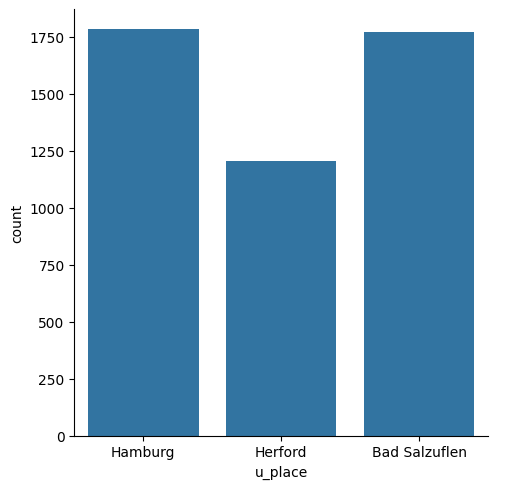

In [49]:
data = df_resid.copy()

sns.catplot(data=data, x="u_place", kind="count")

plt.show()

In [50]:
mask_hamburg = (data.u_place == "Hamburg").tolist()
mask_herford = (data.u_place == "Herford").tolist()
mask_bad_salzuflen = (data.u_place == "Bad Salzuflen").tolist()

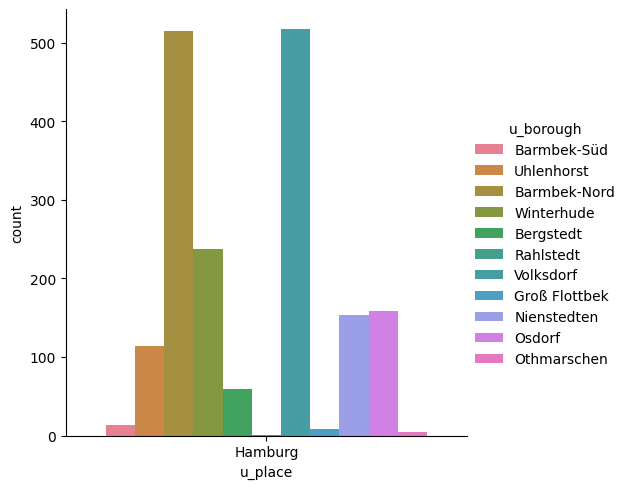

In [51]:
sns.catplot(data=data.iloc[mask_hamburg, :], 
            x="u_place", 
            hue="u_borough", 
            kind="count")

plt.show()

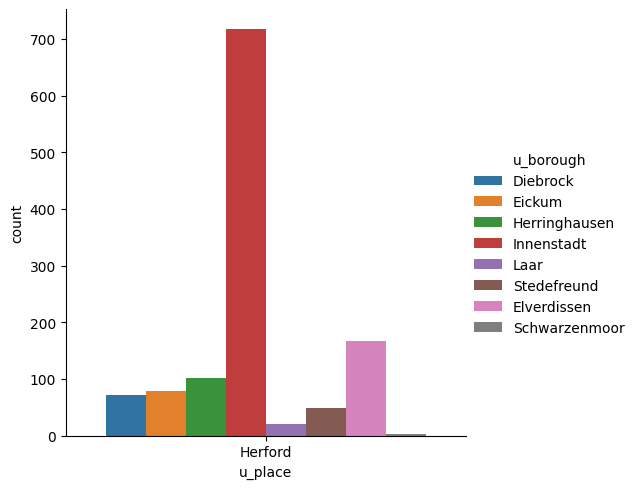

In [52]:
sns.catplot(data=data.iloc[mask_herford, :], 
            x="u_place", 
            hue="u_borough", 
            kind="count")

plt.show()

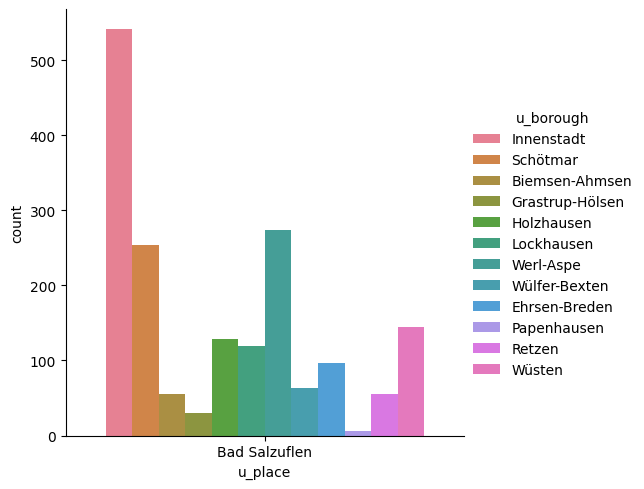

In [53]:
sns.catplot(data=data.iloc[mask_bad_salzuflen, :], 
            x="u_place", 
            hue="u_borough", 
            kind="count")

plt.show()

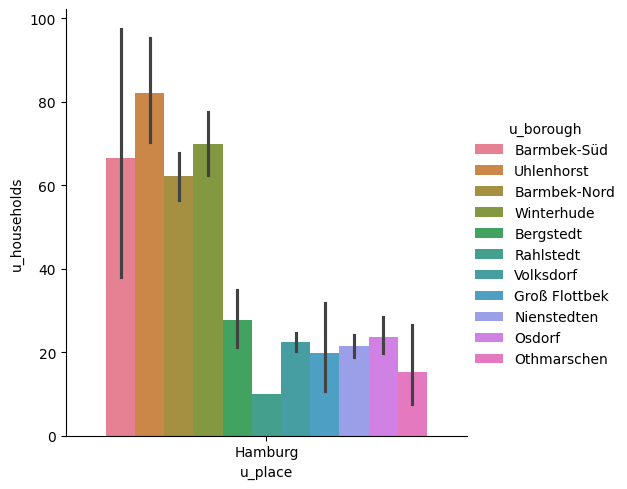

In [54]:
sns.catplot(data=data.iloc[mask_hamburg, :],
            x="u_place", y="u_households", 
            hue="u_borough",
            kind="bar")

plt.show()

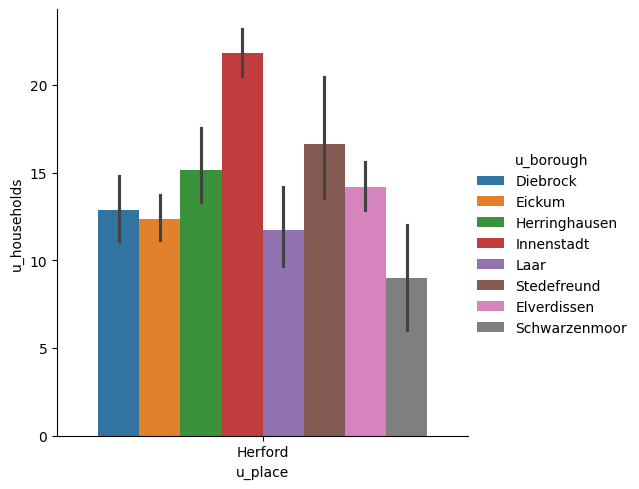

In [55]:
sns.catplot(data=data.iloc[mask_herford, :],
            x="u_place", 
            y="u_households", 
            hue="u_borough",
            kind="bar")

plt.show()

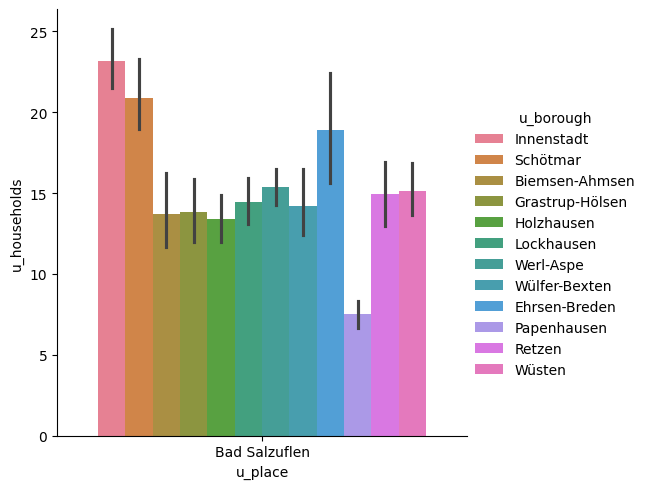

In [56]:
sns.catplot(data=data.iloc[mask_bad_salzuflen, :],
            x="u_place", 
            y="u_households", 
            hue="u_borough",
            kind="bar")

plt.show()

In [57]:
income_indices = data.iloc[:, [39, 42, 45, 48, 51, 54, 57, 60, 63]].columns
percentage_indices = data.iloc[:, [40, 43, 46, 49, 52, 55, 58, 61, 64]].columns
index_indices = data.iloc[:, [41, 44, 47, 50, 53, 56, 59, 62, 65]].columns

income_indices_org = income_indices.tolist()
percentage_indices_org = percentage_indices.tolist()
index_indices_org = index_indices.tolist()

fig_titles = (income_indices.str.replace("u_household_income_|to_under_", "", regex=True)).tolist()
print(fig_titles)

['up_to_1000', '1000_1500', '1500_2000', '2000_2500', '2500_3000', '3000_4000', '4000_5000', '5000_7000', '7000_and_higher']


#### Income

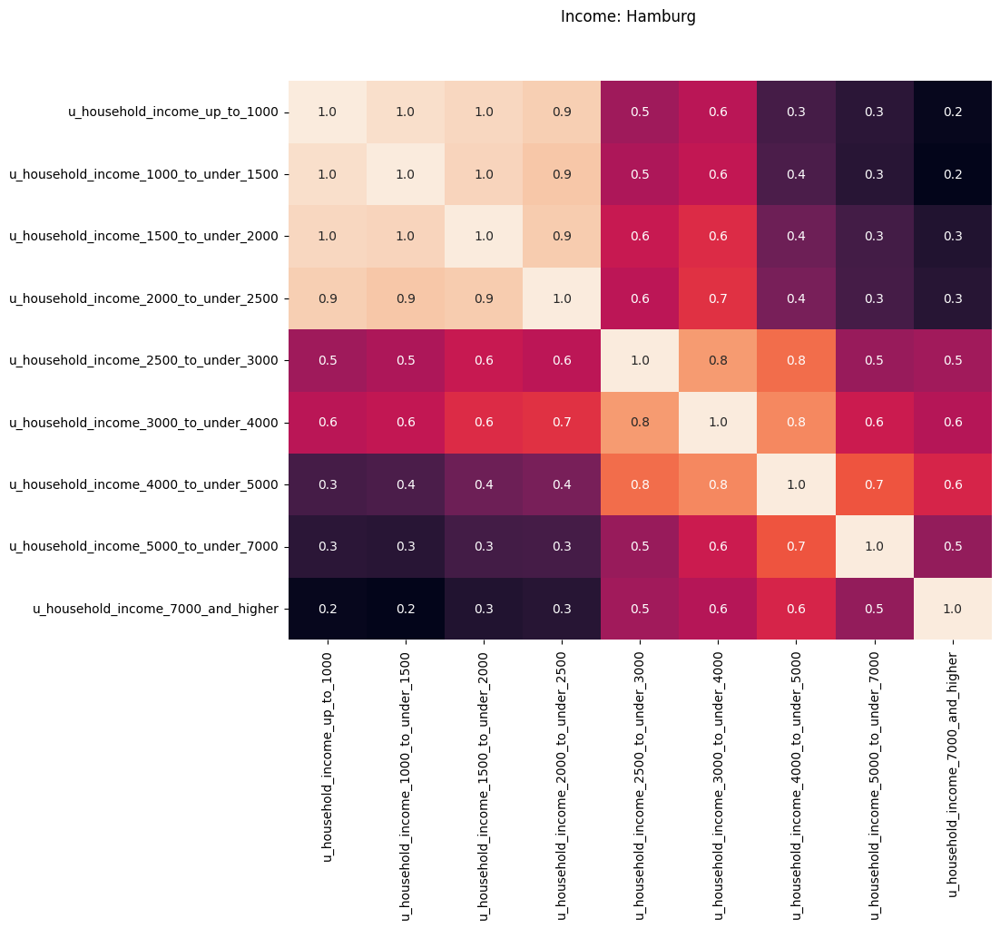

In [58]:
heatmap_plot(data=data, mask=mask_hamburg, indices=income_indices_org, title="Income: Hamburg")

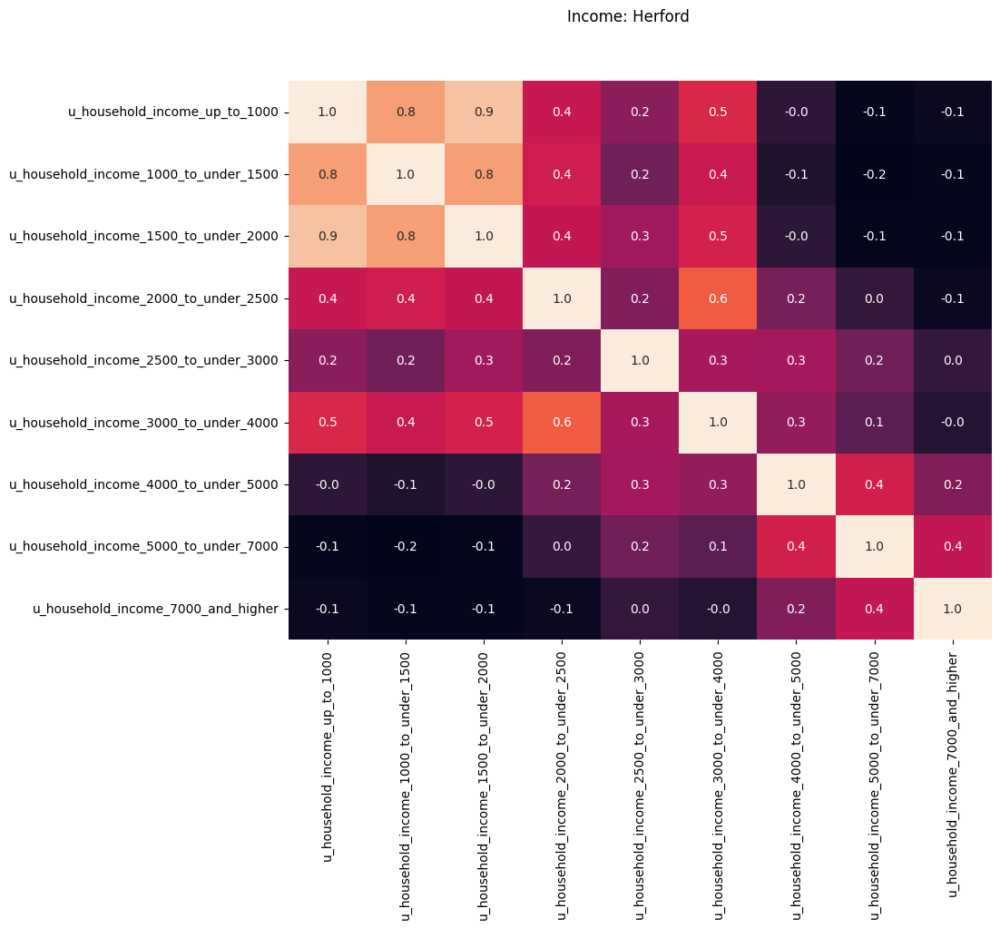

In [59]:
heatmap_plot(data=data, mask=mask_herford, indices=income_indices_org, title="Income: Herford")

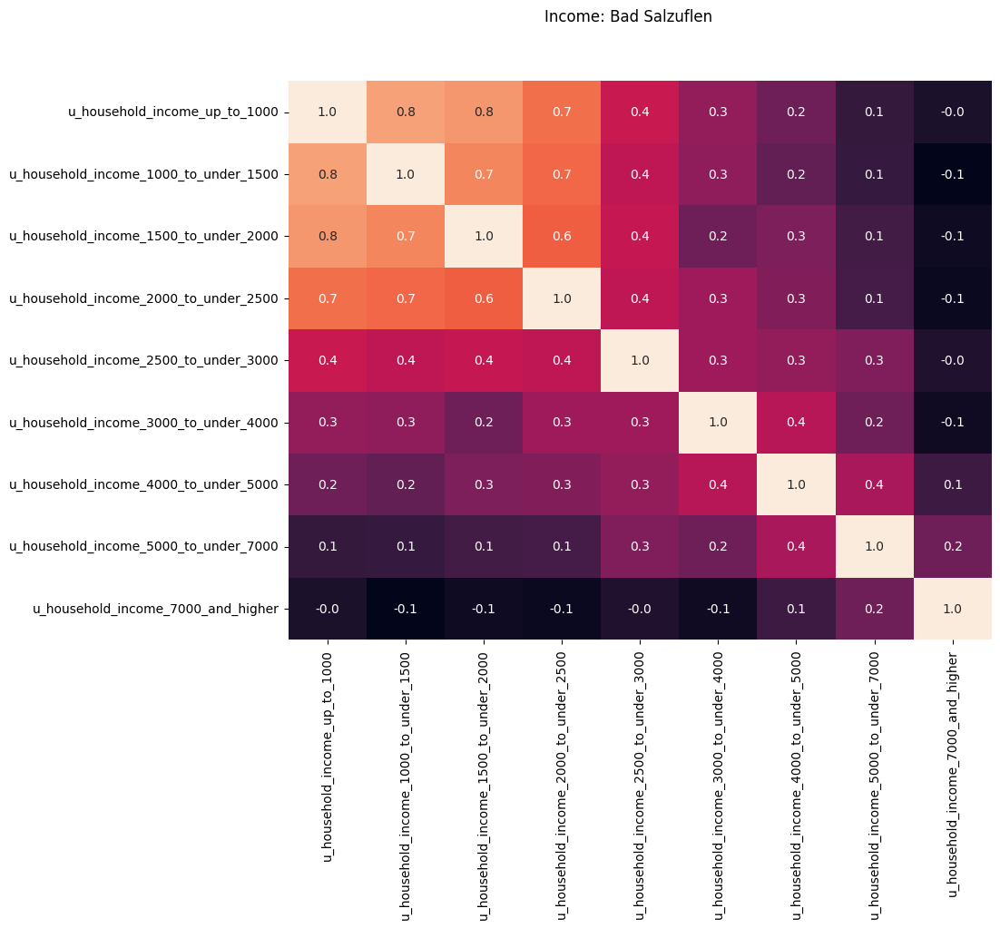

In [60]:
heatmap_plot(data=data, mask=mask_bad_salzuflen, indices=income_indices_org, title="Income: Bad Salzuflen")

In [61]:
nrows=3
ncols=3

columns = income_indices_org

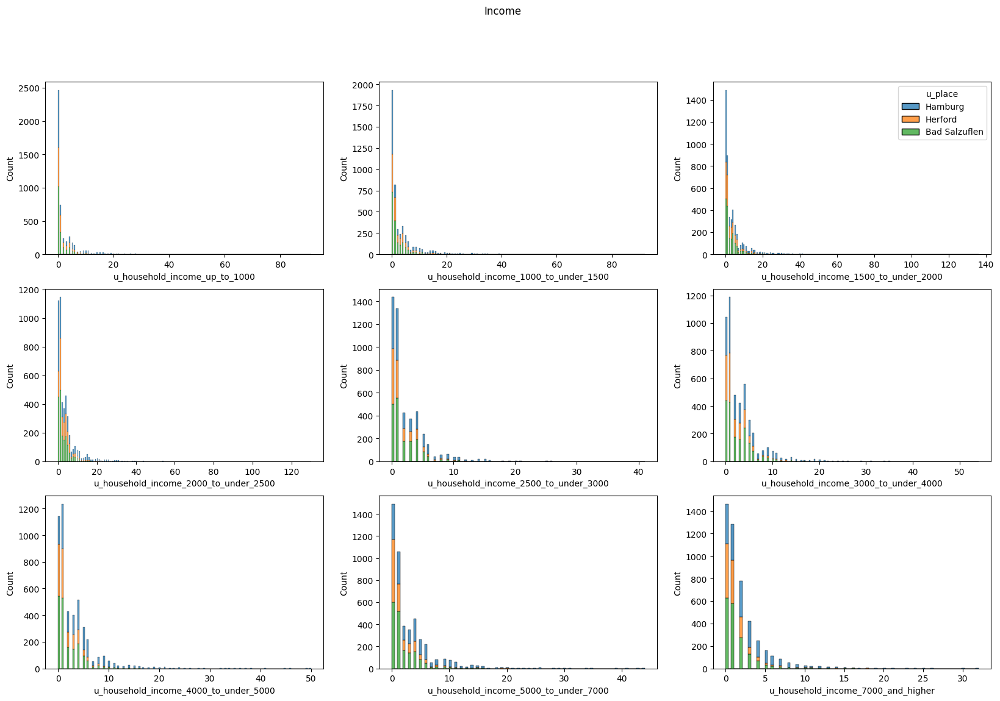

In [62]:
hist_plot(data=data, 
          x=columns,
          hue="u_place",
          fig_title="Income",
          nrows=nrows, 
          ncols=ncols)

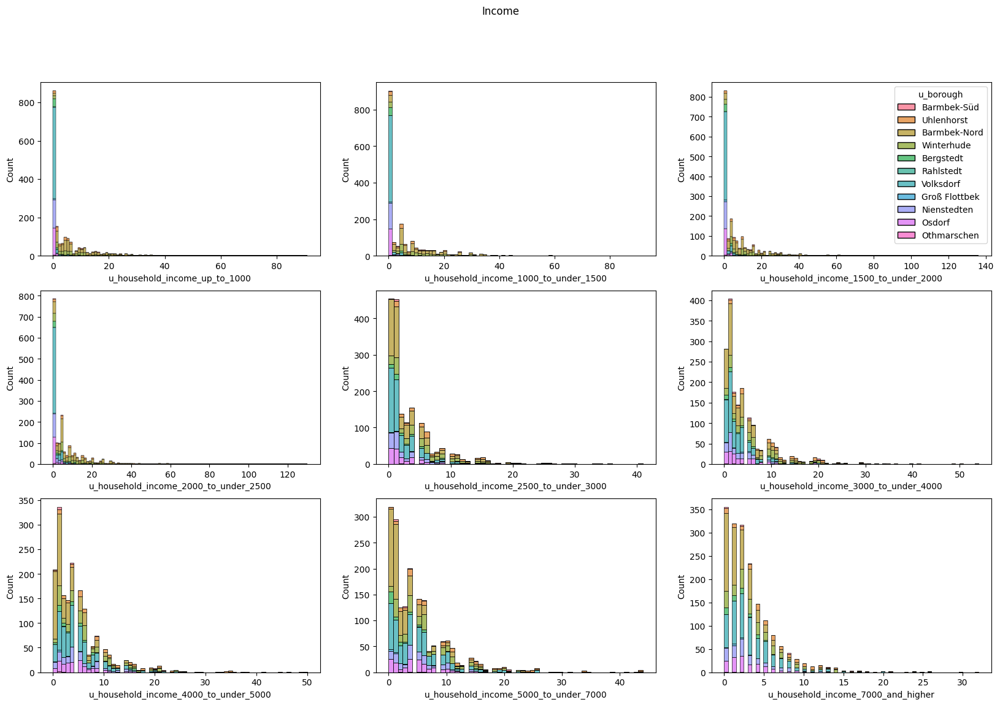

In [63]:
hist_plot(data=data.iloc[mask_hamburg, :], 
          x=columns,
          hue="u_borough",
          fig_title="Income", 
          nrows=nrows, 
          ncols=ncols)

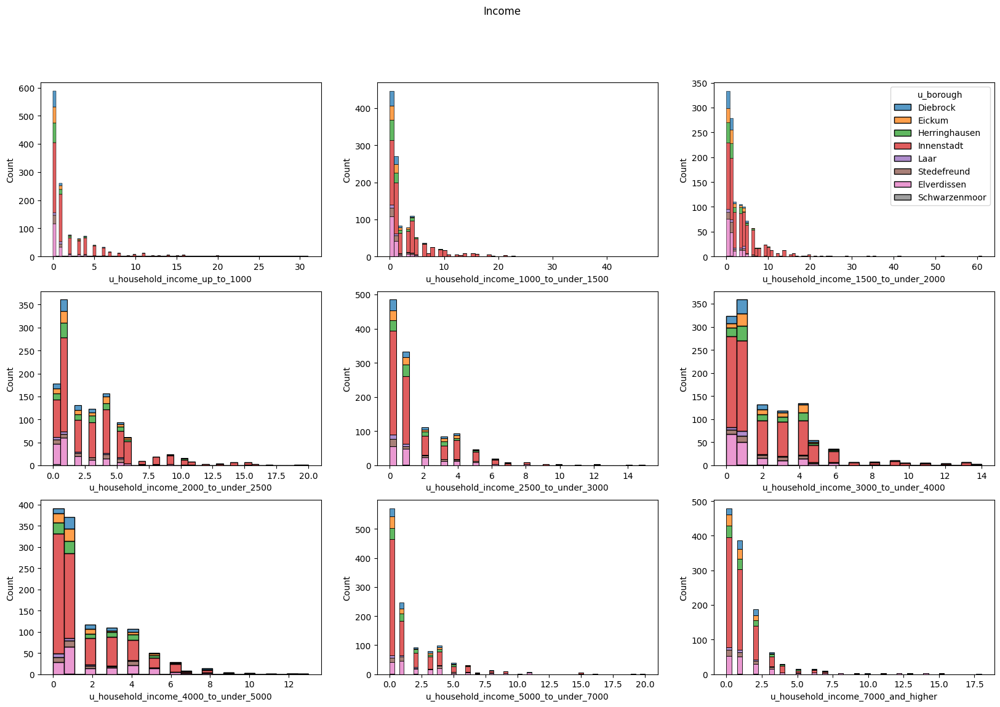

In [64]:
hist_plot(data=data.iloc[mask_herford, :],
          x=columns,
          hue="u_borough",
          fig_title="Income",
          nrows=nrows, 
          ncols=ncols)

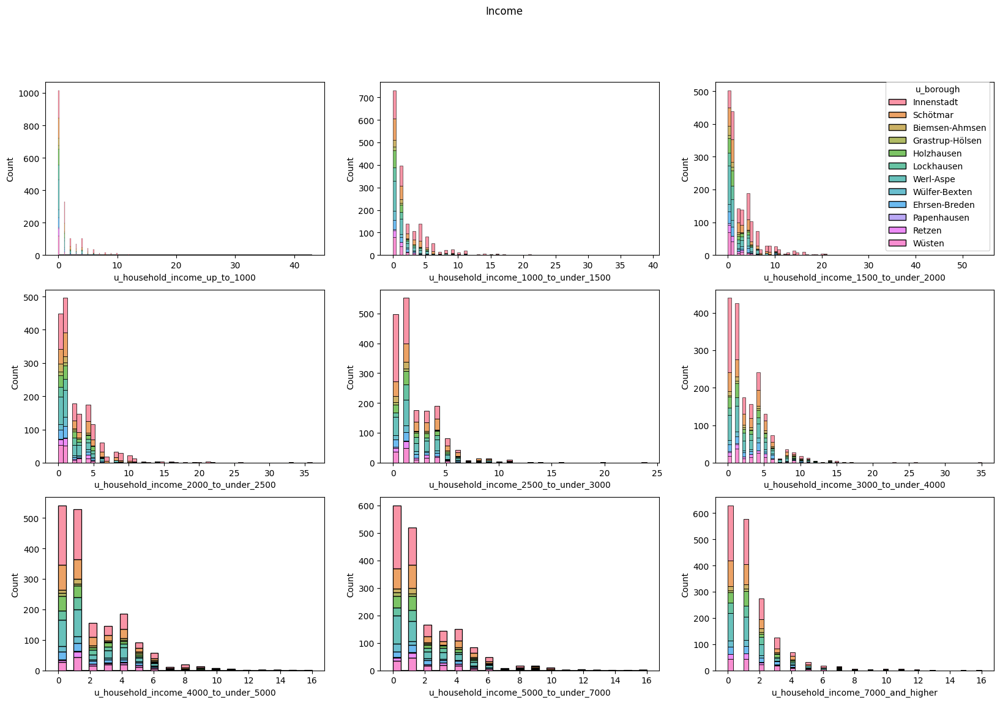

In [65]:
hist_plot(data=data.iloc[mask_bad_salzuflen, :],
          x=columns,
          hue="u_borough",
          fig_title="Income",
          nrows=nrows, 
          ncols=ncols)

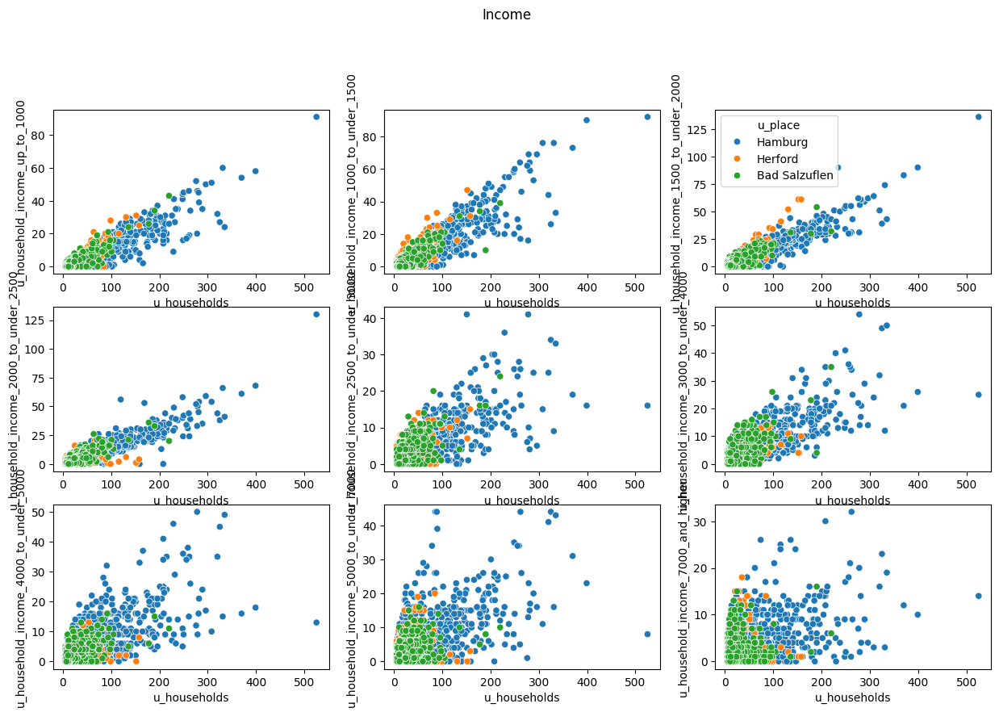

In [66]:
scatter_plot(data=data, 
             x="u_households",
             y=columns,
             hue="u_place",
             fig_title="Income",
             nrows=nrows, 
             ncols=ncols)

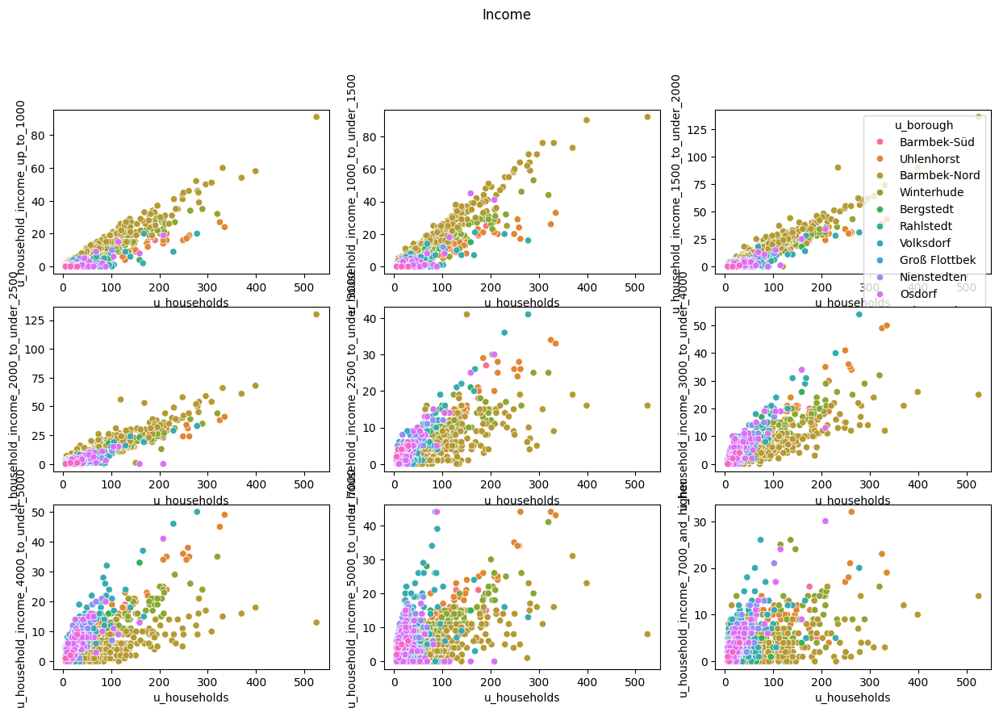

In [67]:
scatter_plot(data=data.iloc[mask_hamburg, :], 
             x="u_households", 
             y=columns, 
             hue="u_borough",
             fig_title="Income",
             nrows=nrows, 
             ncols=ncols)

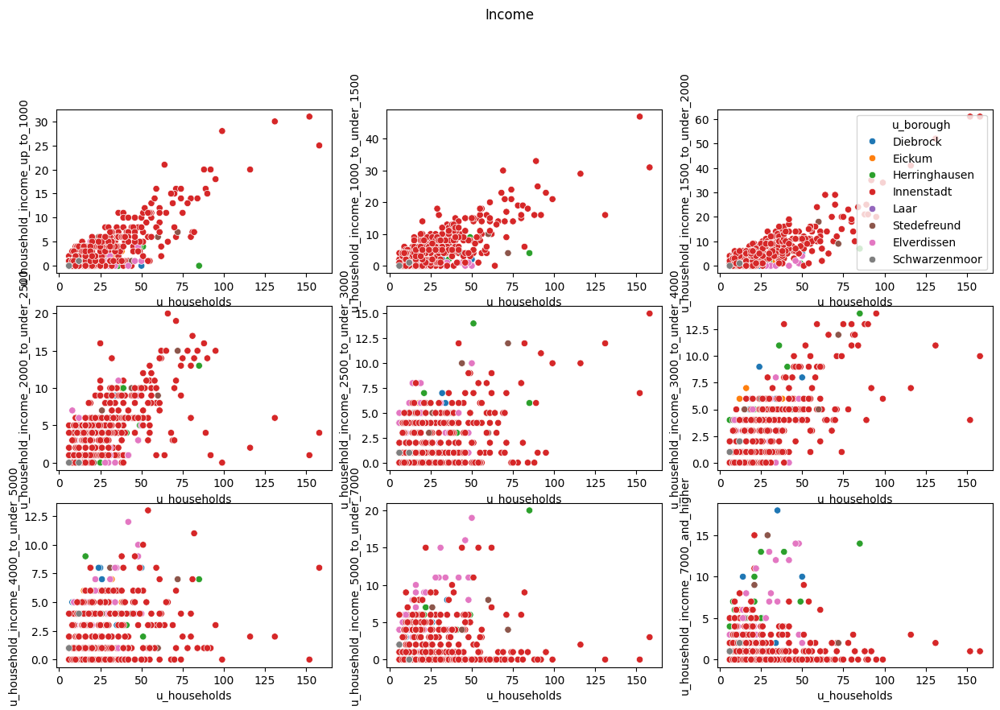

In [68]:
scatter_plot(data=data.iloc[mask_herford, :], 
             x="u_households", 
             y=columns, 
             hue="u_borough",
             fig_title="Income",
             nrows=nrows, 
             ncols=ncols)

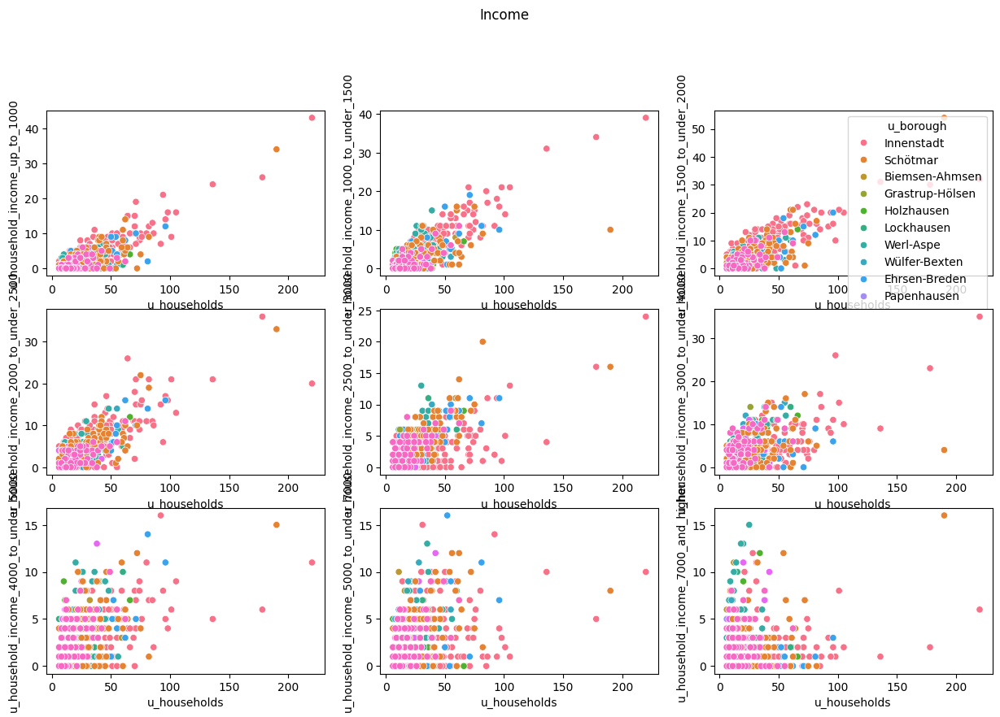

In [69]:
scatter_plot(data=data.iloc[mask_bad_salzuflen, :], 
             x="u_households", 
             y=columns, 
             hue="u_borough",
             fig_title="Income",
             nrows=nrows, 
             ncols=ncols)

#### Percentage

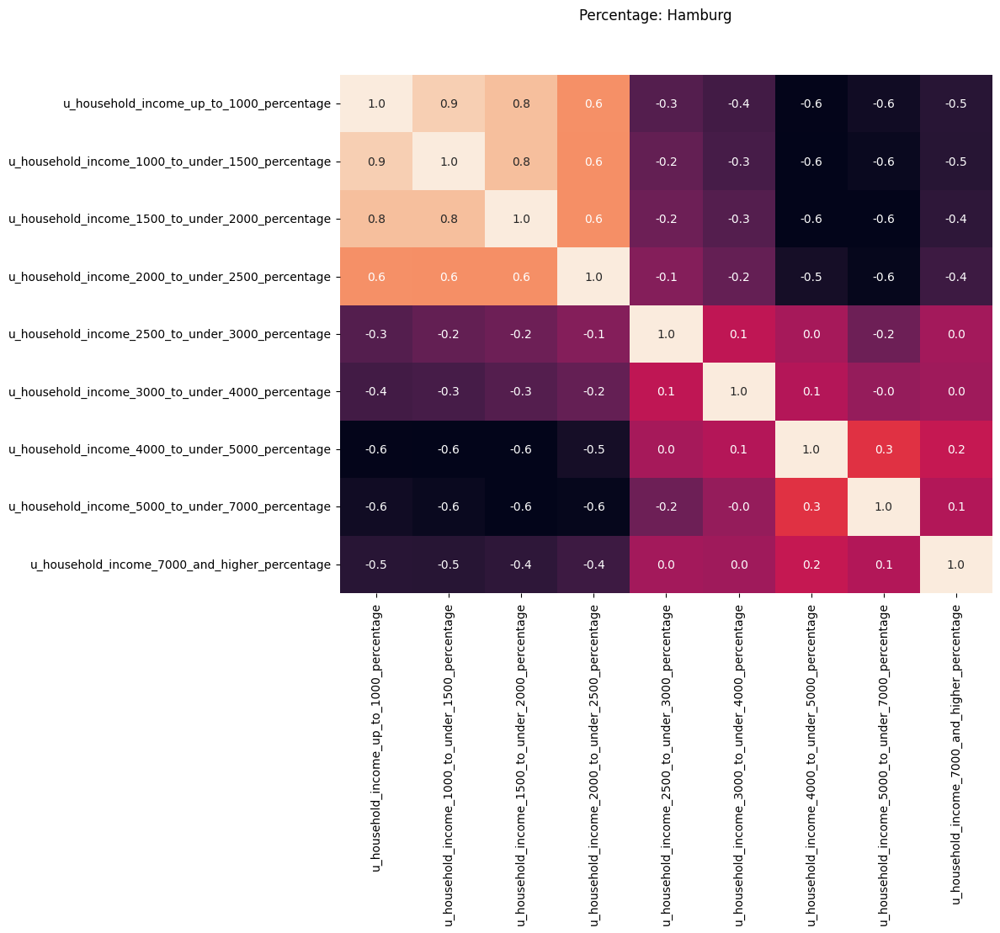

In [70]:
heatmap_plot(data=data, mask=mask_hamburg, indices=percentage_indices_org, title="Percentage: Hamburg")

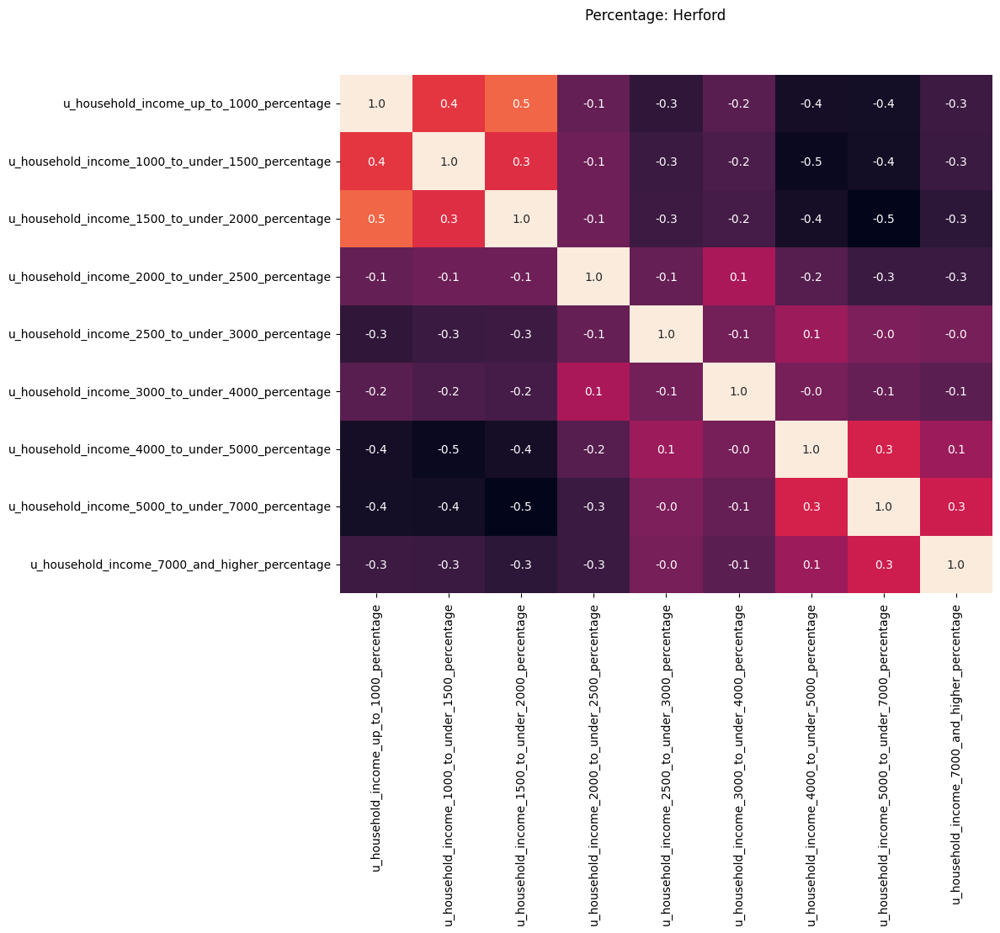

In [71]:
heatmap_plot(data=data, mask=mask_herford, indices=percentage_indices_org, title="Percentage: Herford")

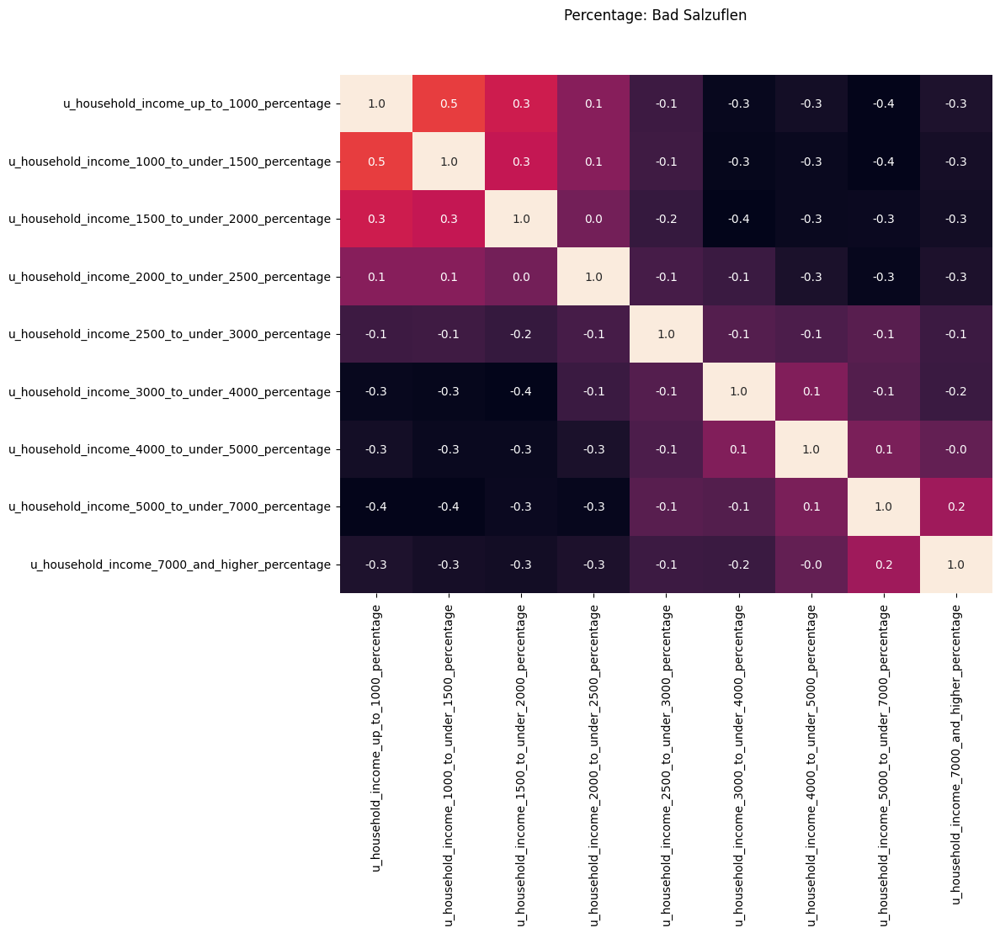

In [72]:
heatmap_plot(data=data, mask=mask_bad_salzuflen, indices=percentage_indices_org, title="Percentage: Bad Salzuflen")

In [73]:
columns = percentage_indices

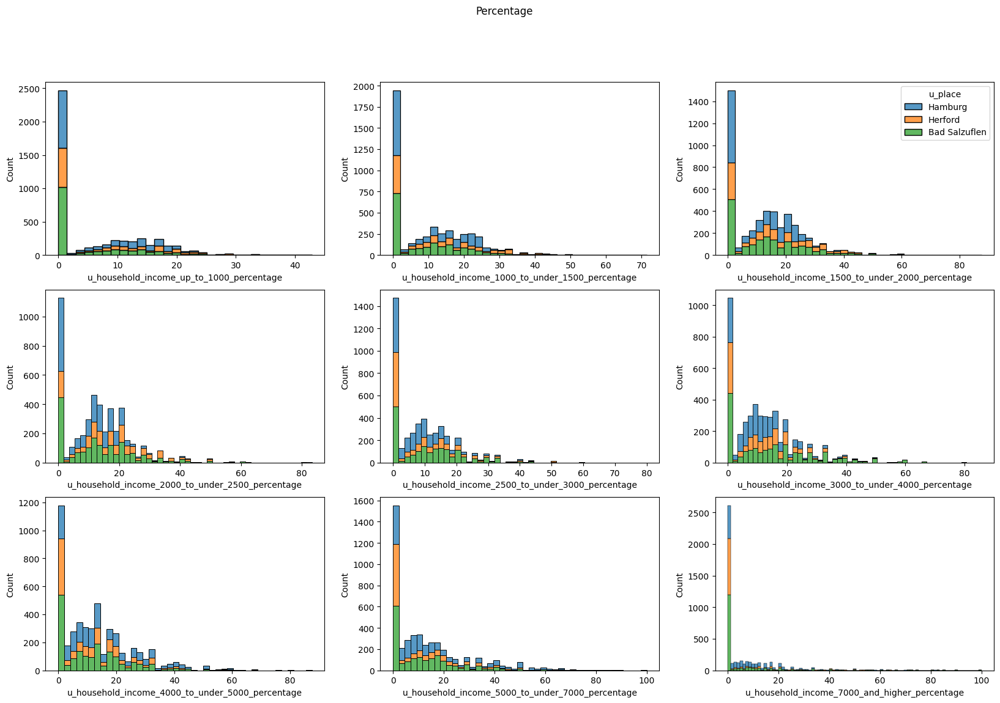

In [74]:
hist_plot(data=data, 
          x=columns,
          hue="u_place",
          fig_title="Percentage",
          nrows=nrows, 
          ncols=ncols)

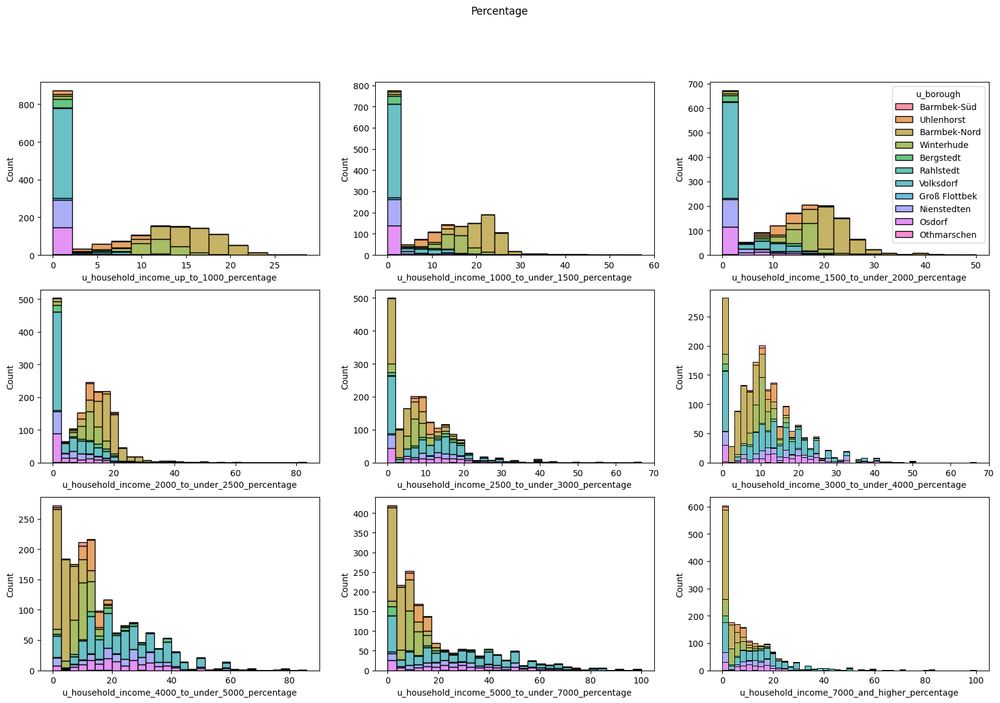

In [75]:
hist_plot(data=data.iloc[mask_hamburg, :], 
          x=columns,
          hue="u_borough",
          fig_title="Percentage",
          nrows=nrows, 
          ncols=ncols)

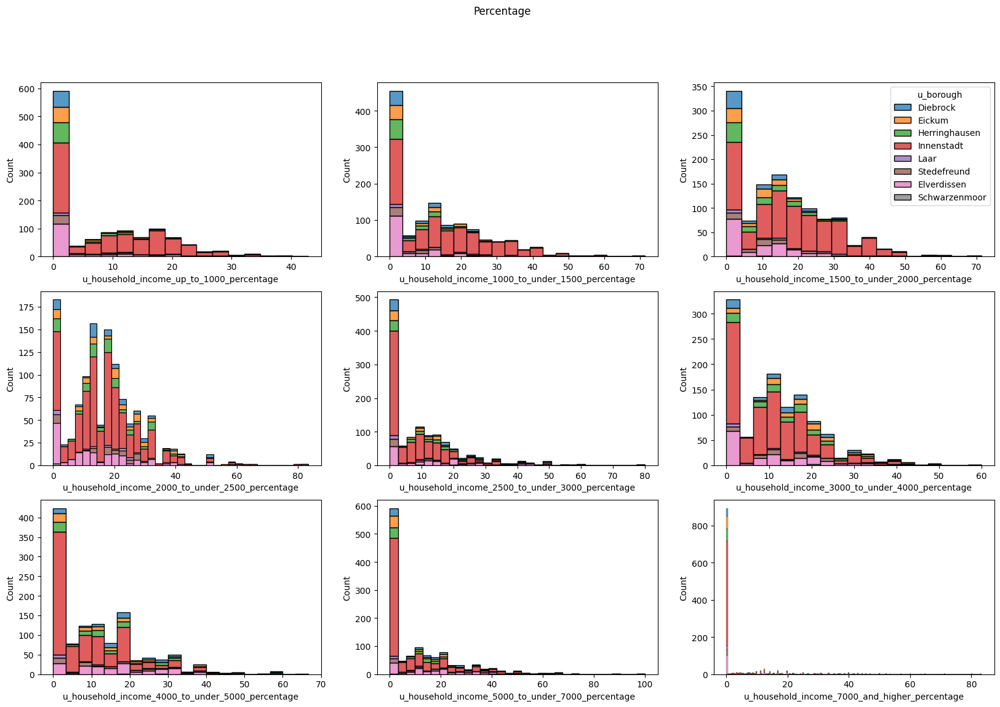

In [76]:
hist_plot(data=data.iloc[mask_herford, :], 
          x=columns,
          hue="u_borough",
          fig_title="Percentage",
          nrows=nrows, 
          ncols=ncols)

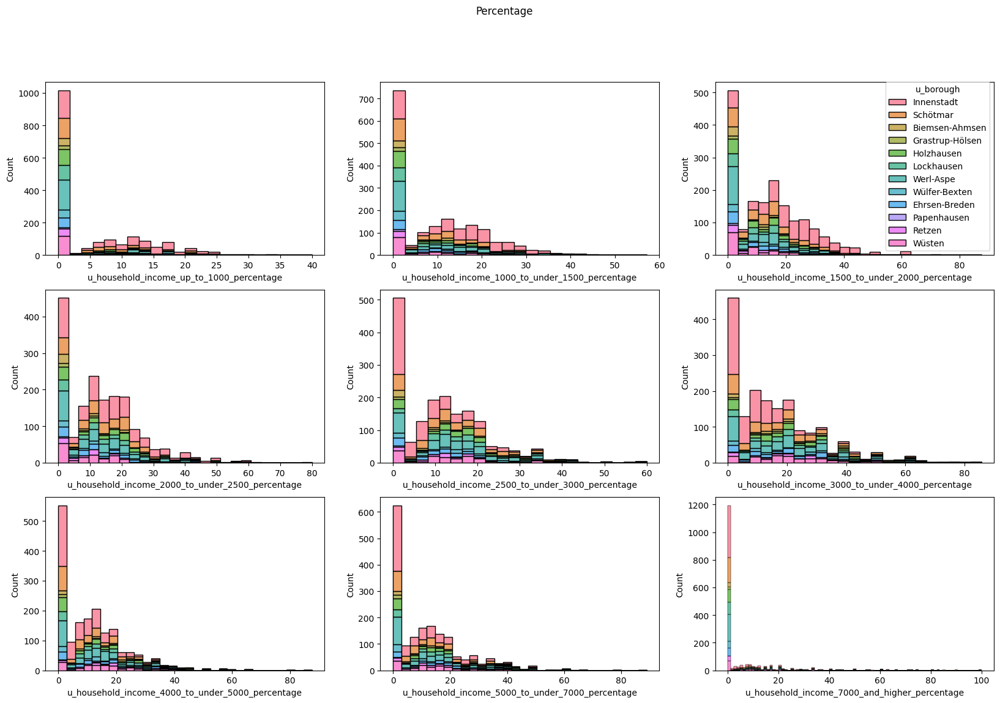

In [77]:
hist_plot(data=data.iloc[mask_bad_salzuflen, :], 
          x=columns,
          hue="u_borough",
          fig_title="Percentage",
          nrows=nrows, 
          ncols=ncols)

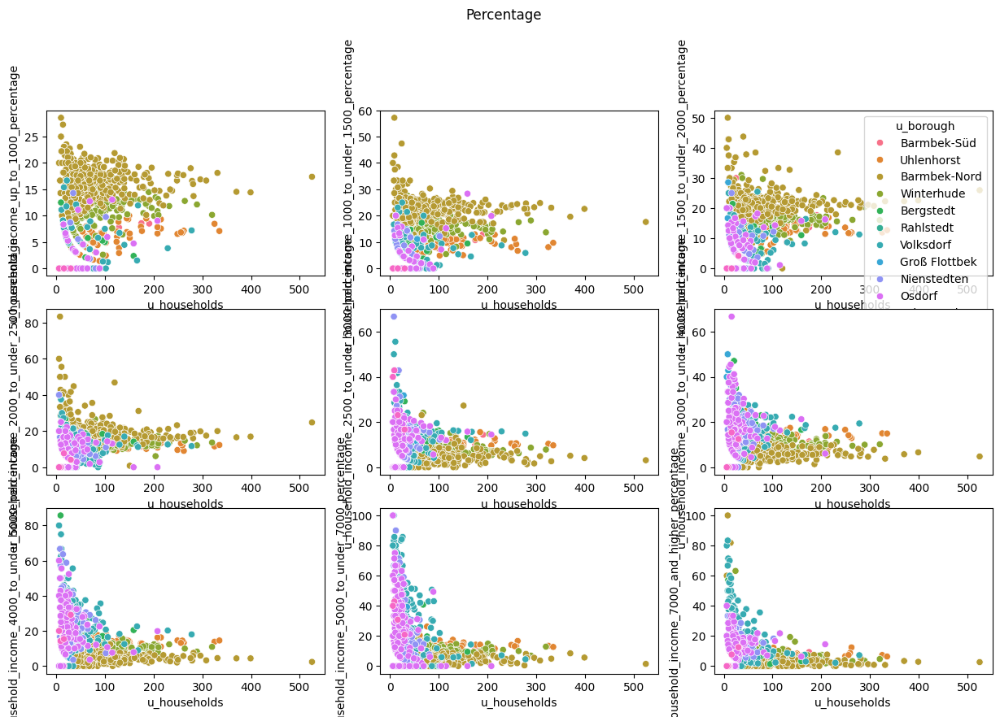

In [78]:
scatter_plot(data=data.iloc[mask_hamburg, :], 
             x="u_households", 
             y=columns, 
             hue="u_borough",
             fig_title="Percentage",
             nrows=nrows, 
             ncols=ncols)

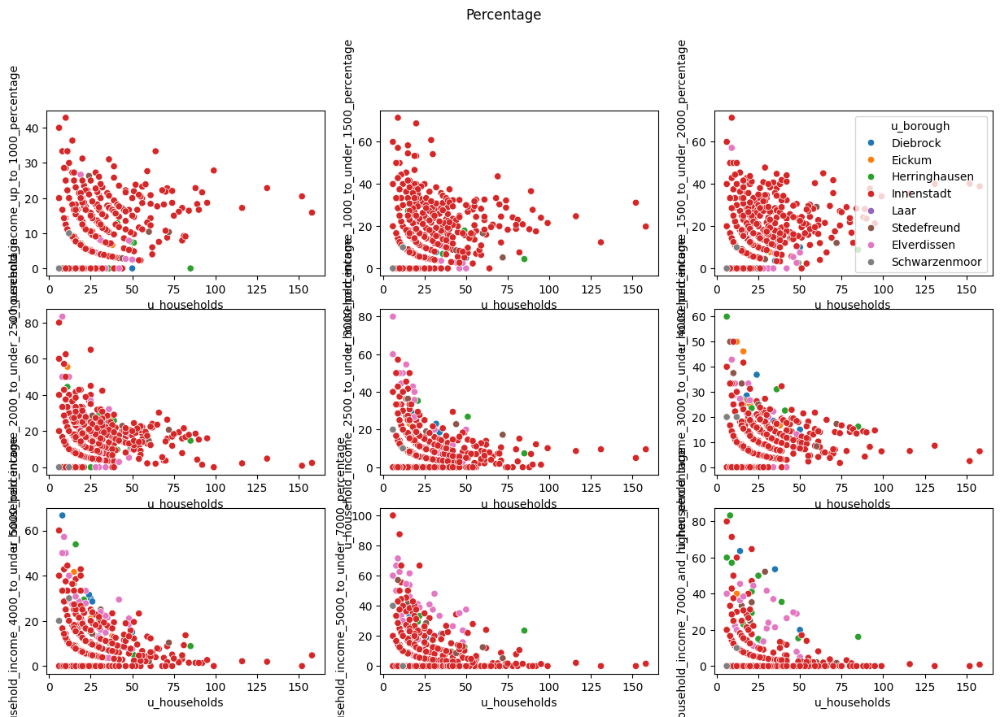

In [79]:
scatter_plot(data=data.iloc[mask_herford, :], 
             x="u_households", 
             y=columns, 
             hue="u_borough",
             fig_title="Percentage",
             nrows=nrows, 
             ncols=ncols)

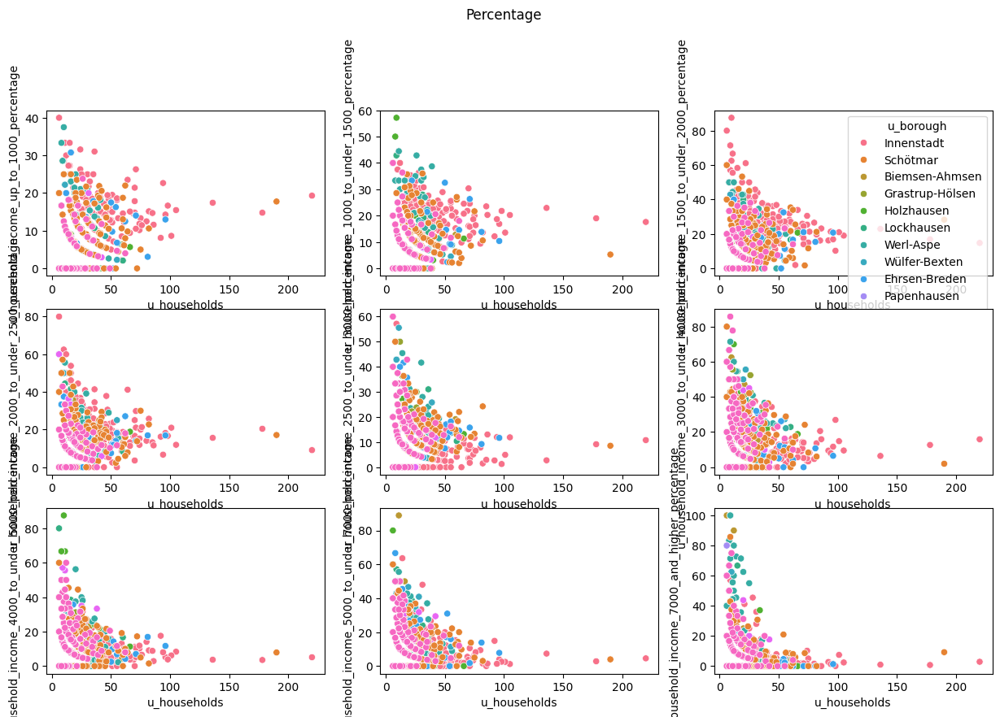

In [80]:
scatter_plot(data=data.iloc[mask_bad_salzuflen, :], 
             x="u_households", 
             y=columns, 
             hue="u_borough",
             fig_title="Percentage",
             nrows=nrows, 
             ncols=ncols)

#### Index

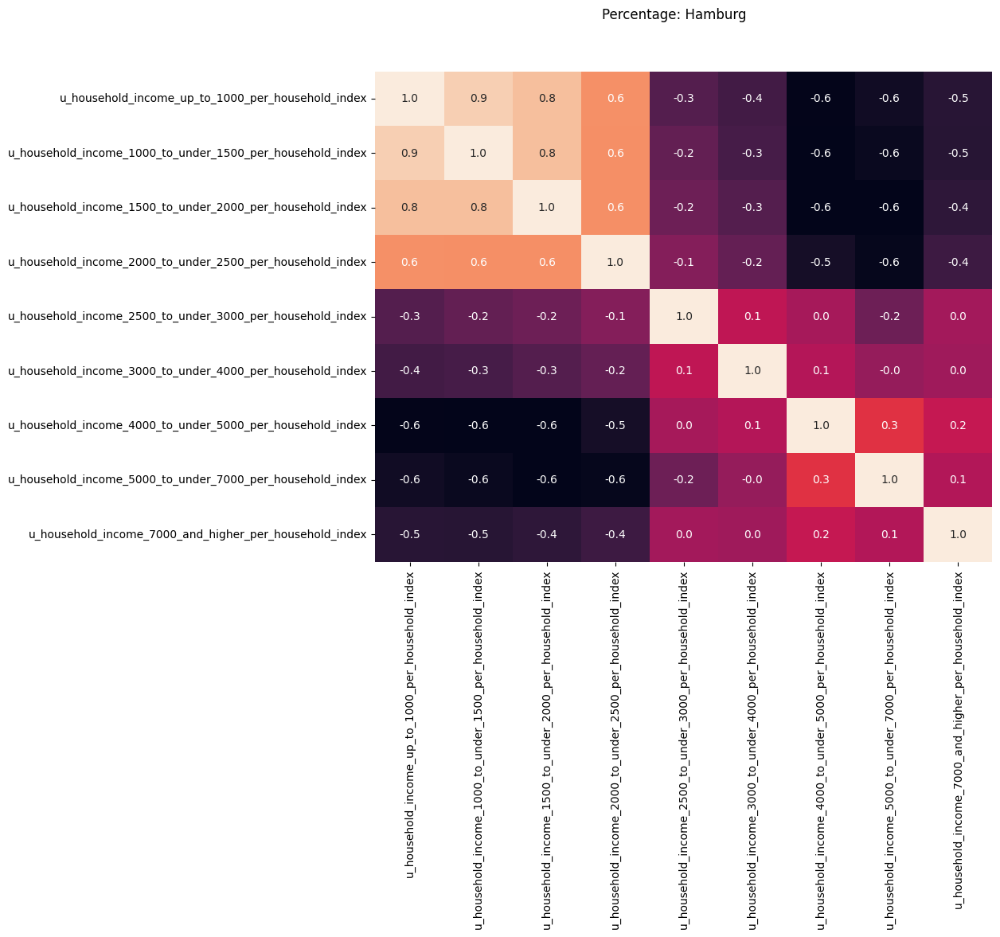

In [81]:
heatmap_plot(data=data, mask=mask_hamburg, indices=index_indices_org, title="Percentage: Hamburg")


In [82]:
columns = index_indices_org

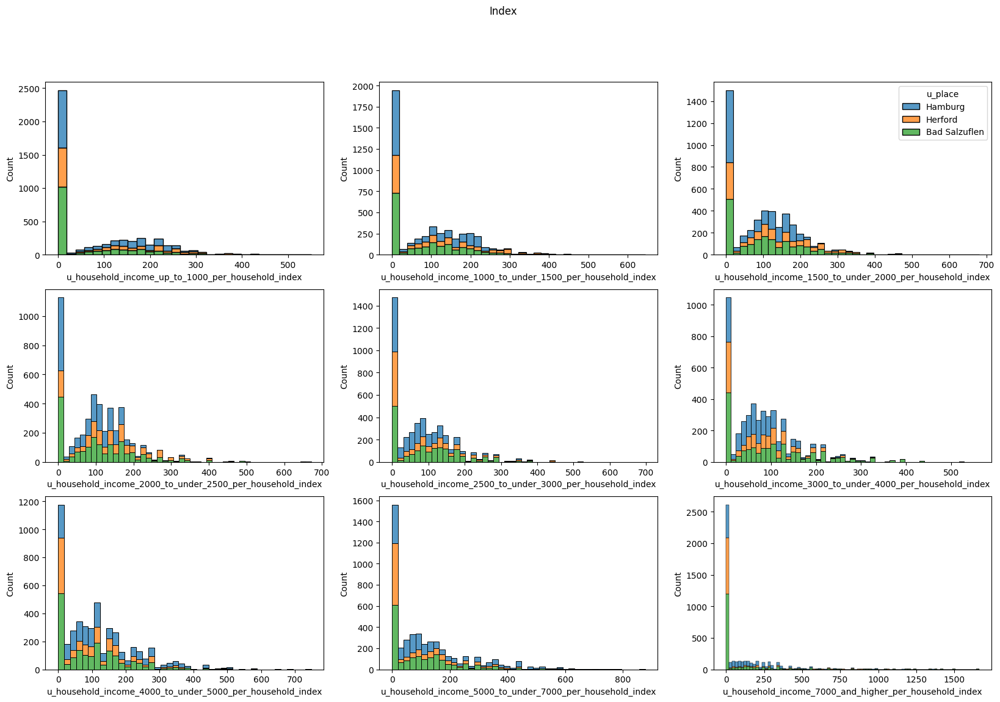

In [83]:
hist_plot(data=data, 
          x=columns,
          hue="u_place",
          fig_title="Index",
          nrows=nrows, 
          ncols=ncols)

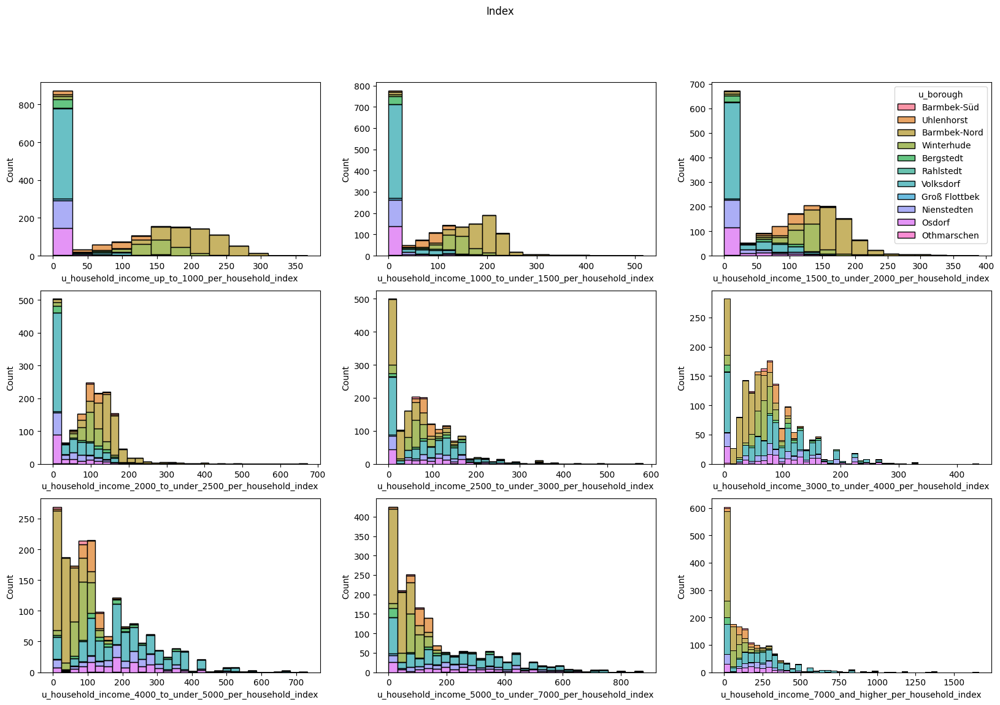

In [84]:
hist_plot(data=data.iloc[mask_hamburg, :], 
          x=columns,
          hue="u_borough",
          fig_title="Index",
          nrows=nrows, 
          ncols=ncols)

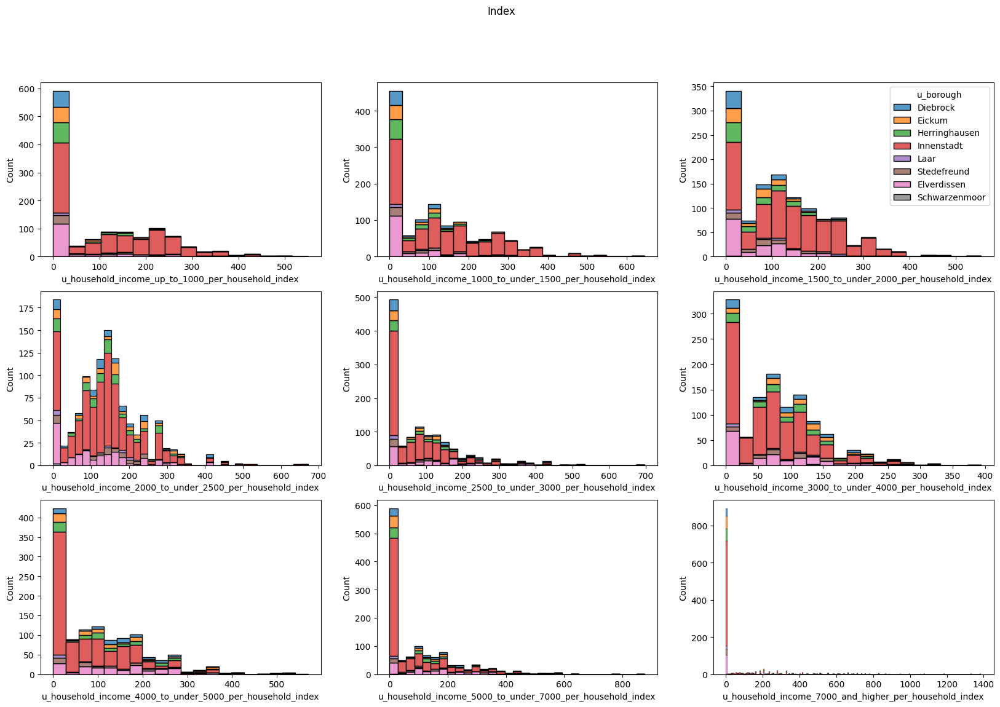

In [85]:
hist_plot(data=data.iloc[mask_herford, :], 
          x=columns,
          hue="u_borough",
          fig_title="Index",
          nrows=nrows, 
          ncols=ncols)

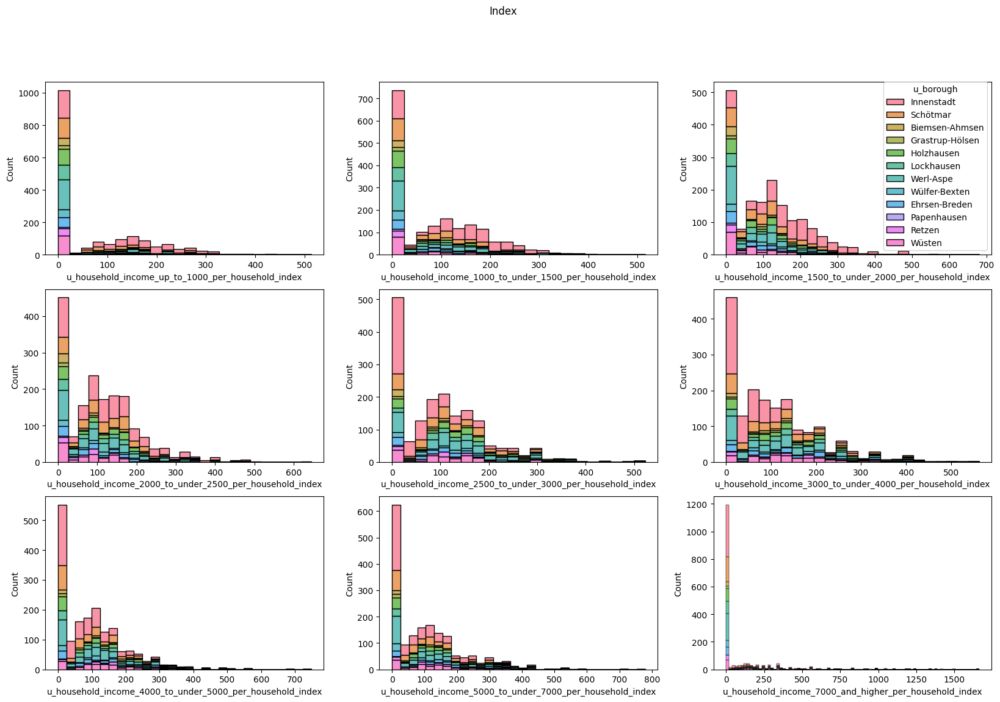

In [86]:
hist_plot(data=data.iloc[mask_bad_salzuflen, :], 
          x=columns,
          hue="u_borough",
          fig_title="Index",
          nrows=nrows, 
          ncols=ncols)

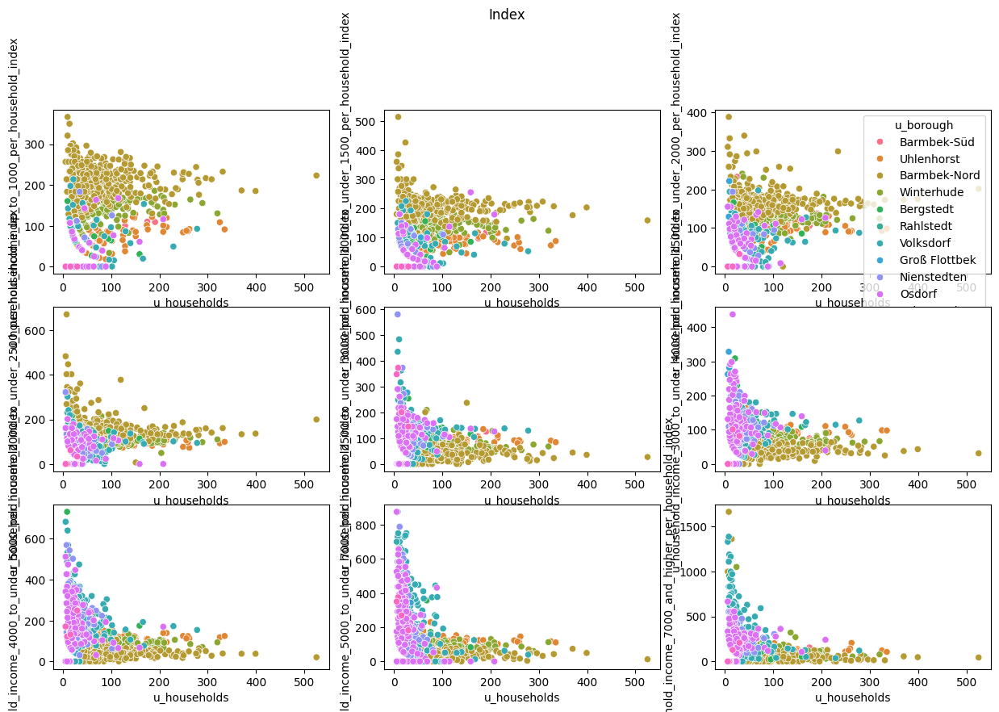

In [87]:
scatter_plot(data=data.iloc[mask_hamburg, :], 
             x="u_households", 
             y=columns, 
             hue="u_borough",
             fig_title="Index",
             nrows=nrows, 
             ncols=ncols)

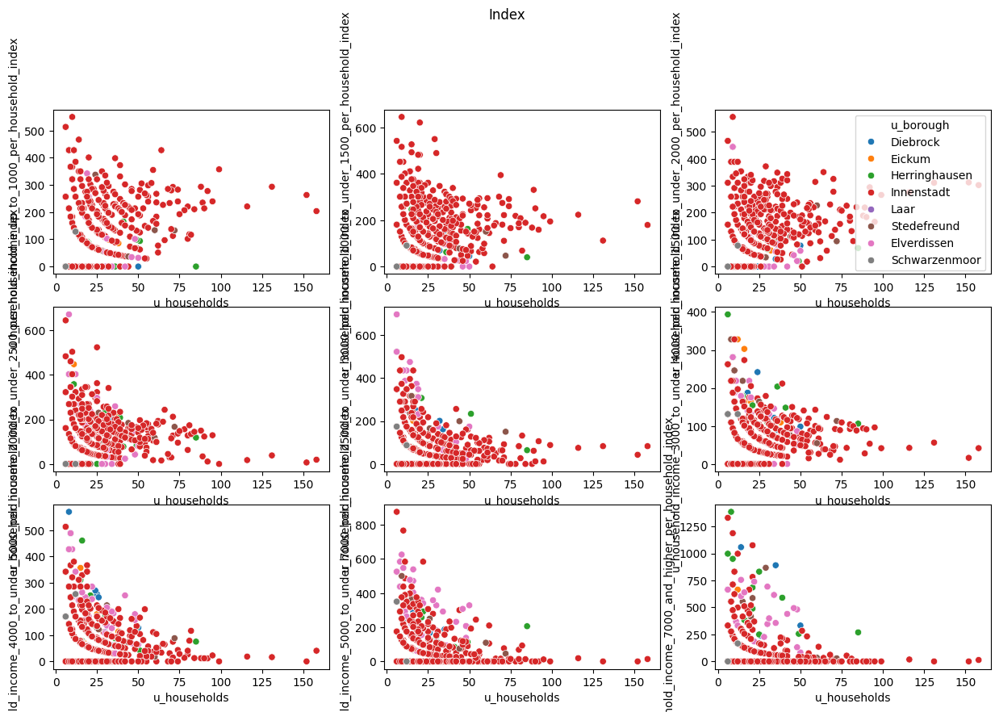

In [88]:
scatter_plot(data=data.iloc[mask_herford, :], 
             x="u_households", 
             y=columns, 
             hue="u_borough",
             fig_title="Index",
             nrows=nrows, 
             ncols=ncols)

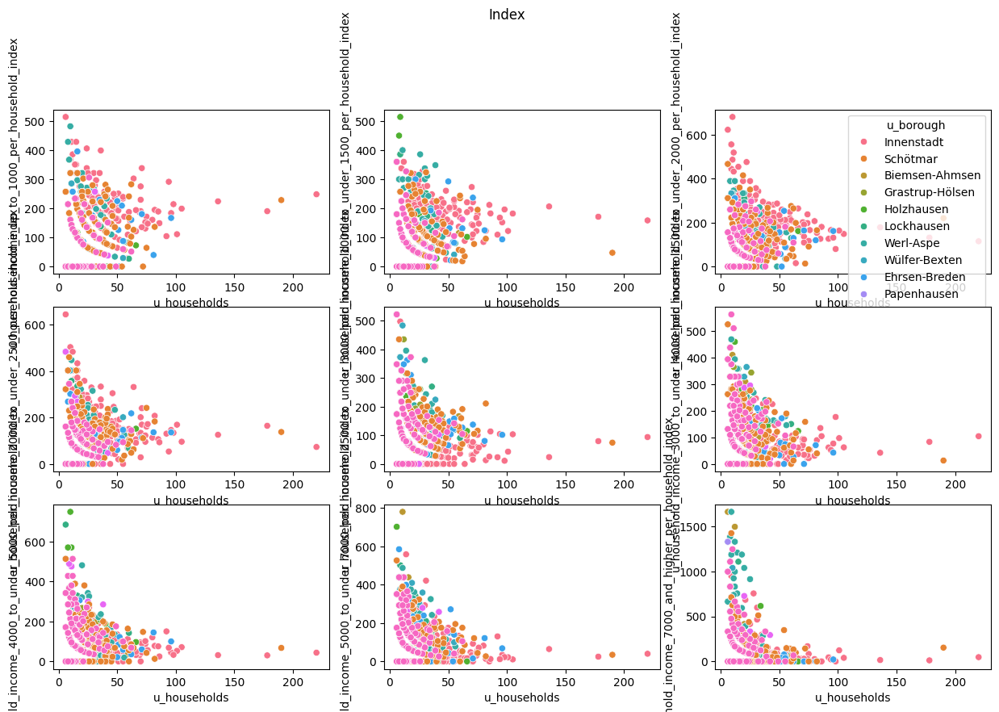

In [89]:
scatter_plot(data=data.iloc[mask_bad_salzuflen, :], 
             x="u_households", 
             y=columns, 
             hue="u_borough",
             fig_title="Index",
             nrows=nrows, 
             ncols=ncols)

## Housing Types and Feasibility of Solar Panel Installations in Different Areas:

In [90]:
df_resid.iloc[:, [8, 9, 10, 11, 14, 17, 20]].describe()

,u_inhabitants,u_households,u_household_size,u_single_person_households,u_multiple_person_households_without_children,u_multiple_person_households_with_children,u_immigrant_households
count,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000
mean,54.281539,28.234861,2.177211,13.346720,7.521867,7.240749,3.449537
std,58.881931,36.912169,0.618185,22.663688,8.562589,8.519778,6.924634
min,6.000000,6.000000,0.900000,0.000000,0.000000,0.000000,0.000000
25%,22.000000,10.000000,1.650000,2.000000,3.000000,2.000000,0.000000
50%,35.000000,16.000000,2.120000,5.000000,5.000000,5.000000,1.000000
75%,61.000000,30.000000,2.600000,14.000000,9.000000,9.000000,4.000000
max,757.000000,525.000000,4.830000,328.000000,104.000000,105.000000,93.000000


In [91]:
df_resid.iloc[:, [8, 9, 10, 12, 15, 18, 21]].describe()

,u_inhabitants,u_households,u_household_size,u_single_person_households_percentage,u_multiple_person_households_without_children_percentage,u_multiple_person_households_with_children_percentage,u_immigrant_households_percentage
count,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000
mean,54.281539,28.234861,2.177211,38.002042,31.543255,30.454695,10.351995
std,58.881931,36.912169,0.618185,23.071213,17.986195,19.849819,15.660374
min,6.000000,6.000000,0.900000,0.000000,0.000000,0.000000,0.000000
25%,22.000000,10.000000,1.650000,18.750000,20.000000,16.666700,0.000000
50%,35.000000,16.000000,2.120000,40.000000,28.571400,27.272700,5.000000
75%,61.000000,30.000000,2.600000,56.000000,41.666700,42.105300,14.285700
max,757.000000,525.000000,4.830000,100.000000,100.000000,100.000000,100.000000


In [92]:
df_resid.iloc[:, [8, 9, 10, 13, 16, 19, 22]].describe()

,u_inhabitants,u_households,u_household_size,u_single_person_households_per_household_index,u_multiple_person_households_without_children_per_household_index,u_multiple_person_households_with_children_per_household_index,u_immigrant_households_per_household_index
count,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000
mean,54.281539,28.234861,2.177211,92.950486,105.003783,104.742811,79.302648
std,58.881931,36.912169,0.618185,56.430632,59.873885,68.269470,119.968125
min,6.000000,6.000000,0.900000,0.000000,0.000000,0.000000,0.000000
25%,22.000000,10.000000,1.650000,45.861000,66.578000,57.322000,0.000000
50%,35.000000,16.000000,2.120000,97.837000,95.111000,93.799000,38.303000
75%,61.000000,30.000000,2.600000,136.972000,138.703000,144.813000,109.437000
max,757.000000,525.000000,4.830000,244.593000,332.888000,343.930000,766.062000


In [93]:
df_resid.iloc[:, [8, 9, 10, 66, 67, 68]].describe()

,u_inhabitants,u_households,u_household_size,u_residential_building,u_residential_and_commercial_building,u_commercial_building
count,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000
mean,54.281539,28.234861,2.177211,7.177250,0.602607,0.709420
std,58.881931,36.912169,0.618185,5.638749,0.960736,1.391458
min,6.000000,6.000000,0.900000,1.000000,0.000000,0.000000
25%,22.000000,10.000000,1.650000,4.000000,0.000000,0.000000
50%,35.000000,16.000000,2.120000,6.000000,0.000000,0.000000
75%,61.000000,30.000000,2.600000,9.000000,1.000000,1.000000
max,757.000000,525.000000,4.830000,57.000000,11.000000,16.000000


In [94]:
df_resid.iloc[:, [8, 9, 10, 69, 72, 75, 78]].describe()

,u_inhabitants,u_households,u_household_size,u_1_2_family_accommodation,u_3_6_family_accommodation,u_7_19_family_accommodation,u_20_and_more_family_accommodation
count,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000
mean,54.281539,28.234861,2.177211,12.691758,4.543314,9.388352,1.515770
std,58.881931,36.912169,0.618185,12.234032,8.959942,26.487097,8.439527
min,6.000000,6.000000,0.900000,0.000000,0.000000,0.000000,0.000000
25%,22.000000,10.000000,1.650000,6.000000,0.000000,0.000000,0.000000
50%,35.000000,16.000000,2.120000,10.000000,2.000000,0.000000,0.000000
75%,61.000000,30.000000,2.600000,16.000000,5.000000,4.000000,0.000000
max,757.000000,525.000000,4.830000,161.000000,159.000000,312.000000,159.000000


In [95]:
df_resid.iloc[:, [8, 9, 10, 70, 73, 76, 79]].describe()

,u_inhabitants,u_households,u_household_size,u_1_2_family_accommodation_percentage,u_3_6_family_accommodation_percentage,u_7_19_family_accommodation_percentage,u_20_and_more_family_accommodation_percentage
count,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000
mean,54.281539,28.234861,2.177211,66.137977,16.217774,15.857293,1.786955
std,58.881931,36.912169,0.618185,36.169547,22.289370,30.363019,9.672977
min,6.000000,6.000000,0.900000,0.000000,0.000000,0.000000,0.000000
25%,22.000000,10.000000,1.650000,42.857100,0.000000,0.000000,0.000000
50%,35.000000,16.000000,2.120000,80.000000,7.142900,0.000000,0.000000
75%,61.000000,30.000000,2.600000,100.000000,25.000000,16.666700,0.000000
max,757.000000,525.000000,4.830000,100.000000,100.000000,100.000000,100.000000


In [96]:
df_resid.iloc[:, [8, 9, 10, 71, 74, 77, 80]].describe()

,u_inhabitants,u_households,u_household_size,u_1_2_family_accommodation_index_per_residential_building,u_3_6_family_accommodation_index_per_residential_building,u_7_19_family_accommodation_index_per_residential_building,u_20_and_more_family_accommodation_index_per_residential_building
count,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000
mean,54.281539,28.234861,2.177211,79.234127,148.789257,308.825135,361.745079
std,58.881931,36.912169,0.618185,43.331495,204.492858,591.328082,1958.164029
min,6.000000,6.000000,0.900000,0.000000,0.000000,0.000000,0.000000
25%,22.000000,10.000000,1.650000,51.343000,0.000000,0.000000,0.000000
50%,35.000000,16.000000,2.120000,95.841000,65.532000,0.000000,0.000000
75%,61.000000,30.000000,2.600000,119.801000,229.361000,324.588000,0.000000
max,757.000000,525.000000,4.830000,119.801000,917.446000,1947.527000,20243.654000


### Data Visualization

#### Single Person Households

In [97]:
sph_indices = data.iloc[:, [8, 9, 10, 11, 14, 17, 20]].columns
sph_percentage_indices = data.iloc[:, [8, 9, 10, 12, 15, 18,  21]].columns
sph_index_indices = data.iloc[:, [8, 9, 10, 13, 16, 19, 22]].columns

sph_indices_org = sph_indices.tolist()
sph_percentage_indices_org = sph_percentage_indices.tolist()
sph_index_indices_org = sph_index_indices.tolist()

In [98]:
nrows=3
ncols=3

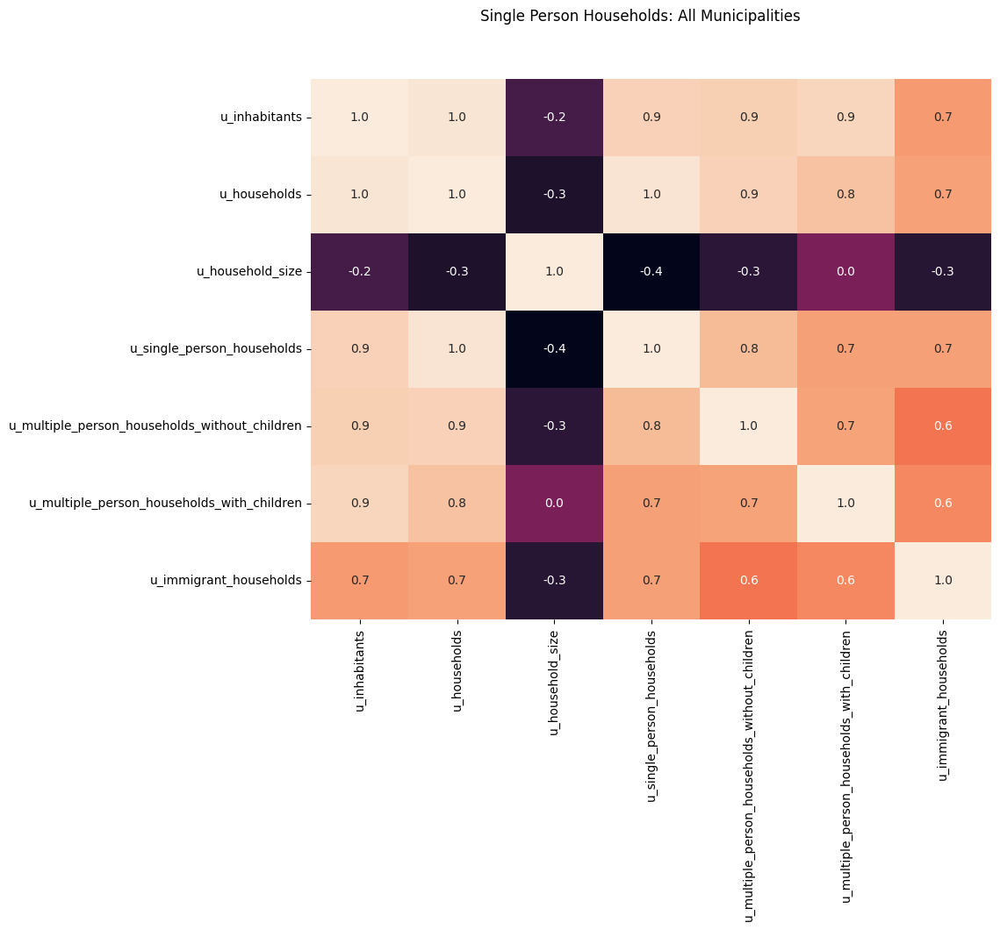

In [99]:
heatmap_plot(data=data, mask=None, indices=sph_indices_org, title="Single Person Households: All Municipalities")

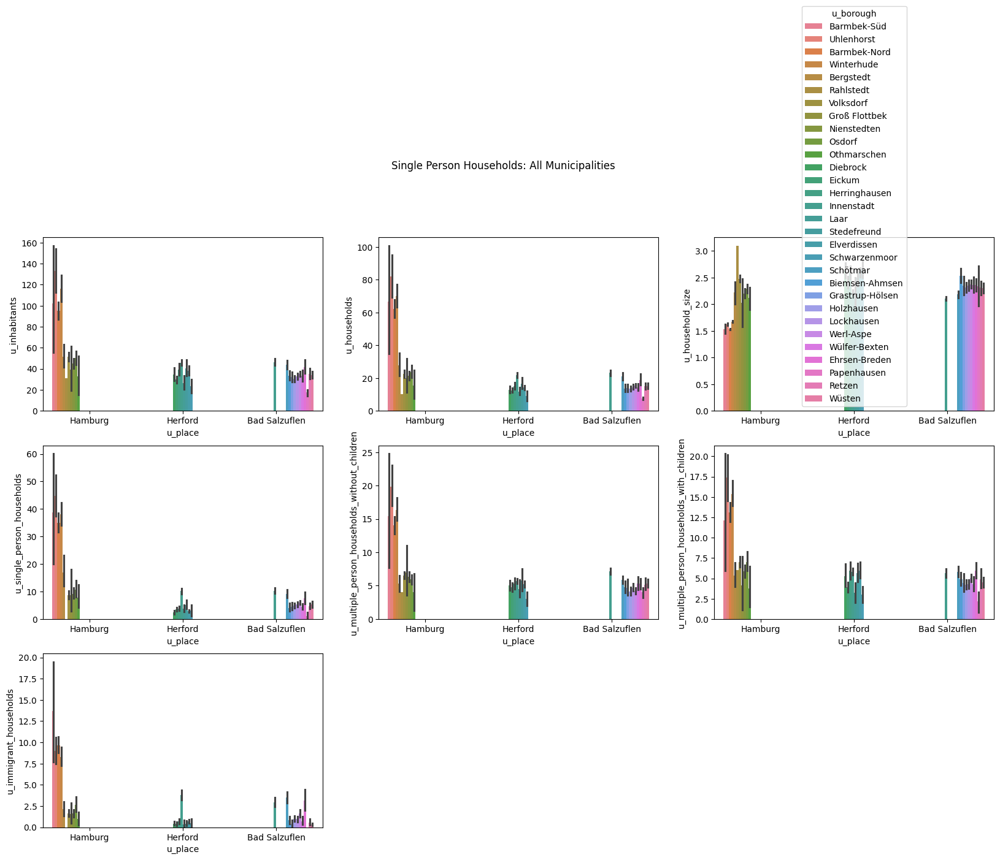

In [100]:
bar_plot(data=data, 
         x="u_place", 
         y=sph_indices_org, 
         hue="u_borough", 
         fig_title="Single Person Households: All Municipalities", 
         nrows=nrows, 
         ncols=ncols)

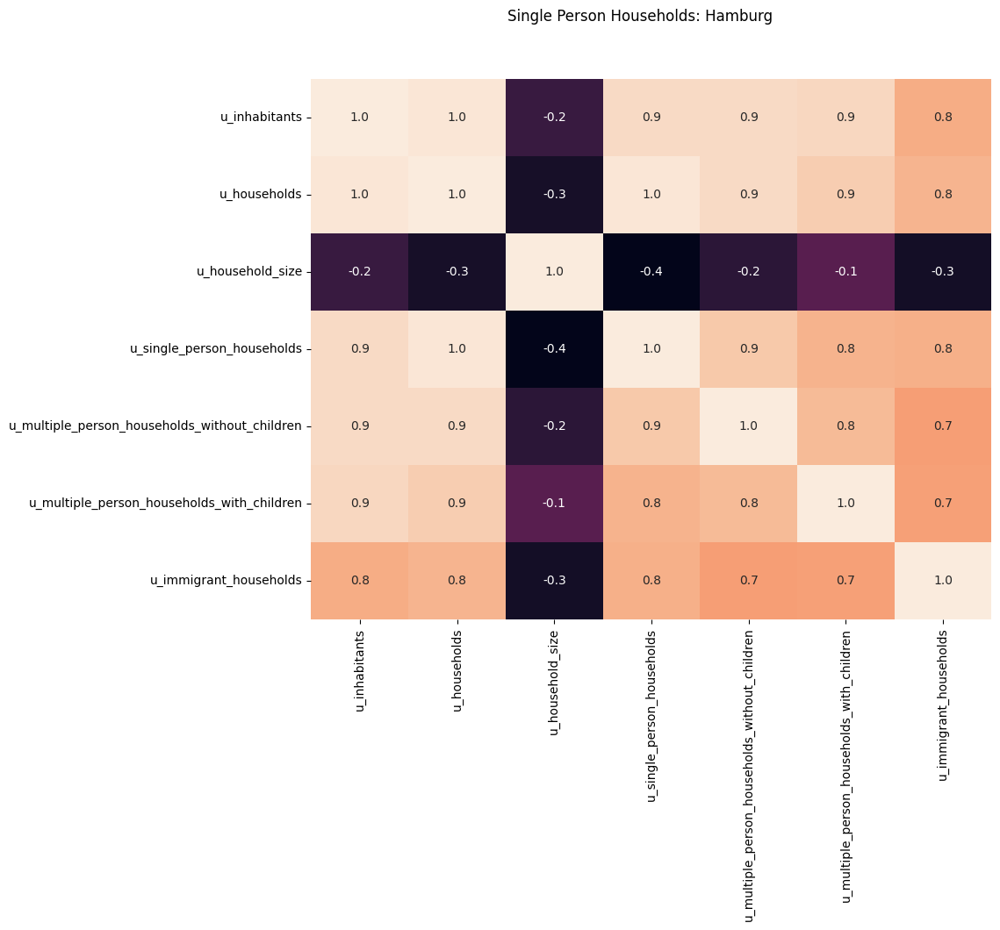

In [101]:
heatmap_plot(data=data, mask=mask_hamburg, indices=sph_indices_org, title="Single Person Households: Hamburg")

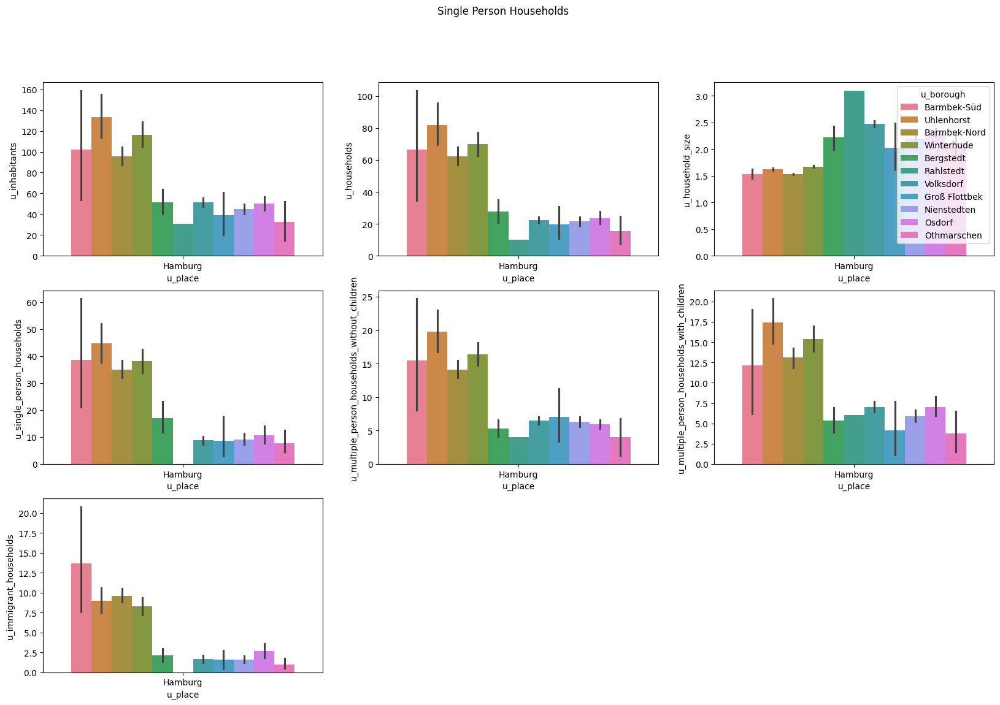

In [102]:
bar_plot(data=data.iloc[mask_hamburg, :], 
         x="u_place", 
         y=sph_indices_org, 
         hue="u_borough", 
         fig_title="Single Person Households", 
         nrows=nrows, 
         ncols=ncols)

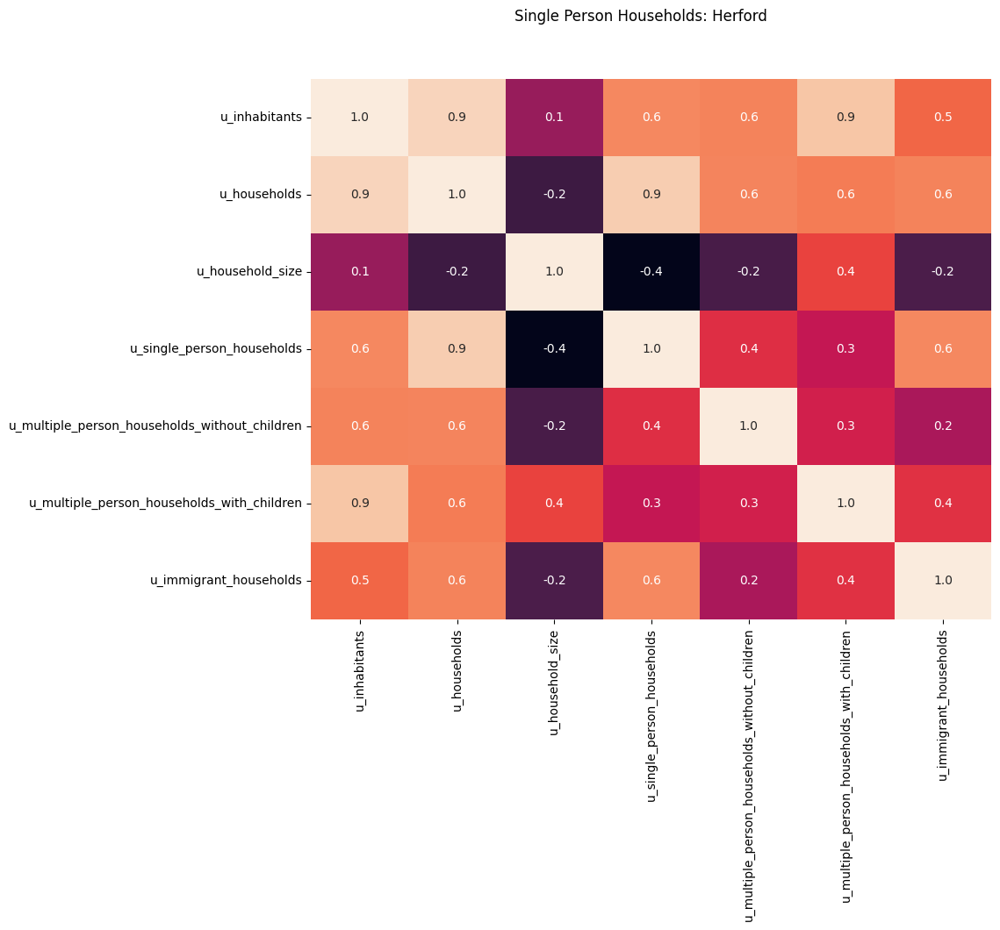

In [103]:
heatmap_plot(data=data, mask=mask_herford, indices=sph_indices_org, title="Single Person Households: Herford")

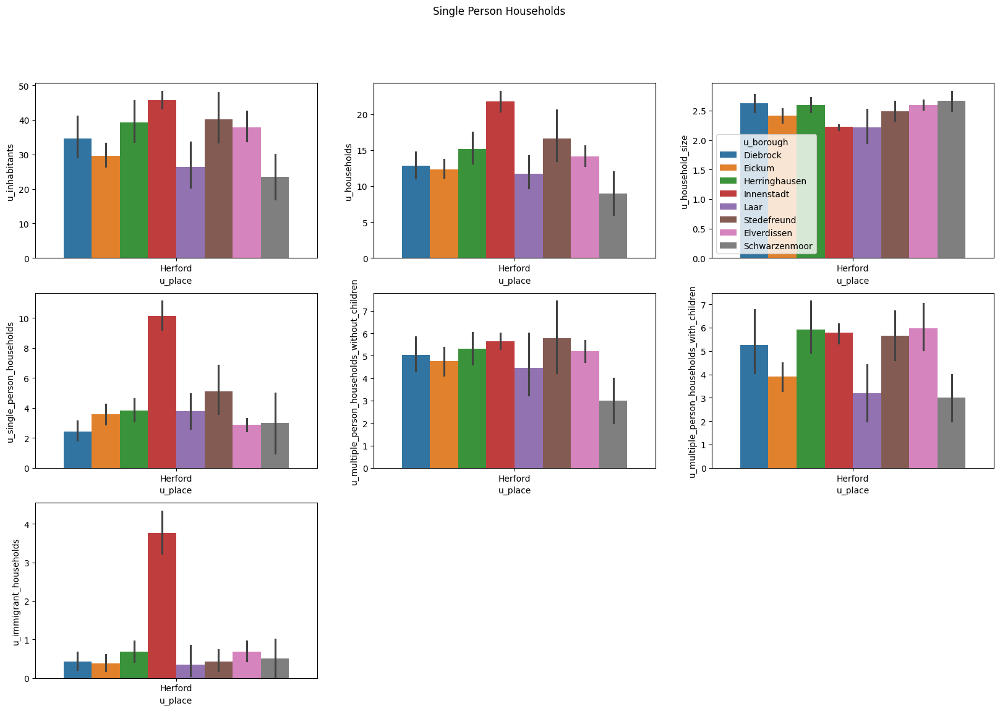

In [104]:
bar_plot(data=data.iloc[mask_herford, :], 
         x="u_place", 
         y=sph_indices_org, 
         hue="u_borough", 
         fig_title="Single Person Households", 
         nrows=nrows, 
         ncols=ncols)

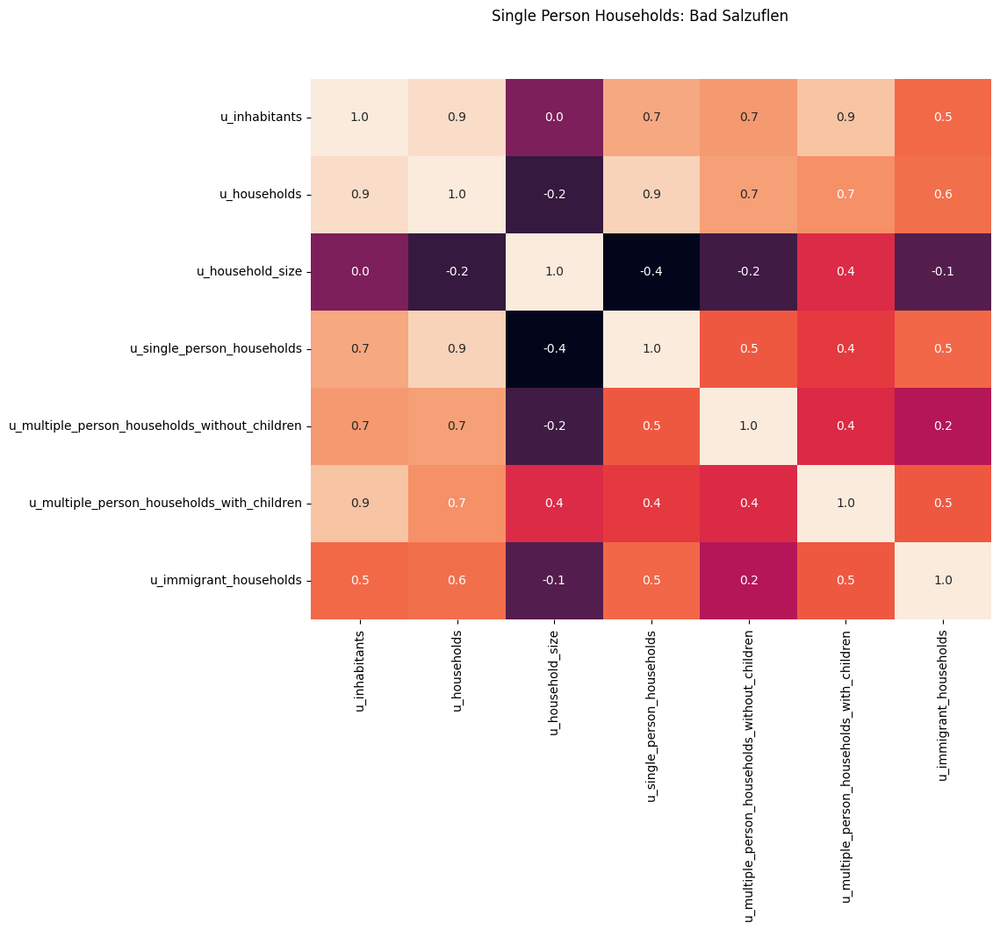

In [105]:
heatmap_plot(data=data, mask=mask_bad_salzuflen, indices=sph_indices_org, title="Single Person Households: Bad Salzuflen")

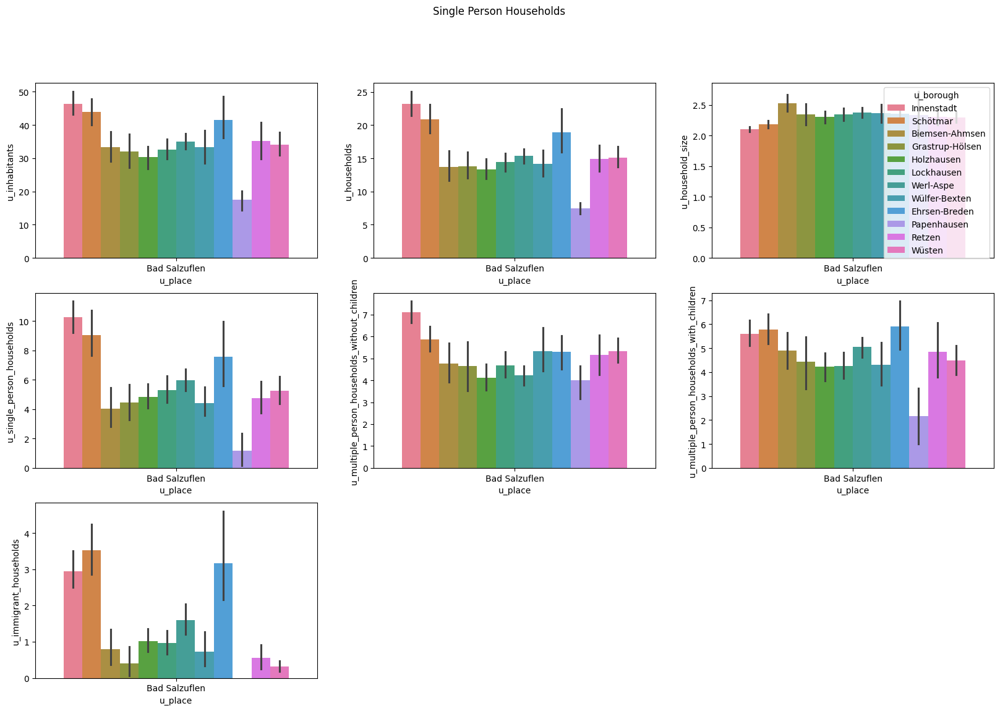

In [106]:
bar_plot(data=data.iloc[mask_bad_salzuflen, :], 
         x="u_place", 
         y=sph_indices_org, 
         hue="u_borough",
         fig_title="Single Person Households", 
         nrows=nrows, 
         ncols=ncols)

#### Single Person Households Percentage

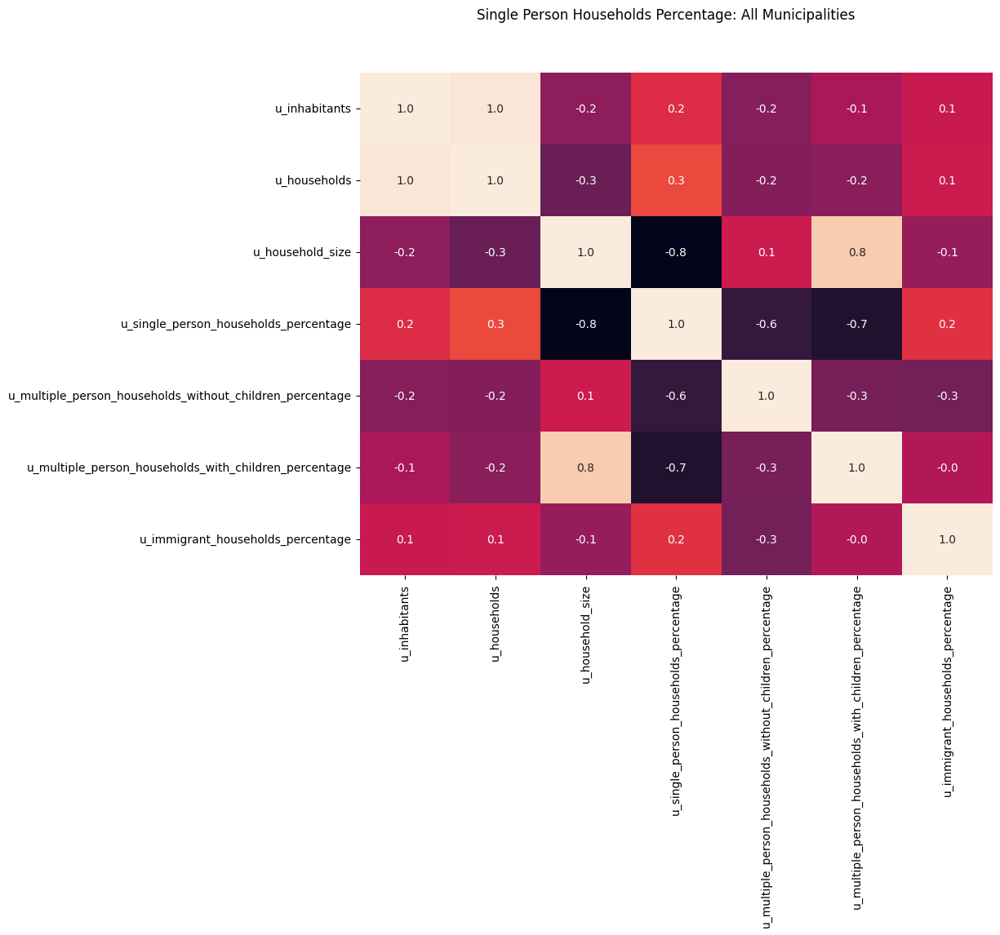

In [107]:
heatmap_plot(data=data, mask=None, indices=sph_percentage_indices_org, title="Single Person Households Percentage: All Municipalities")

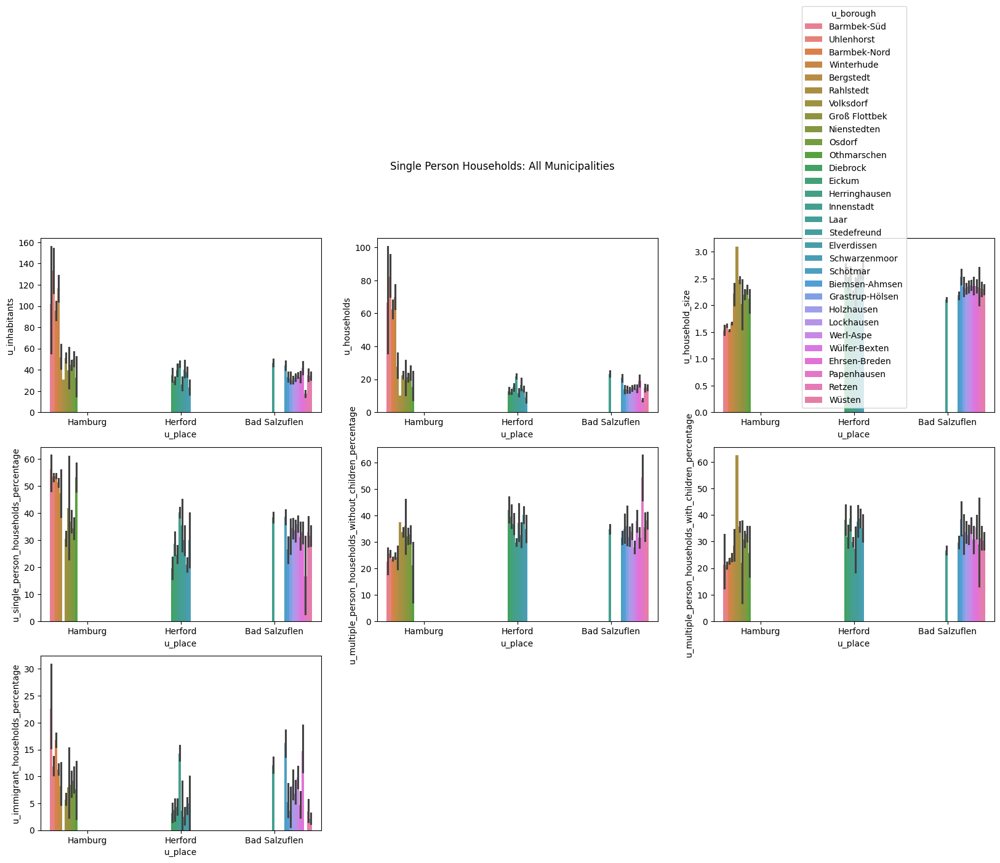

In [108]:
bar_plot(data=data, 
         x="u_place", 
         y=sph_percentage_indices_org, 
         hue="u_borough", 
         fig_title="Single Person Households: All Municipalities", 
         nrows=nrows, 
         ncols=ncols)

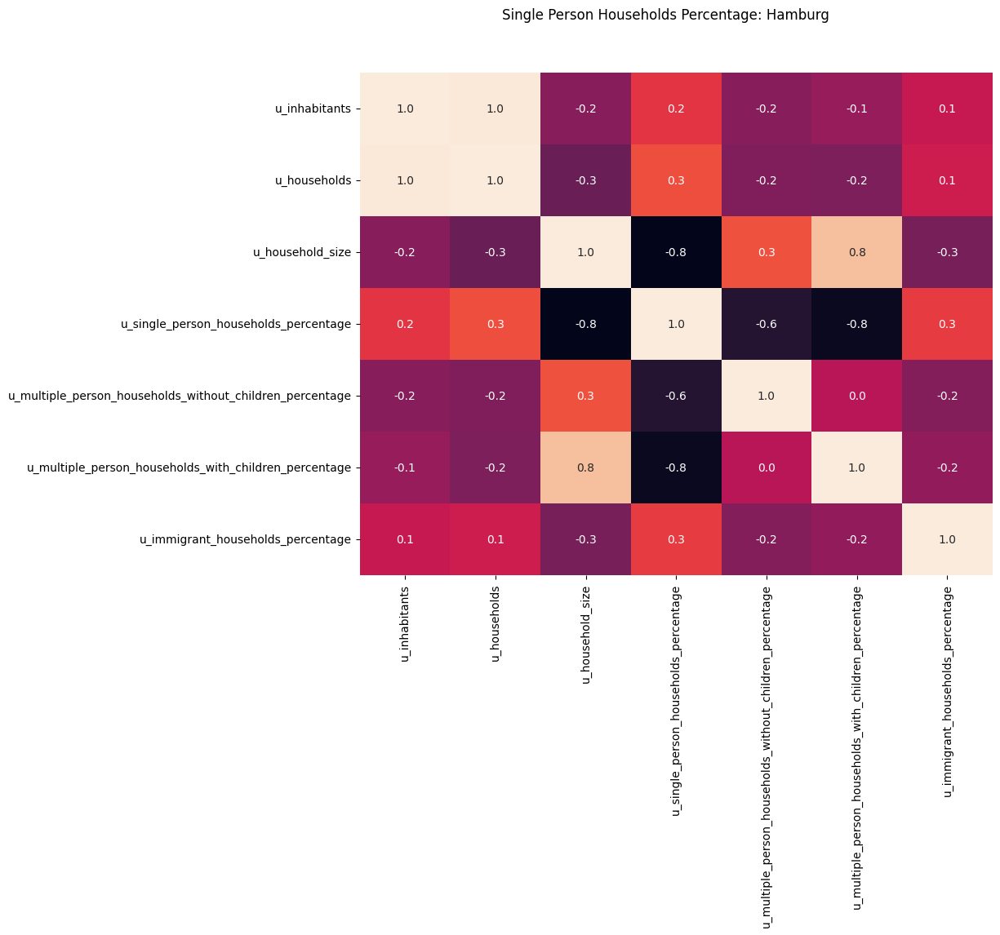

In [109]:
heatmap_plot(data=data, mask=mask_hamburg, indices=sph_percentage_indices_org, title="Single Person Households Percentage: Hamburg")

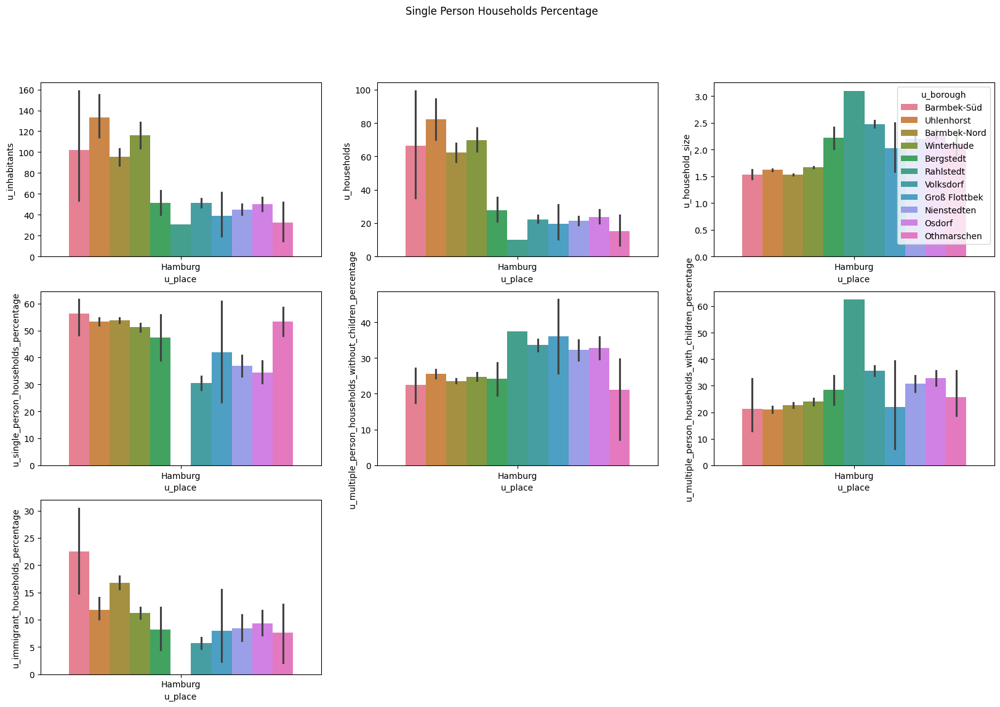

In [110]:
bar_plot(data=data.iloc[mask_hamburg, :], 
         x="u_place", 
         y=sph_percentage_indices_org, 
         hue="u_borough",
         fig_title="Single Person Households Percentage", 
         nrows=nrows, 
         ncols=ncols)

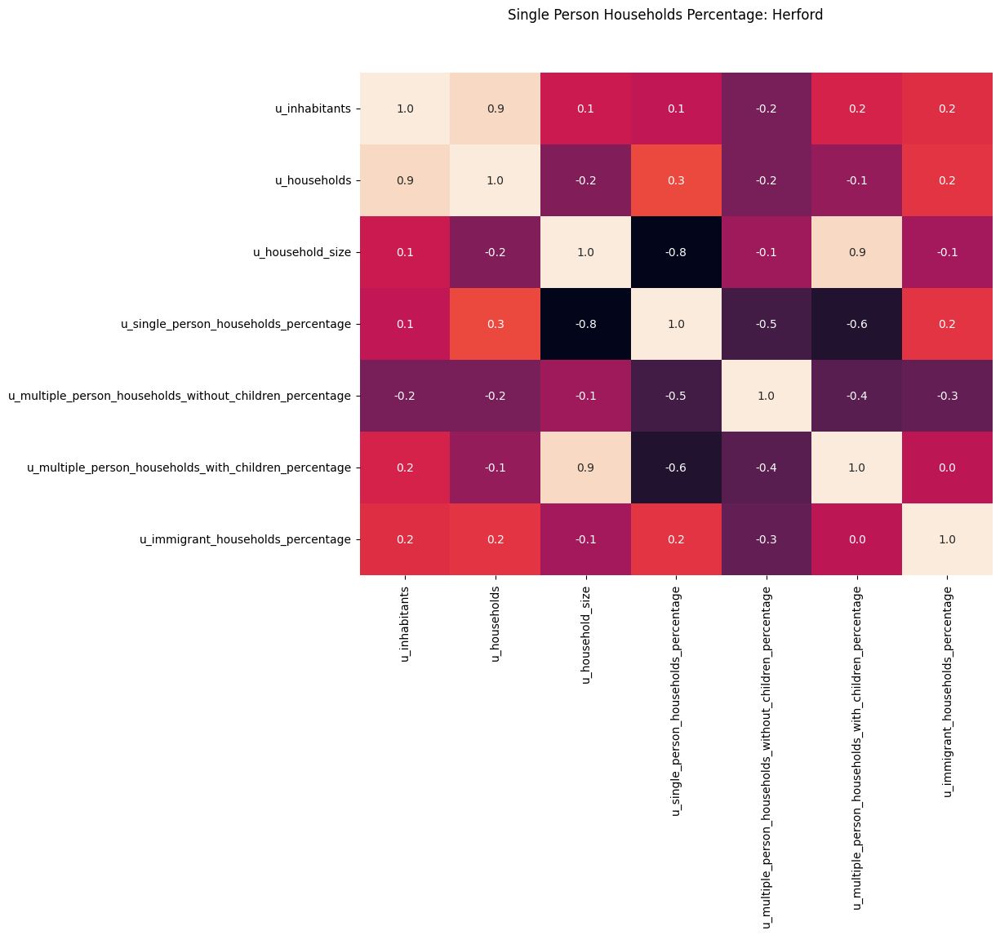

In [111]:
heatmap_plot(data=data, mask=mask_herford, indices=sph_percentage_indices_org, title="Single Person Households Percentage: Herford")

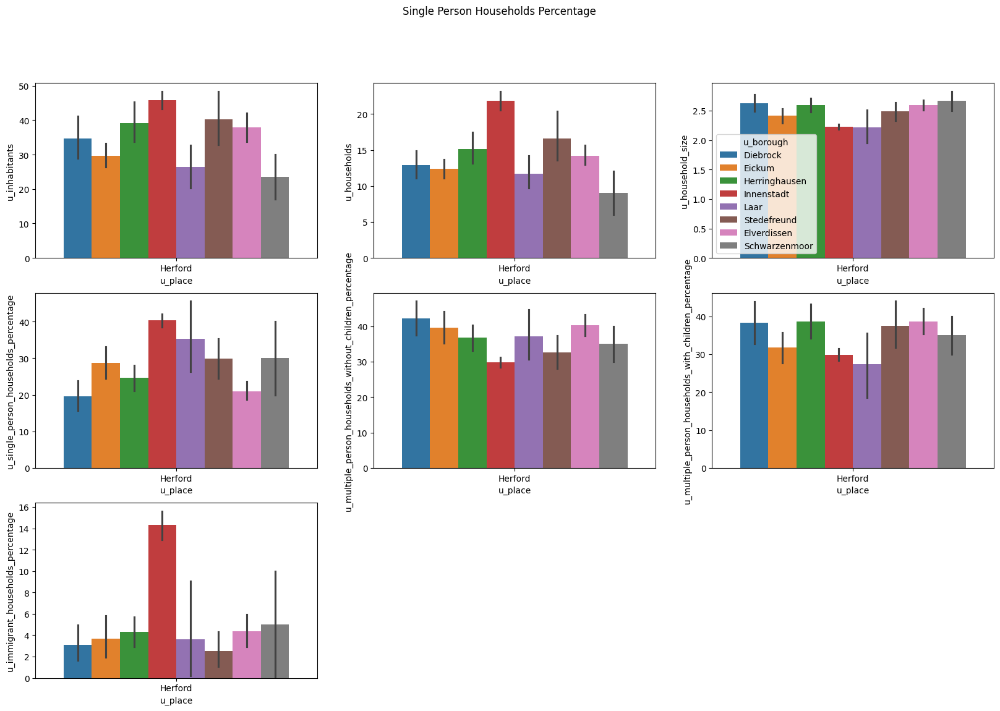

In [112]:
bar_plot(data=data.iloc[mask_herford, :], 
         x="u_place", 
         y=sph_percentage_indices_org, 
         hue="u_borough",
         fig_title="Single Person Households Percentage", 
         nrows=nrows, 
         ncols=ncols)

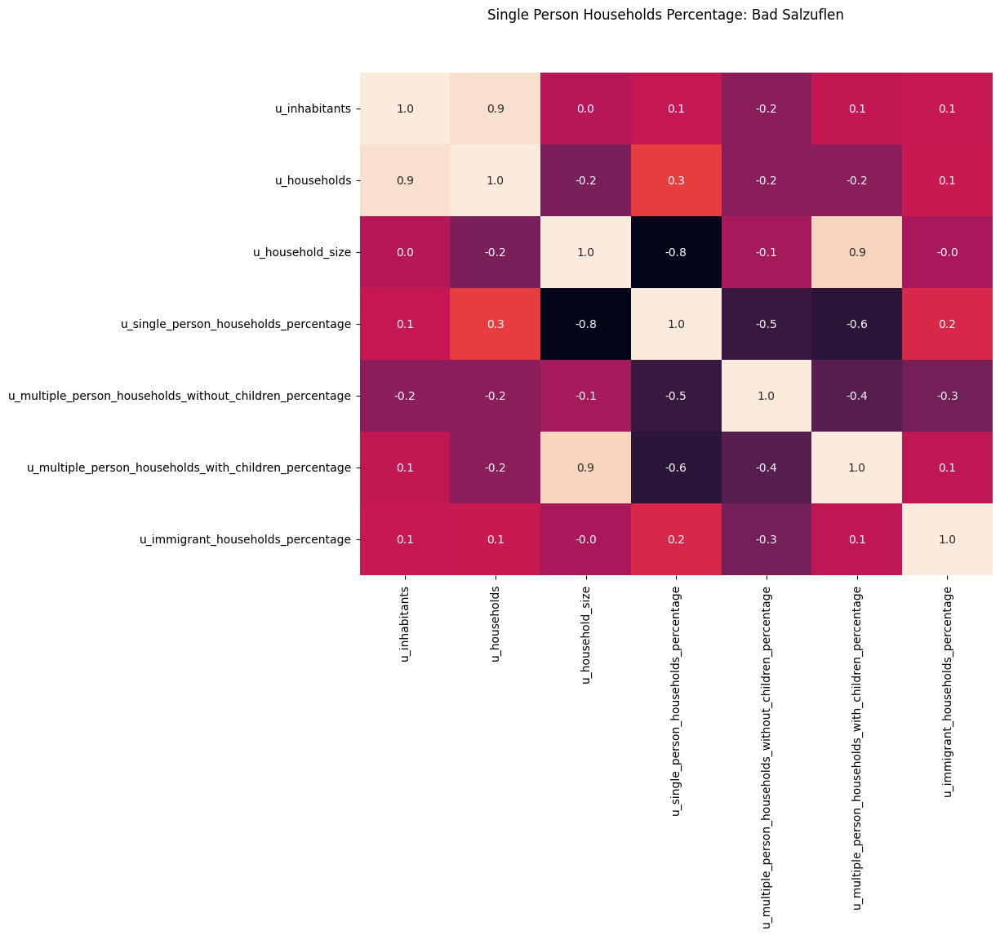

In [113]:
heatmap_plot(data=data, mask=mask_bad_salzuflen, indices=sph_percentage_indices_org, title="Single Person Households Percentage: Bad Salzuflen")

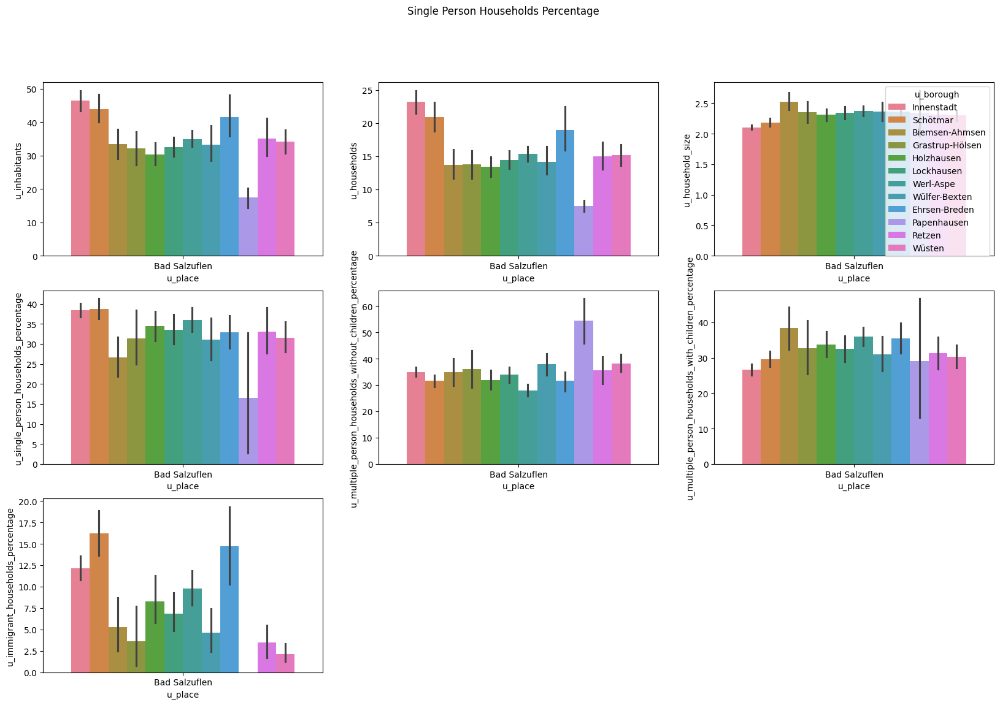

In [114]:
bar_plot(data=data.iloc[mask_bad_salzuflen, :], 
         x="u_place", 
         y=sph_percentage_indices_org, 
         hue="u_borough", 
         fig_title="Single Person Households Percentage", 
         nrows=nrows, 
         ncols=ncols)

#### Single Person Households Index

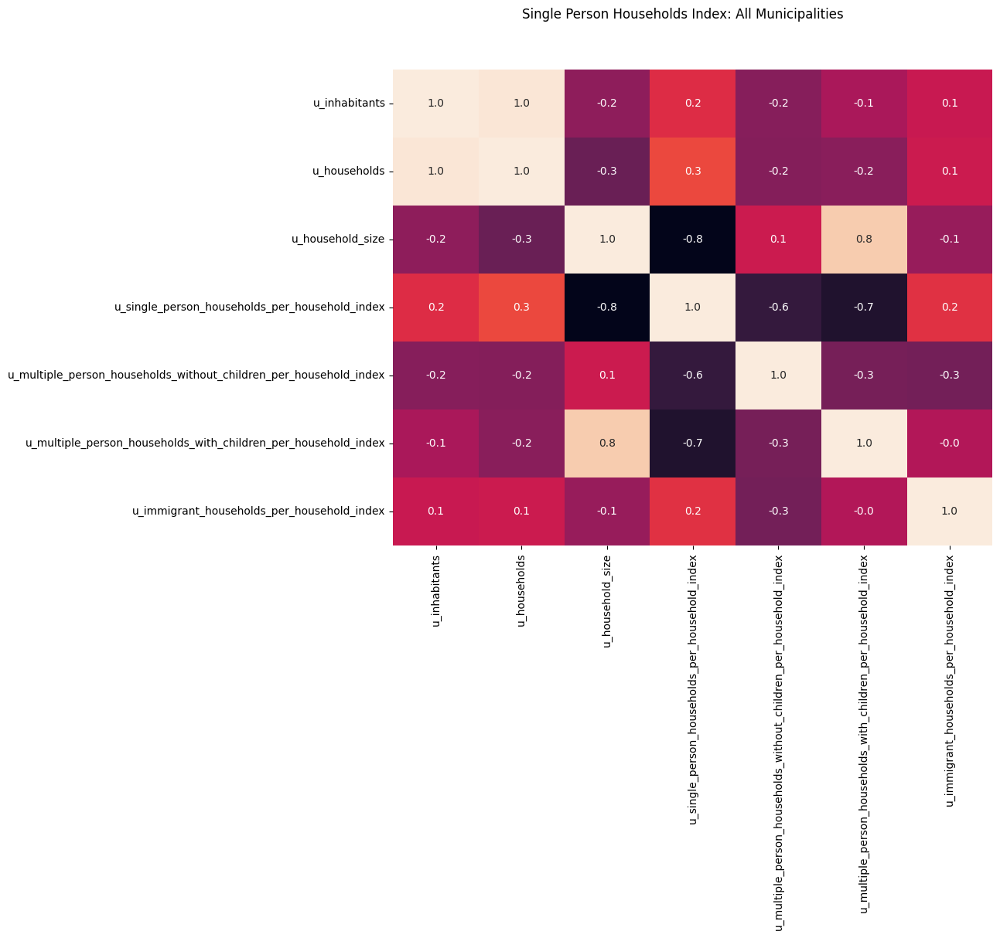

In [115]:
heatmap_plot(data=data, mask=None, indices=sph_index_indices_org, title="Single Person Households Index: All Municipalities")

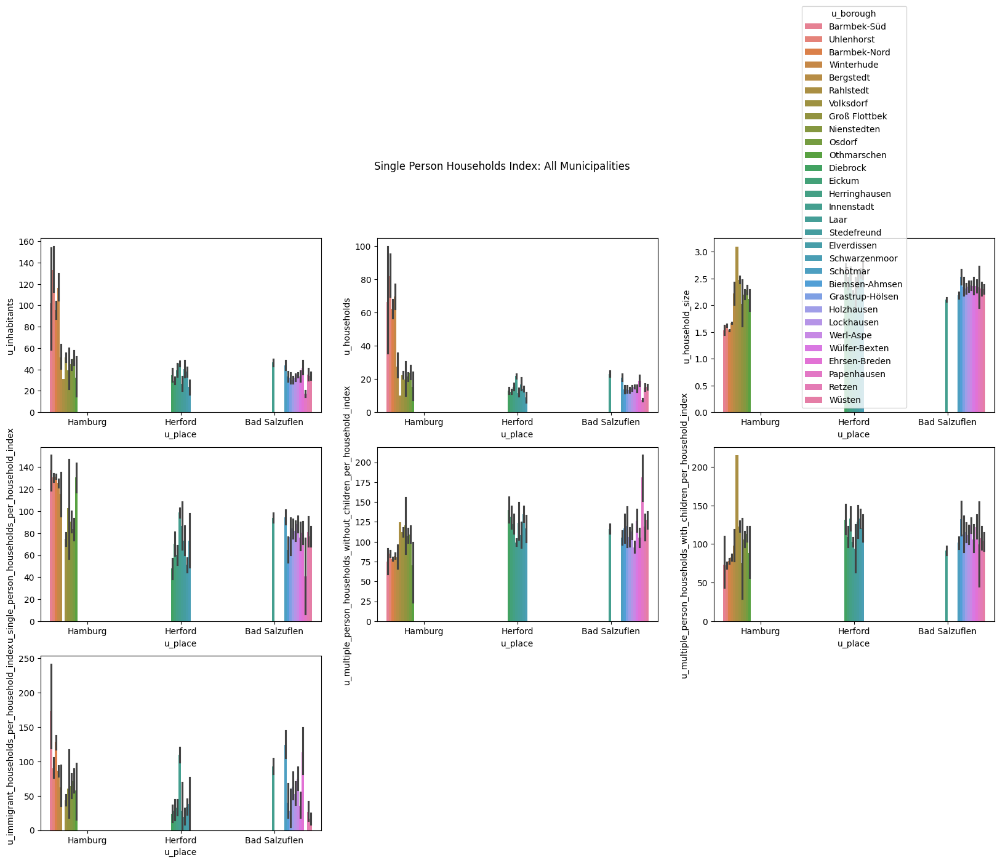

In [116]:
bar_plot(data=data, 
         x="u_place", 
         y=sph_index_indices_org, 
         hue="u_borough", 
         fig_title="Single Person Households Index: All Municipalities", 
         nrows=nrows, 
         ncols=ncols)

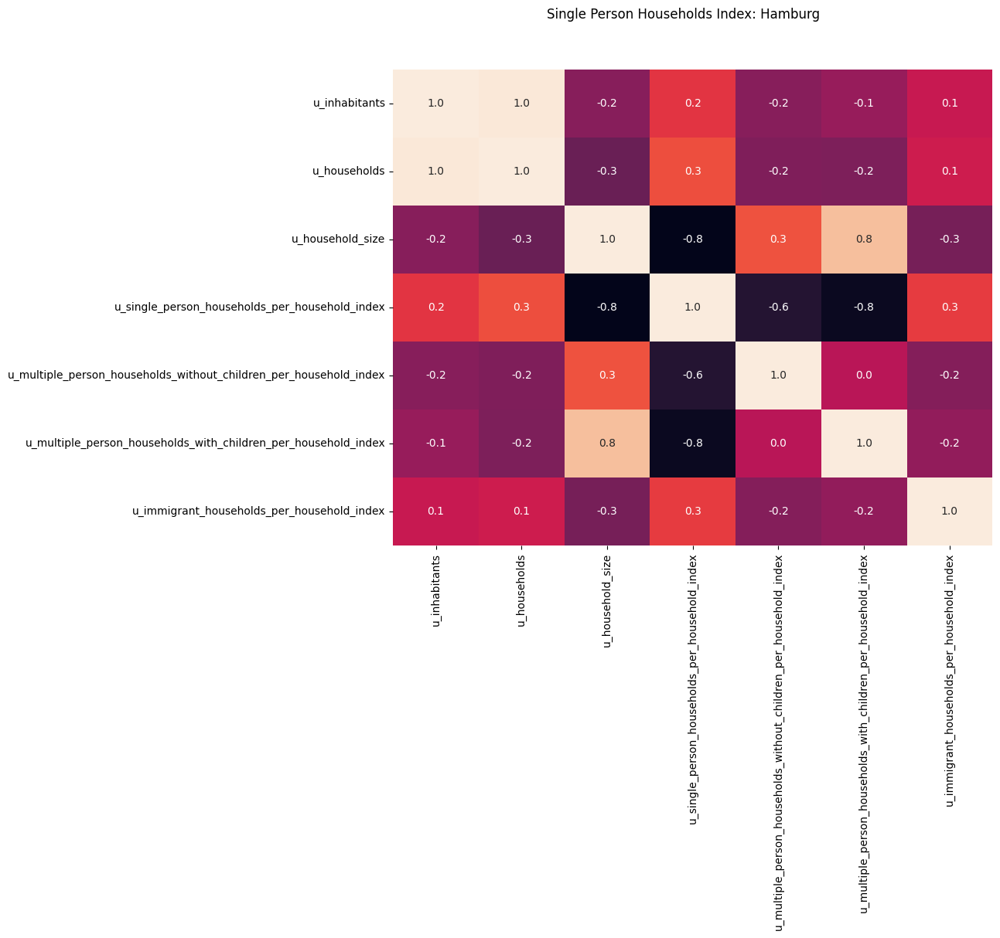

In [117]:
heatmap_plot(data=data, mask=mask_hamburg, indices=sph_index_indices_org, title="Single Person Households Index: Hamburg")

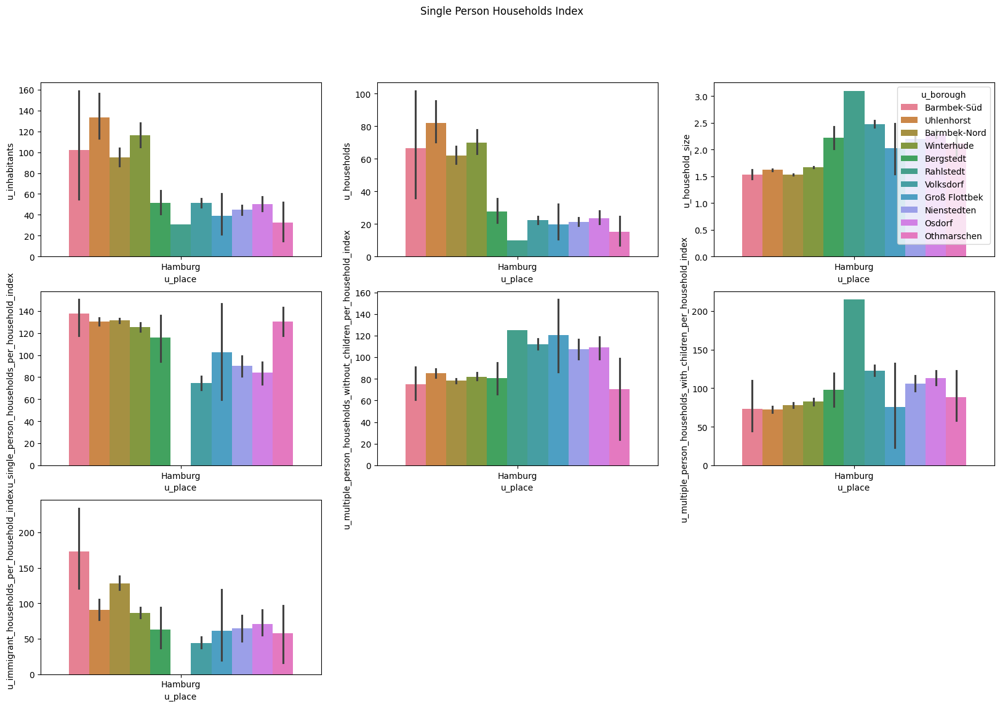

In [118]:
bar_plot(data=data.iloc[mask_hamburg, :], 
         x="u_place", 
         y=sph_index_indices_org, 
         hue="u_borough",
         fig_title="Single Person Households Index", 
         nrows=nrows, 
         ncols=ncols)

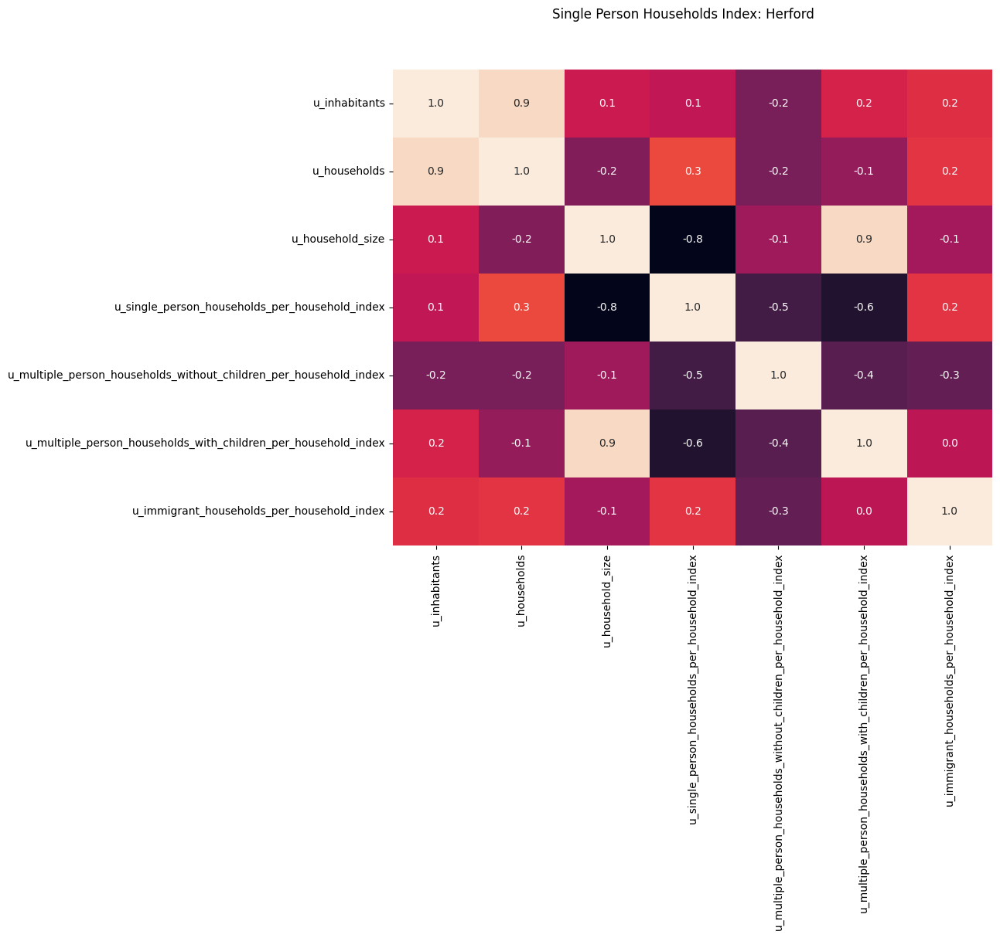

In [119]:
heatmap_plot(data=data, mask=mask_herford, indices=sph_index_indices_org, title="Single Person Households Index: Herford")

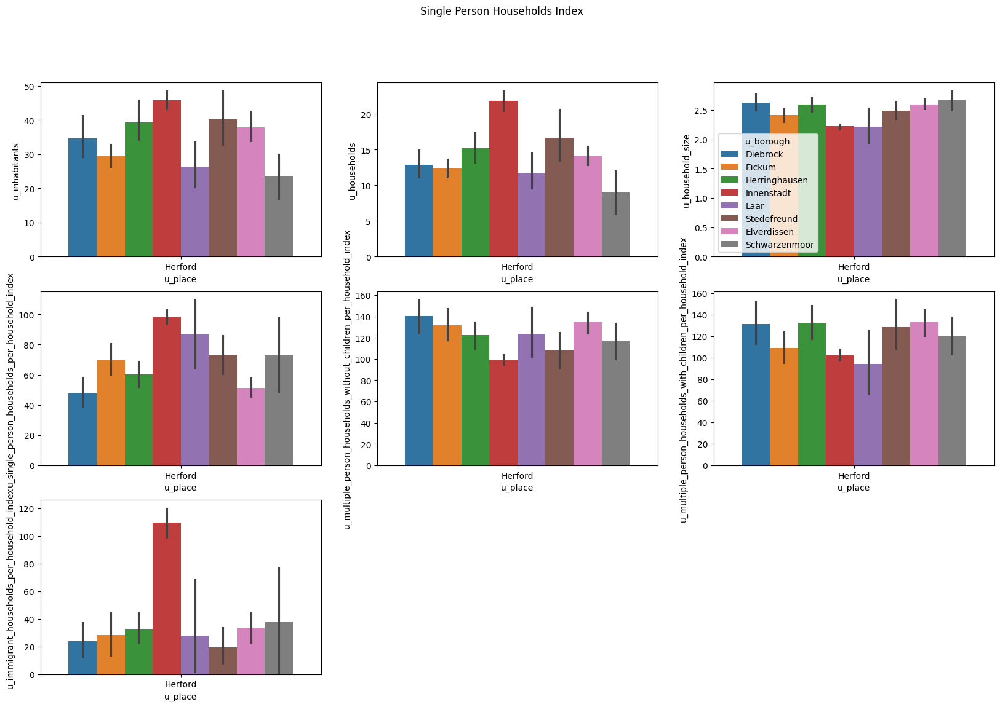

In [120]:
bar_plot(data=data.iloc[mask_herford, :], 
         x="u_place", 
         y=sph_index_indices_org, 
         hue="u_borough",
         fig_title="Single Person Households Index", 
         nrows=nrows, 
         ncols=ncols)

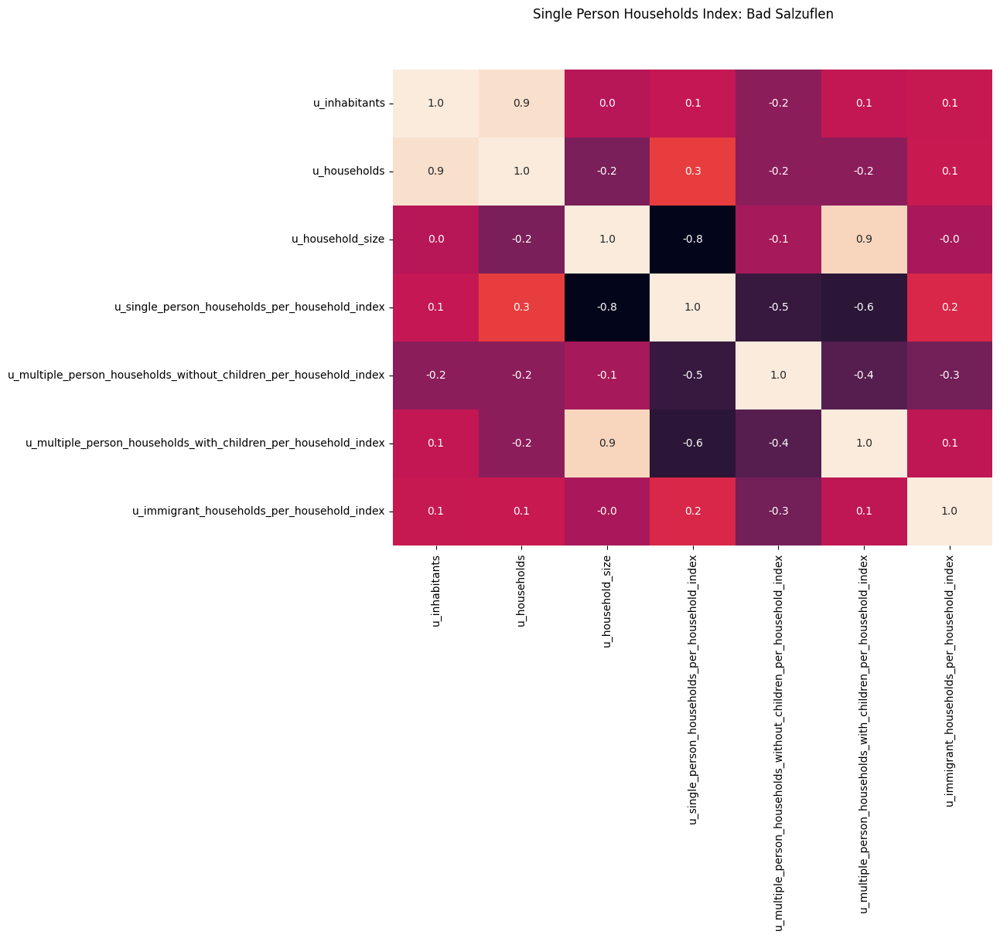

In [121]:
heatmap_plot(data=data, mask=mask_bad_salzuflen, indices=sph_index_indices_org, title="Single Person Households Index: Bad Salzuflen")

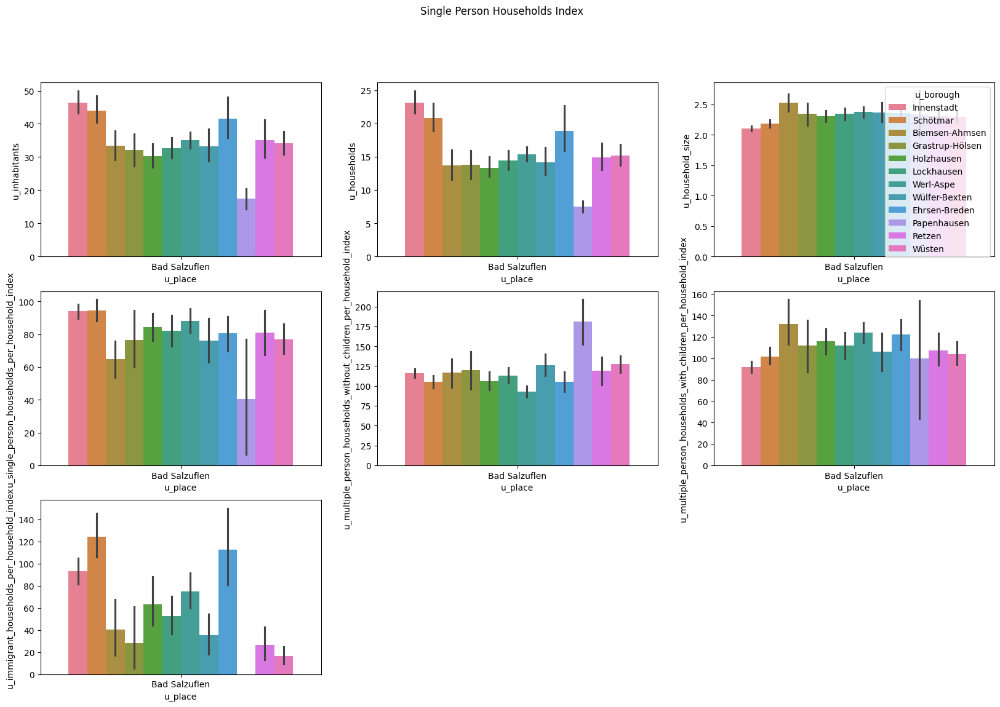

In [122]:
bar_plot(data=data.iloc[mask_bad_salzuflen, :], 
         x="u_place", 
         y=sph_index_indices_org, 
         hue="u_borough", 
         fig_title="Single Person Households Index", 
         nrows=nrows, 
         ncols=ncols)

#### Accomodation Type

In [123]:
acc_types_indices = data.iloc[:, [8, 9, 10, 66, 67, 68]].columns

acc_types_indices_org = sph_indices.tolist()

In [124]:
nrows=2
ncols=3

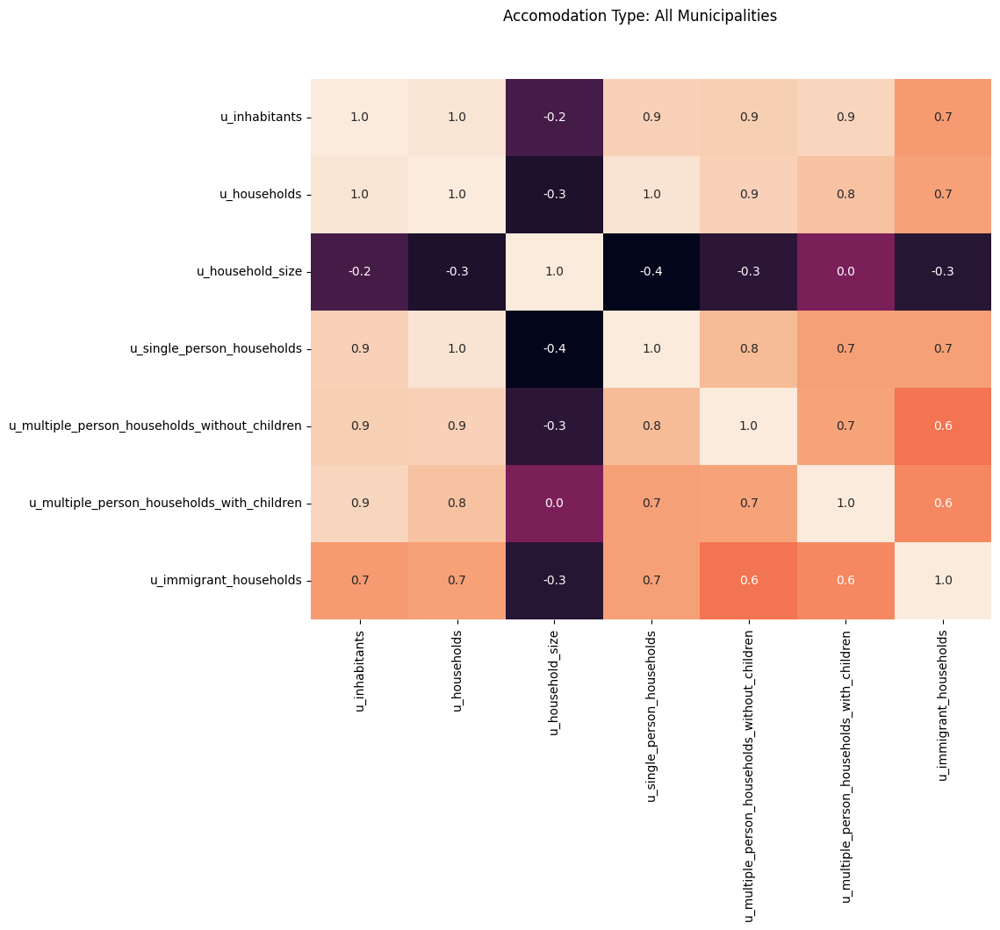

In [125]:
heatmap_plot(data=data, mask=None, indices=acc_types_indices_org, title="Accomodation Type: All Municipalities")

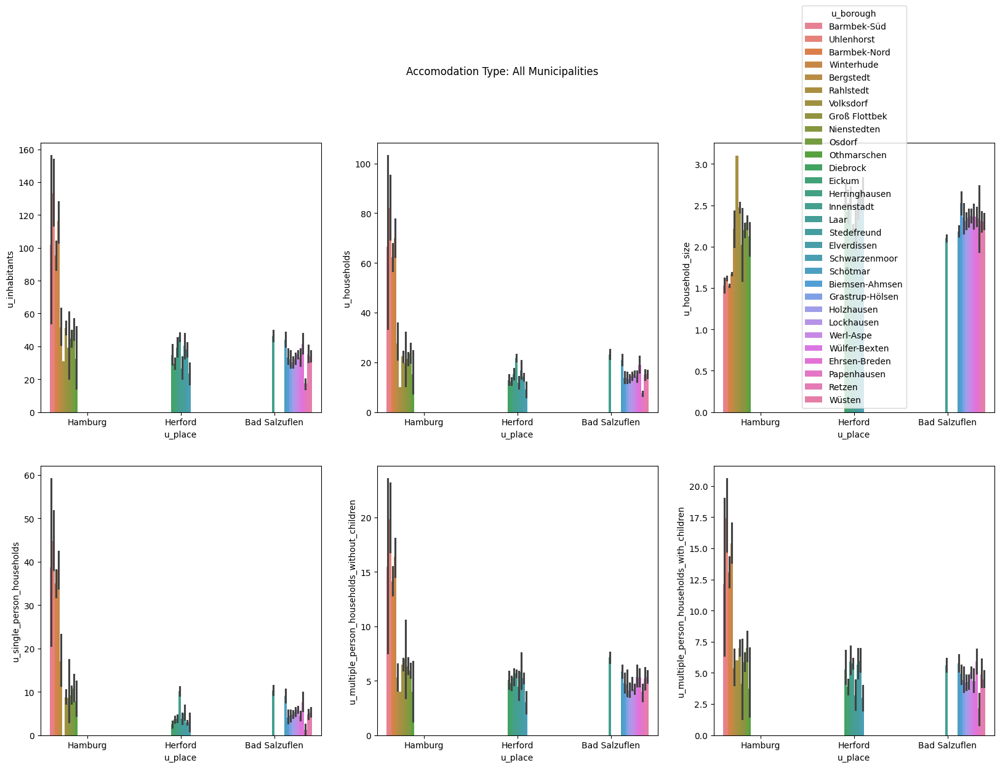

In [126]:
bar_plot(data=data, 
         x="u_place", 
         y=acc_types_indices_org, 
         hue="u_borough", 
         fig_title="Accomodation Type: All Municipalities", 
         nrows=nrows, 
         ncols=ncols)

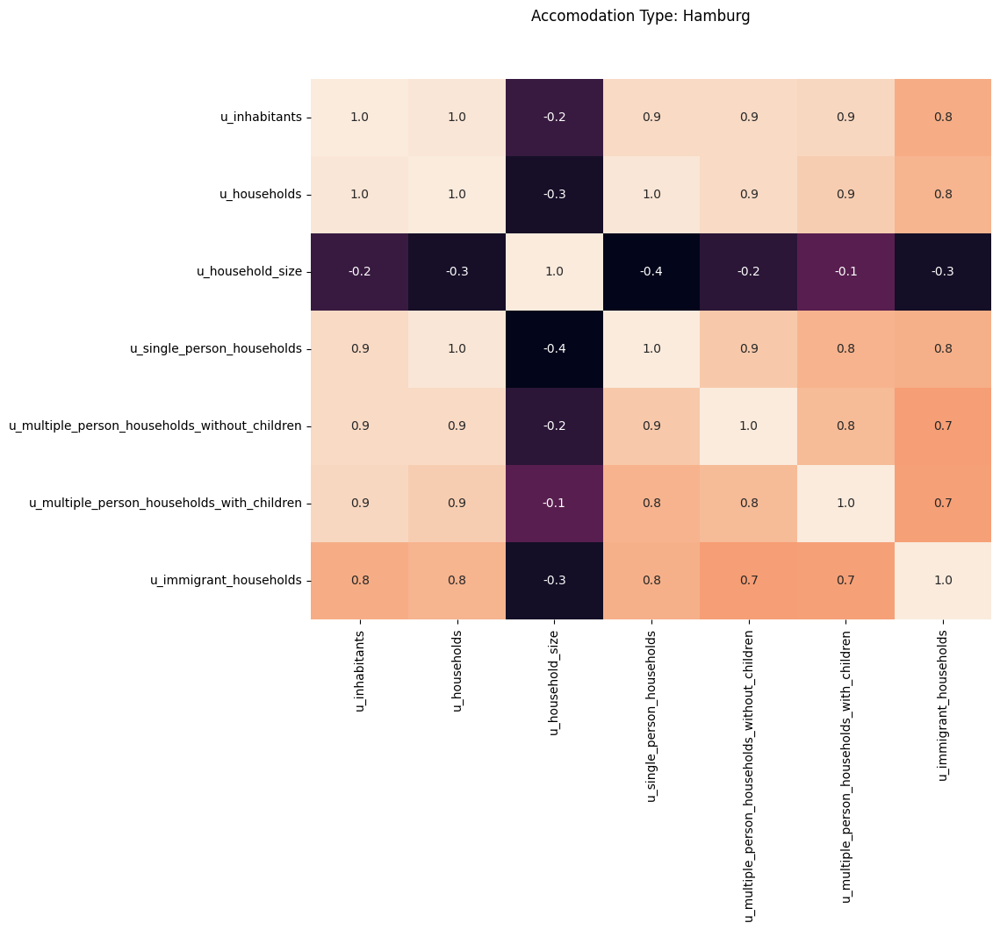

In [127]:
heatmap_plot(data=data, mask=mask_hamburg, indices=acc_types_indices_org, title="Accomodation Type: Hamburg")

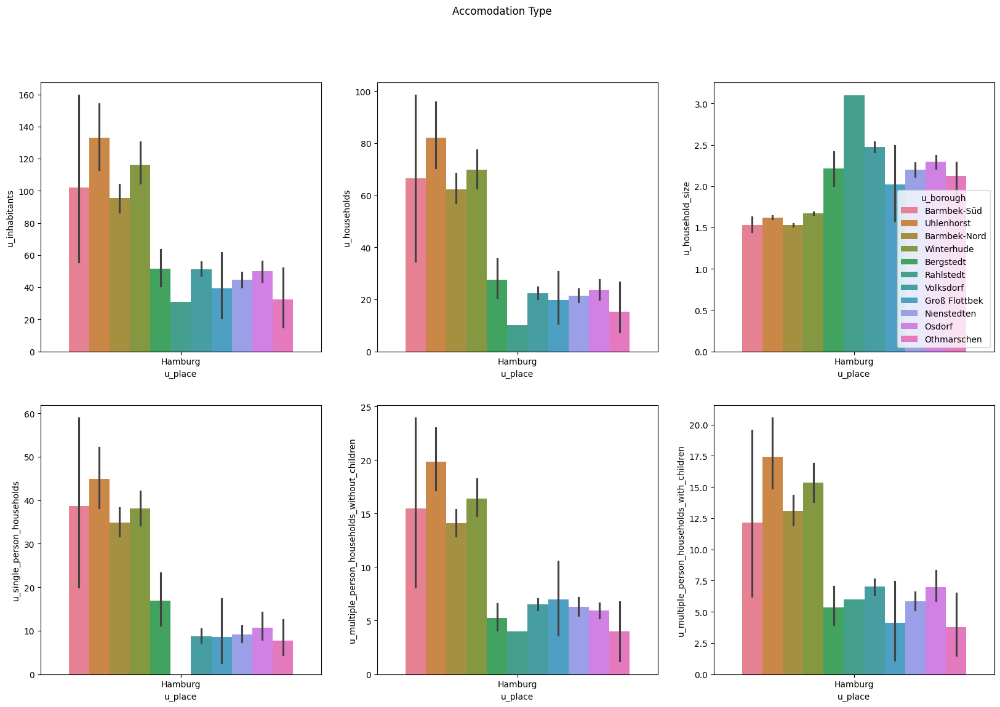

In [128]:
bar_plot(data=data.iloc[mask_hamburg, :], 
         x="u_place", 
         y=acc_types_indices_org, 
         hue="u_borough",
         fig_title="Accomodation Type", 
         nrows=nrows, 
         ncols=ncols)

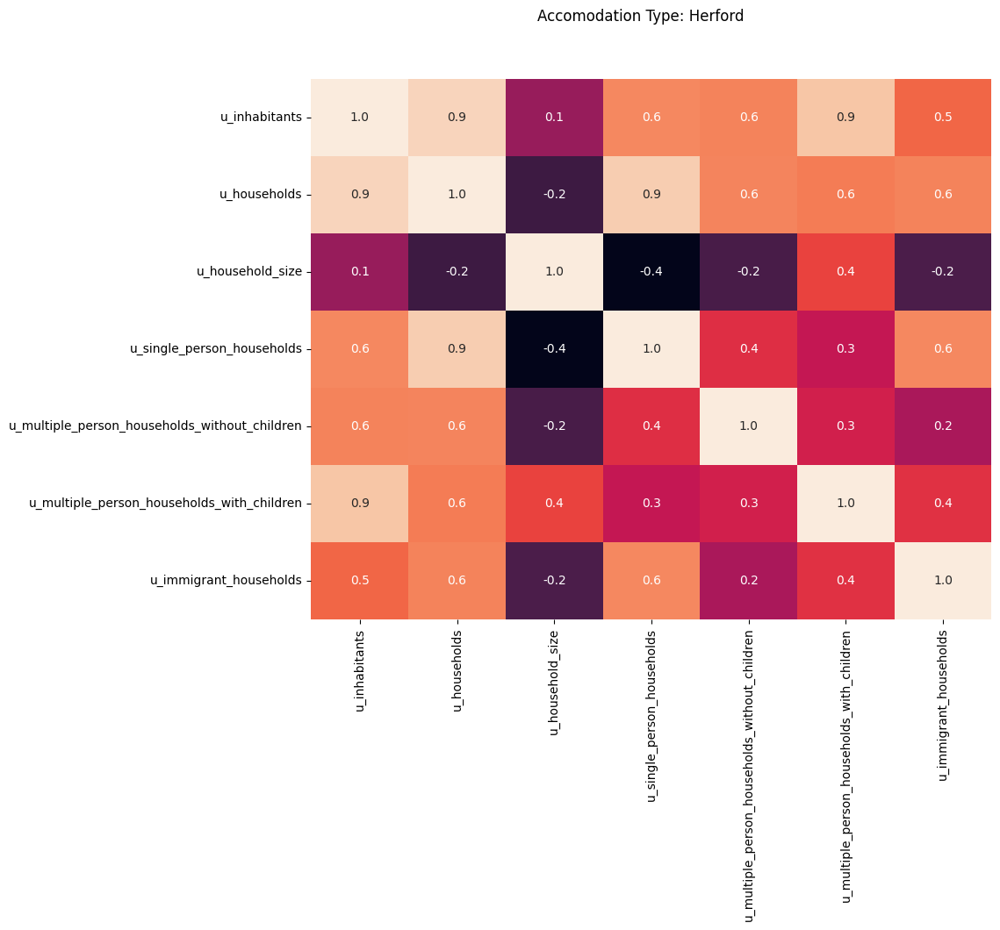

In [129]:
heatmap_plot(data=data, mask=mask_herford, indices=acc_types_indices_org, title="Accomodation Type: Herford")

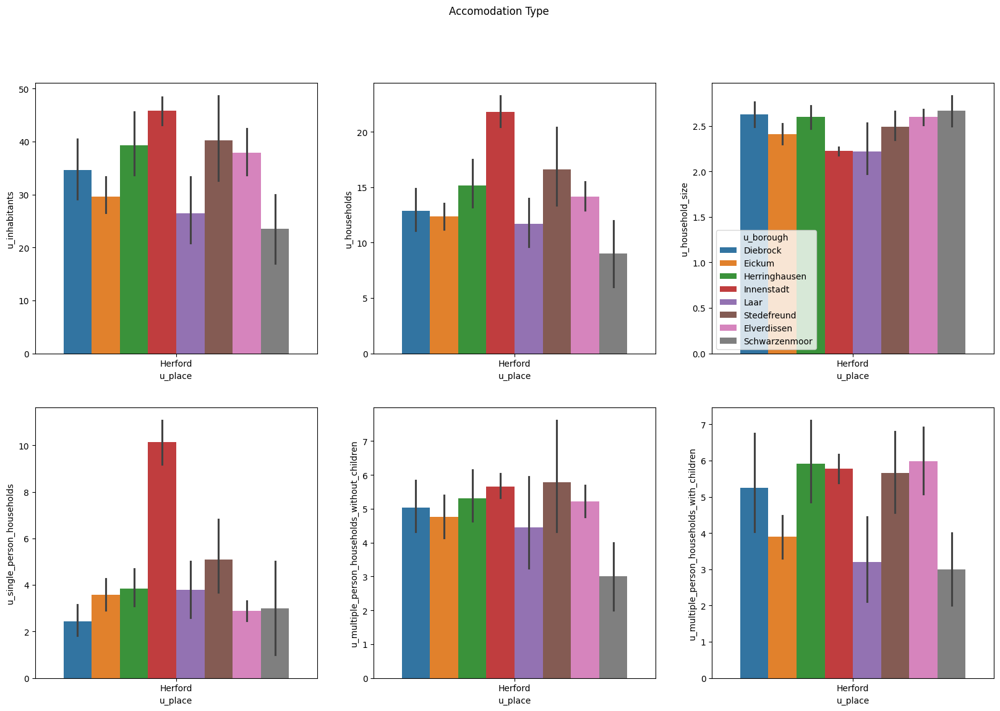

In [130]:
bar_plot(data=data.iloc[mask_herford, :], 
         x="u_place", 
         y=acc_types_indices_org, 
         hue="u_borough", 
         fig_title="Accomodation Type", 
         nrows=nrows, 
         ncols=ncols)

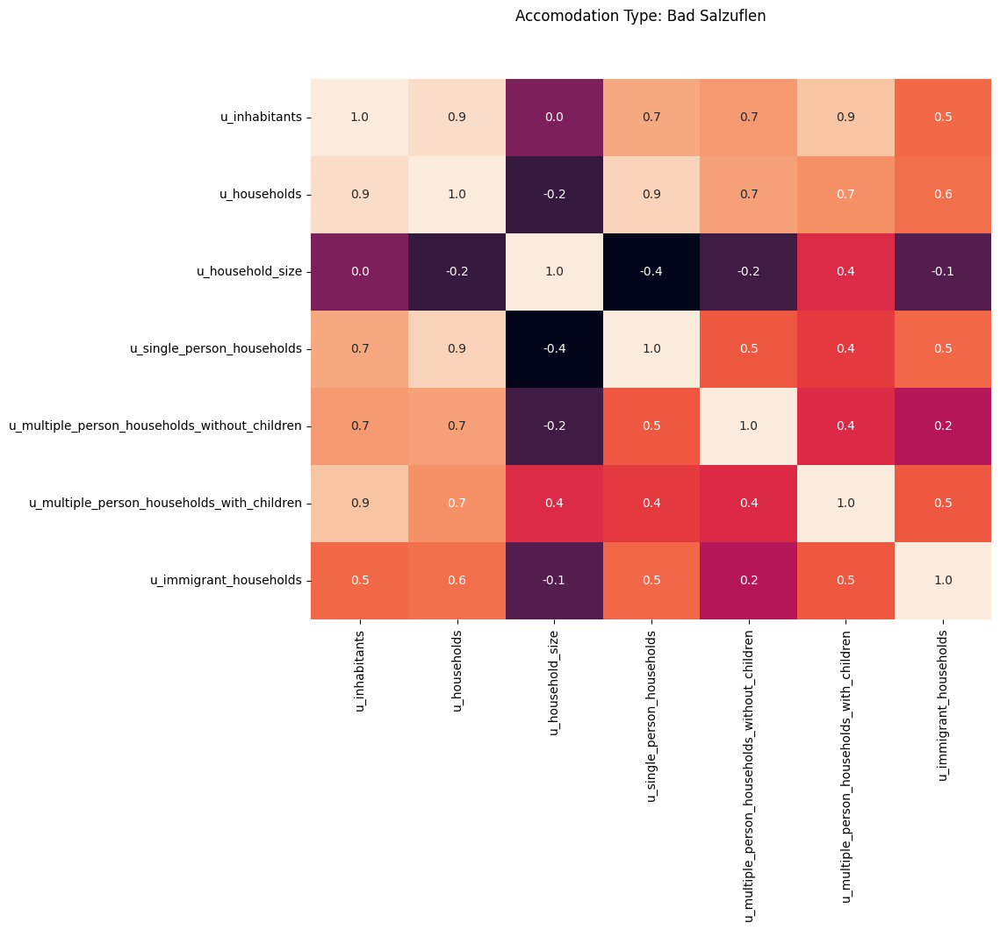

In [131]:
heatmap_plot(data=data, mask=mask_bad_salzuflen, indices=acc_types_indices_org, title="Accomodation Type: Bad Salzuflen")

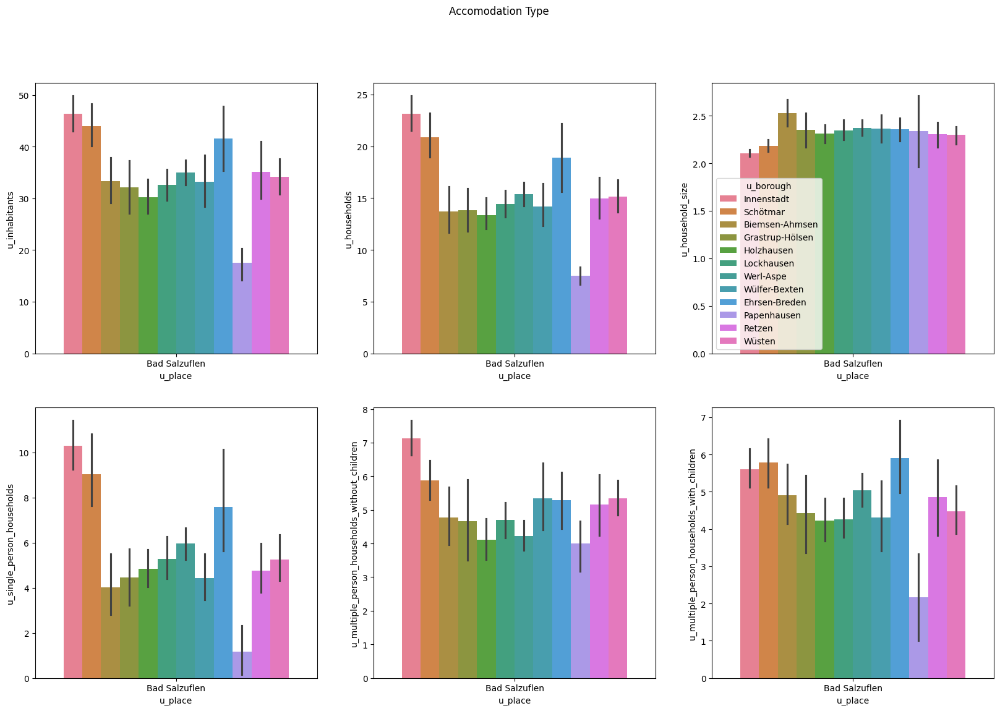

In [132]:
bar_plot(data=data.iloc[mask_bad_salzuflen, :], 
         x="u_place", 
         y=acc_types_indices_org, 
         hue="u_borough", 
         fig_title="Accomodation Type", 
         nrows=nrows, 
         ncols=ncols)

#### Family Type

In [133]:
family_type_indices = data.iloc[:, [8, 9, 10, 69, 72, 75, 78]].columns
family_type_percentage_indices = data.iloc[:, [8, 9, 10, 70, 73, 76,  79]].columns
family_type_index_indices = data.iloc[:, [8, 9, 10, 71, 74, 77, 80]].columns

family_type_indices_org = family_type_indices.tolist()
family_type_percentage_indices_org = family_type_percentage_indices.tolist()
family_type_index_indices_org = family_type_index_indices.tolist()

In [134]:
nrows = ncols = 3

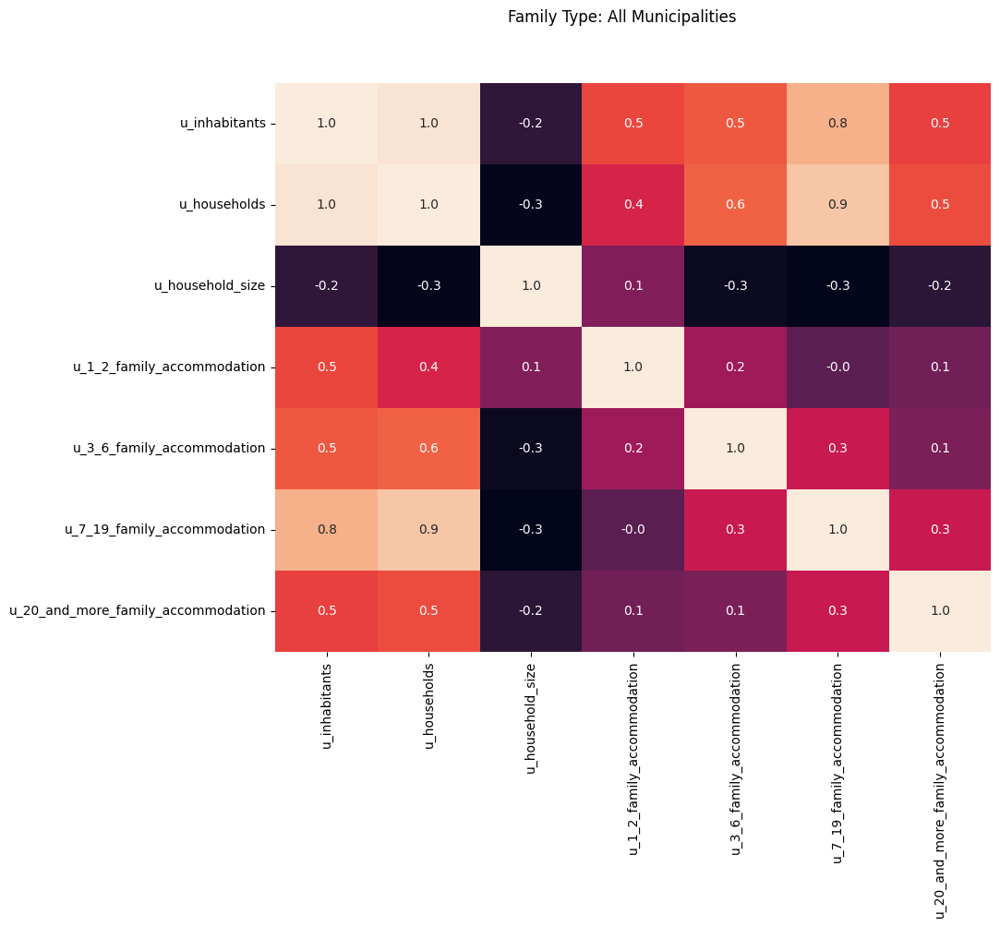

In [135]:
heatmap_plot(data=data, mask=None, indices=family_type_indices_org, title="Family Type: All Municipalities")

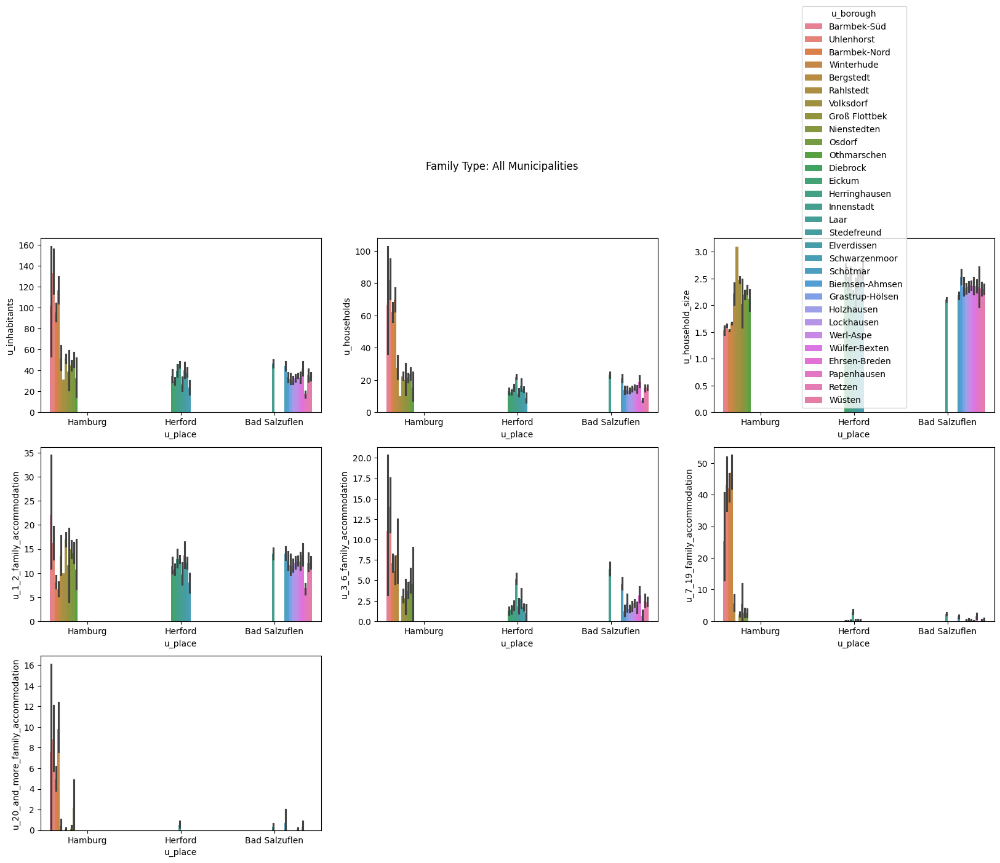

In [136]:
bar_plot(data=data, 
         x="u_place", 
         y=family_type_indices_org, 
         hue="u_borough", 
         fig_title="Family Type: All Municipalities", 
         nrows=nrows, 
         ncols=ncols)

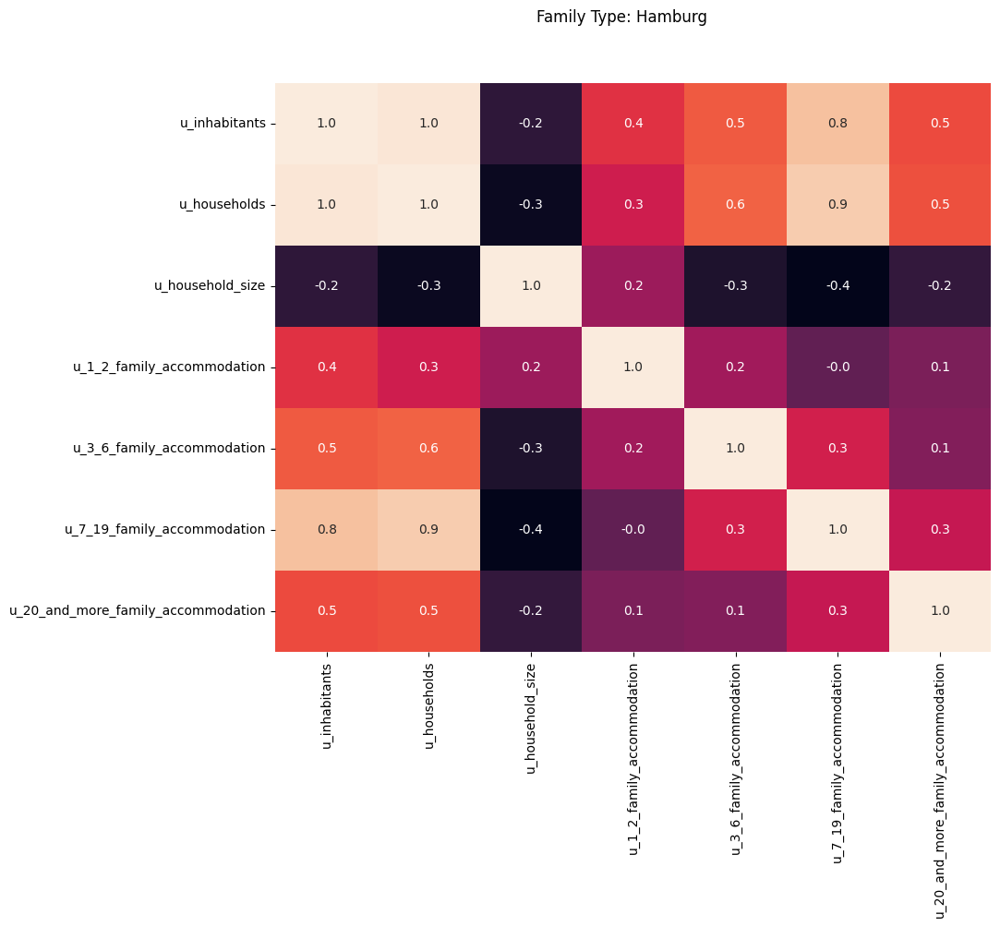

In [137]:
heatmap_plot(data=data, mask=mask_hamburg, indices=family_type_indices_org, title="Family Type: Hamburg")

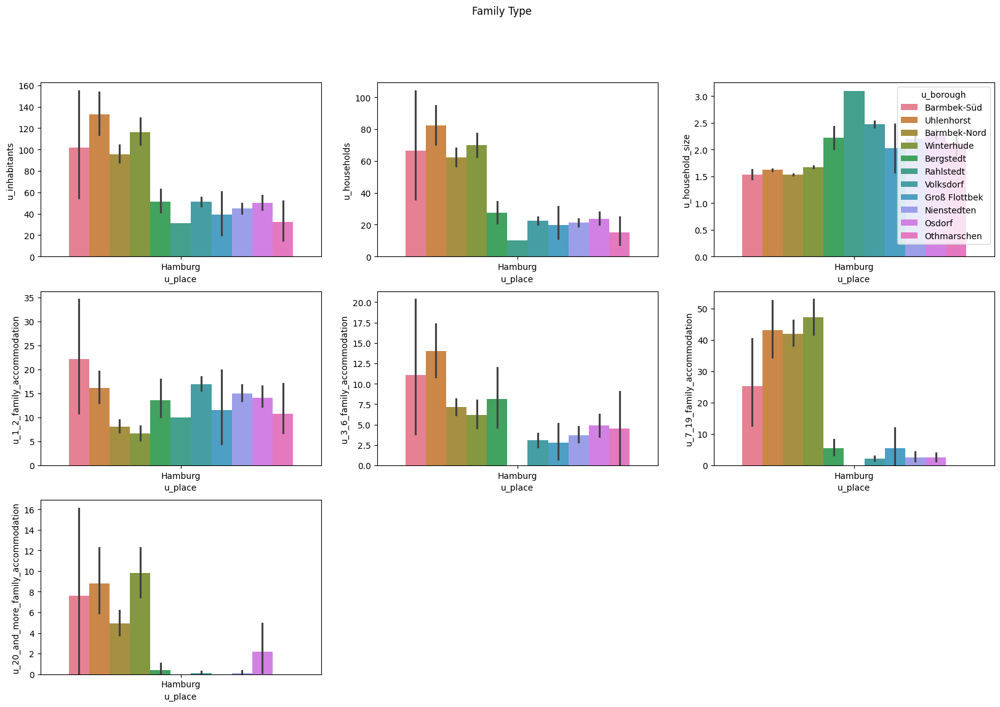

In [138]:
bar_plot(data=data.iloc[mask_hamburg, :], 
         x="u_place", 
         y=family_type_indices_org, 
         hue="u_borough", 
         fig_title="Family Type", 
         nrows=nrows, 
         ncols=ncols)

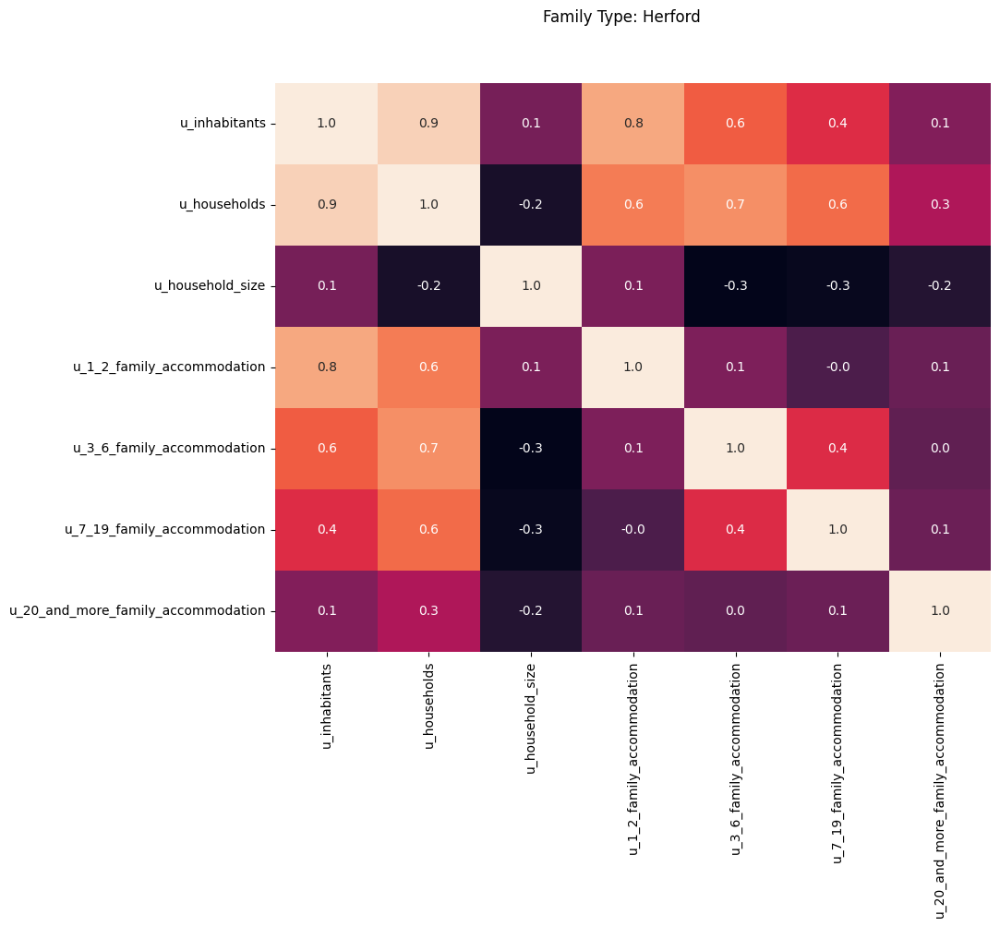

In [139]:
heatmap_plot(data=data, mask=mask_herford, indices=family_type_indices_org, title="Family Type: Herford")

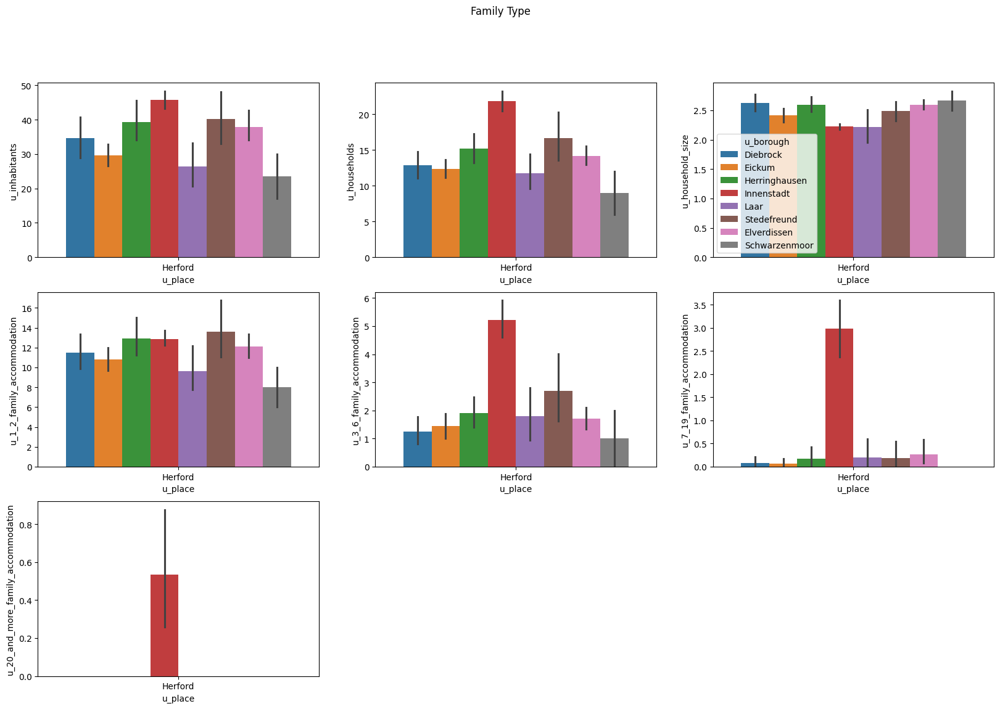

In [140]:
bar_plot(data=data.iloc[mask_herford, :], 
         x="u_place", 
         y=family_type_indices_org, 
         hue="u_borough", 
         fig_title="Family Type", 
         nrows=nrows, 
         ncols=ncols)

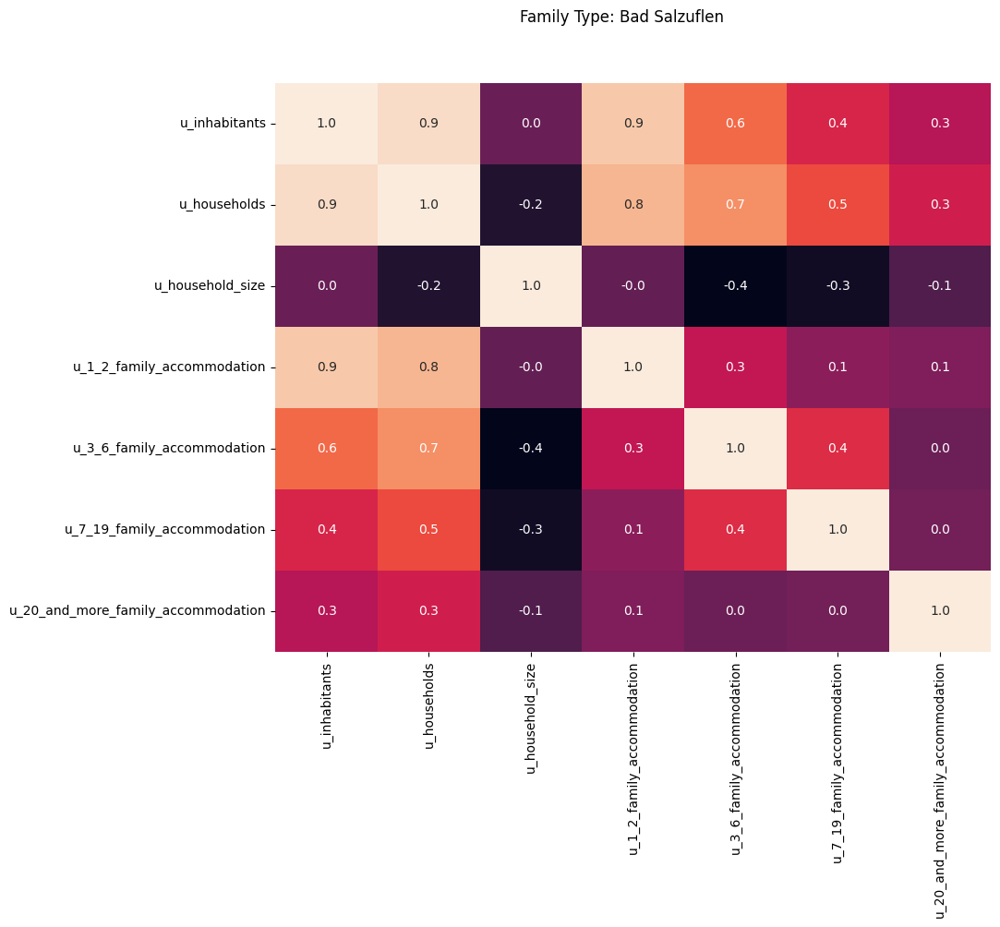

In [141]:
heatmap_plot(data=data, mask=mask_bad_salzuflen, indices=family_type_indices_org, title="Family Type: Bad Salzuflen")

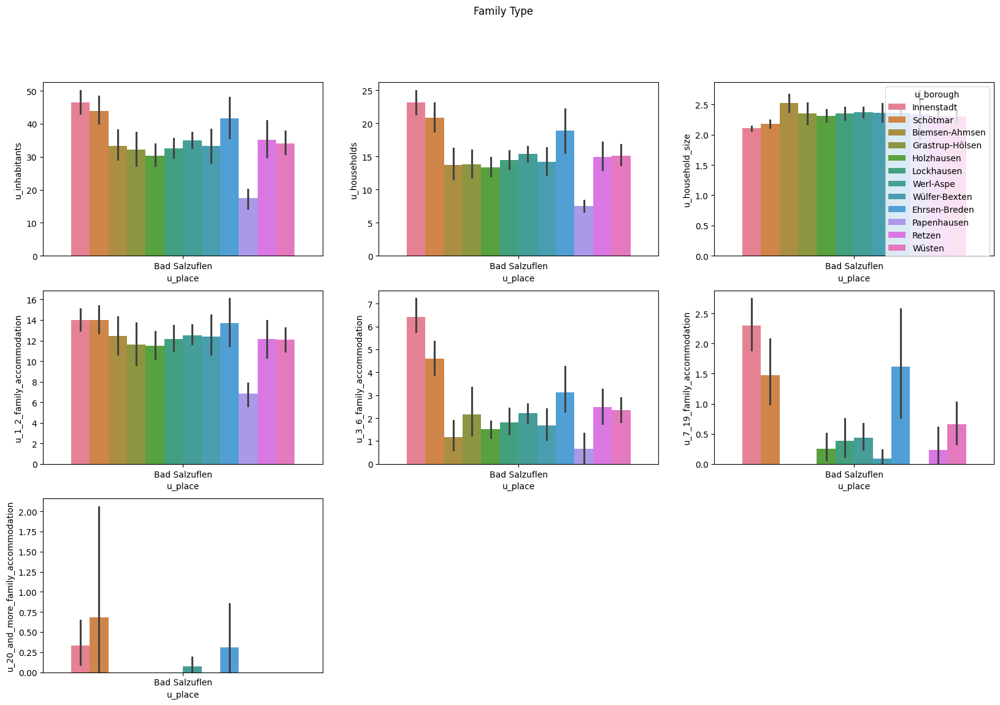

In [142]:
bar_plot(data=data.iloc[mask_bad_salzuflen, :], 
         x="u_place", 
         y=family_type_indices_org, 
         hue="u_borough",
         fig_title="Family Type", 
         nrows=nrows, 
         ncols=ncols)

#### Family Type Percentage

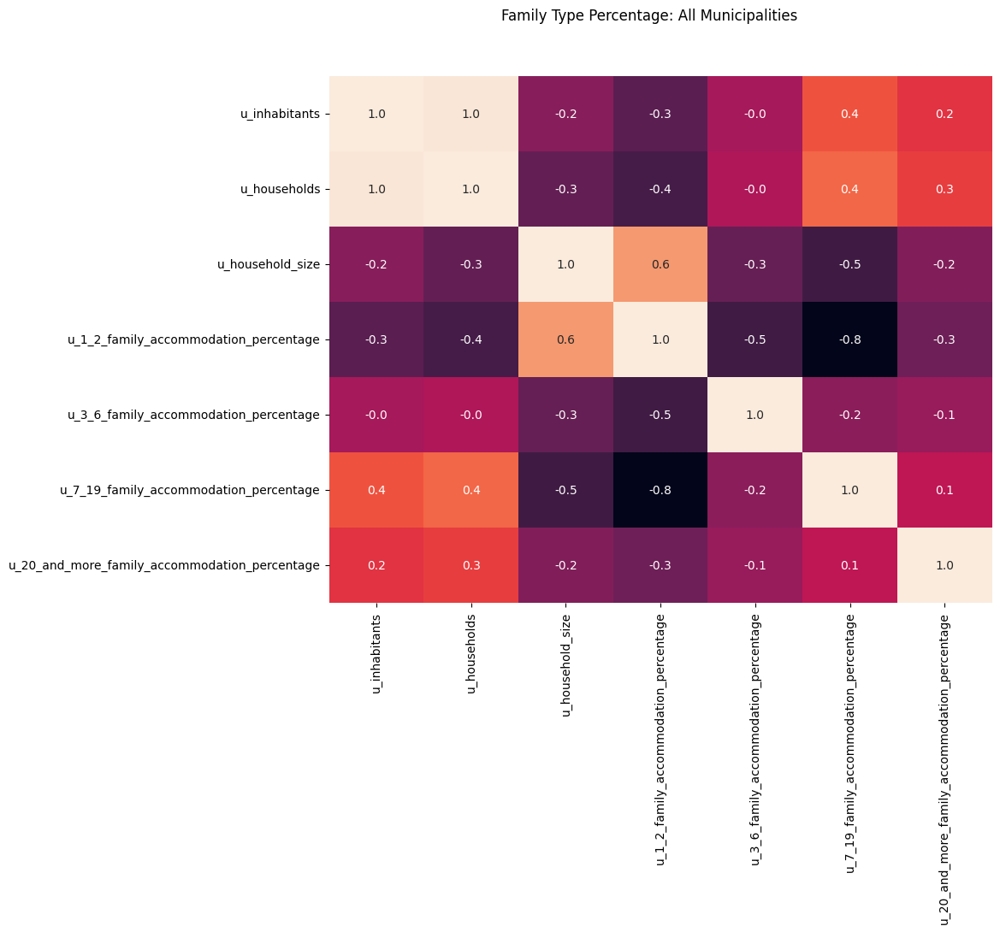

In [143]:
heatmap_plot(data=data, 
             mask=None, 
             indices=family_type_percentage_indices_org, 
             title="Family Type Percentage: All Municipalities")

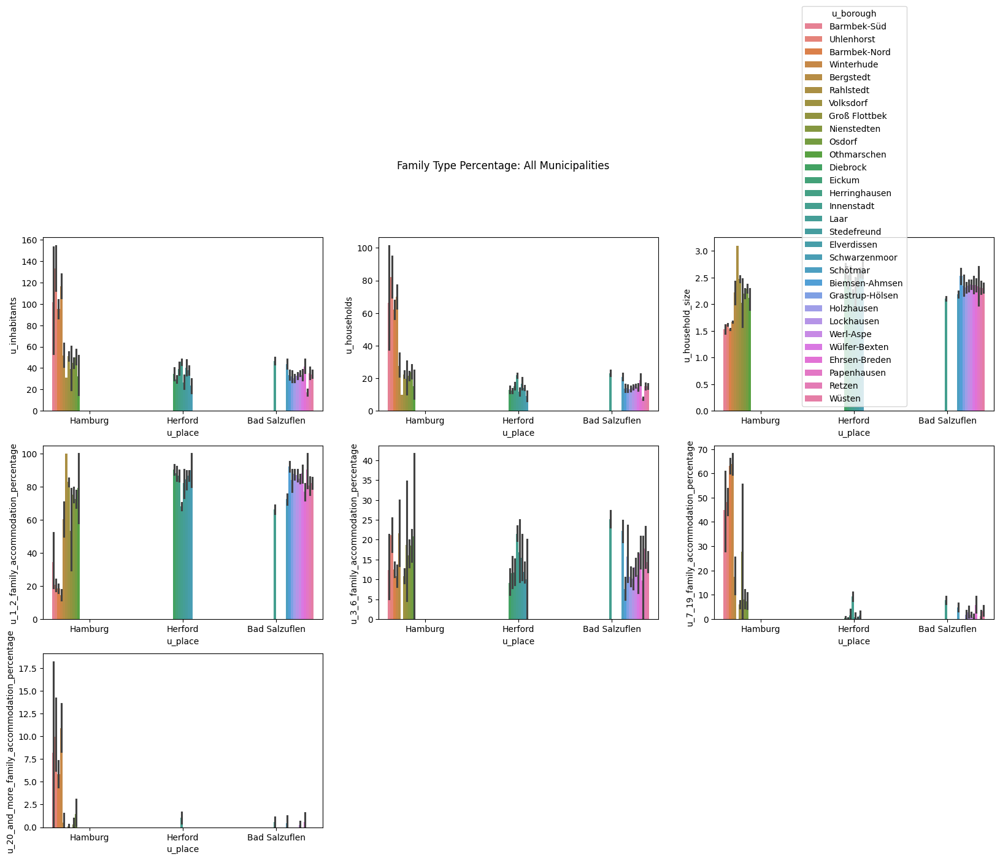

In [144]:
bar_plot(data=data, 
         x="u_place", 
         y=family_type_percentage_indices_org, 
         hue="u_borough", 
         fig_title="Family Type Percentage: All Municipalities", 
         nrows=nrows, 
         ncols=ncols)

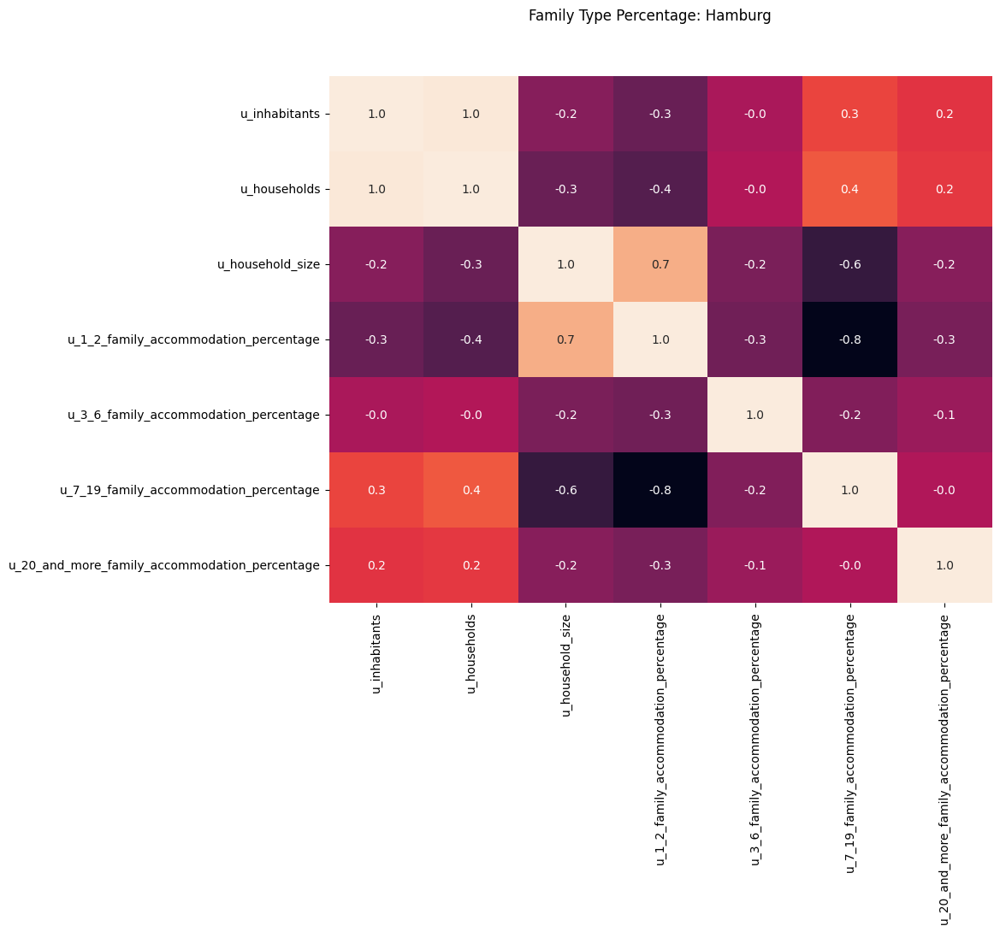

In [145]:
heatmap_plot(data=data, 
             mask=mask_hamburg, 
             indices=family_type_percentage_indices_org, 
             title="Family Type Percentage: Hamburg")

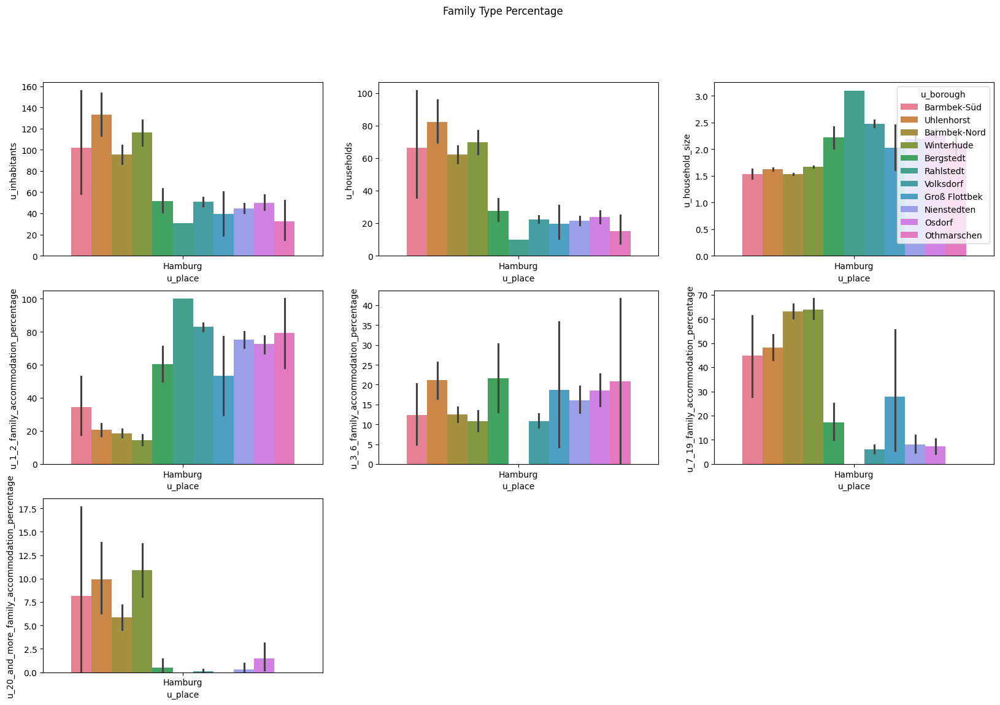

In [146]:
bar_plot(data=data.iloc[mask_hamburg, :], 
         x="u_place", 
         y=family_type_percentage_indices_org, 
         hue="u_borough",
         fig_title="Family Type Percentage", 
         nrows=nrows, 
         ncols=ncols)

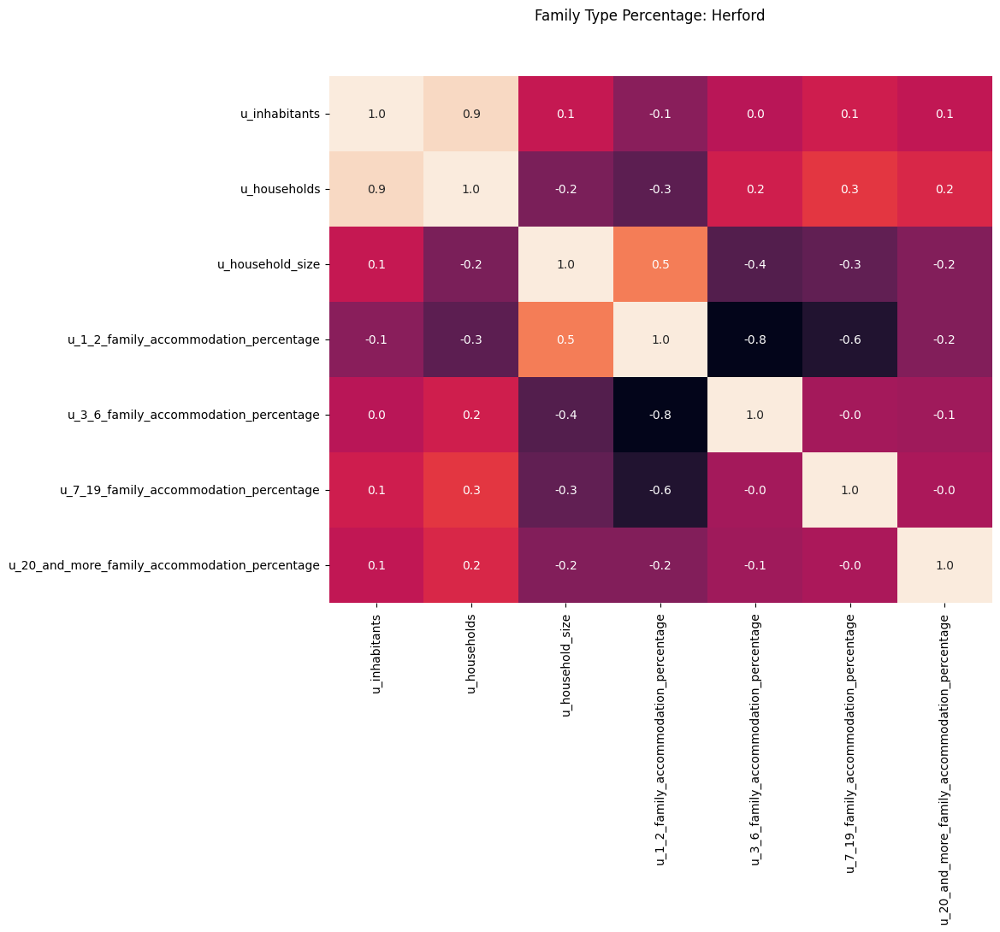

In [147]:
heatmap_plot(data=data, 
             mask=mask_herford, 
             indices=family_type_percentage_indices_org, 
             title="Family Type Percentage: Herford")

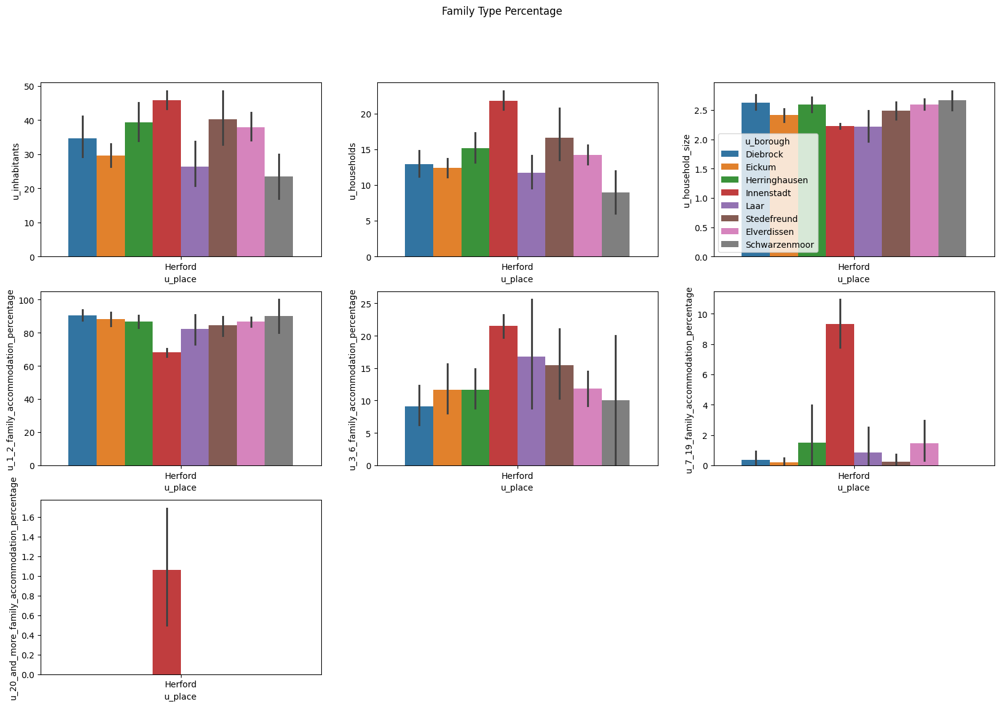

In [148]:
bar_plot(data=data.iloc[mask_herford, :], 
         x="u_place", 
         y=family_type_percentage_indices_org, 
         hue="u_borough", 
         fig_title="Family Type Percentage", 
         nrows=nrows, 
         ncols=ncols)

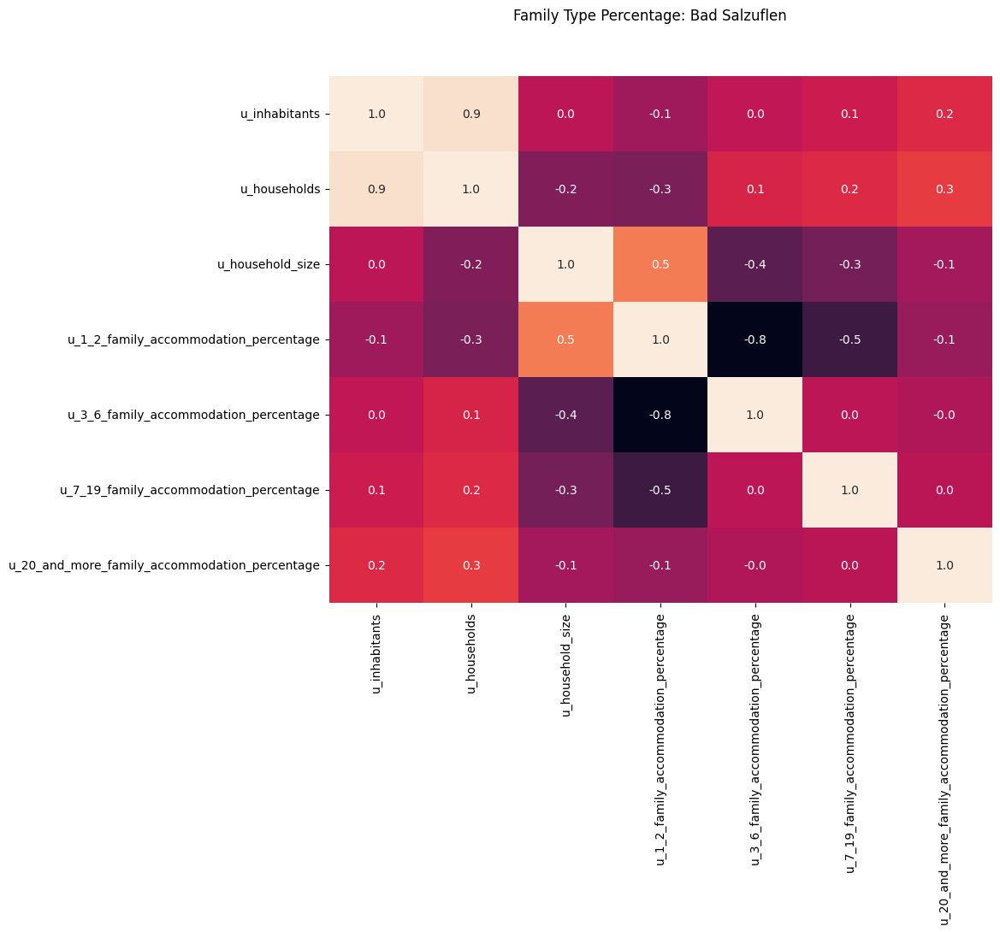

In [149]:
heatmap_plot(data=data, 
             mask=mask_bad_salzuflen, 
             indices=family_type_percentage_indices_org, 
             title="Family Type Percentage: Bad Salzuflen")

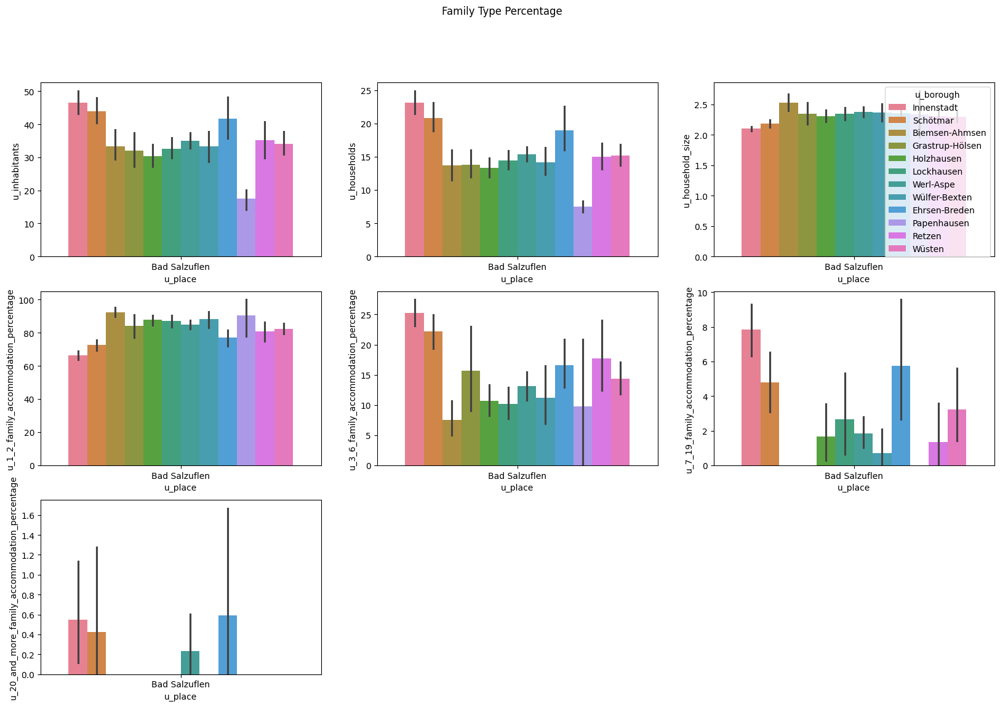

In [150]:
bar_plot(data=data.iloc[mask_bad_salzuflen, :], 
         x="u_place", 
         y=family_type_percentage_indices_org, 
         hue="u_borough", 
         fig_title="Family Type Percentage", 
         nrows=nrows, 
         ncols=ncols)

#### Family Type Index

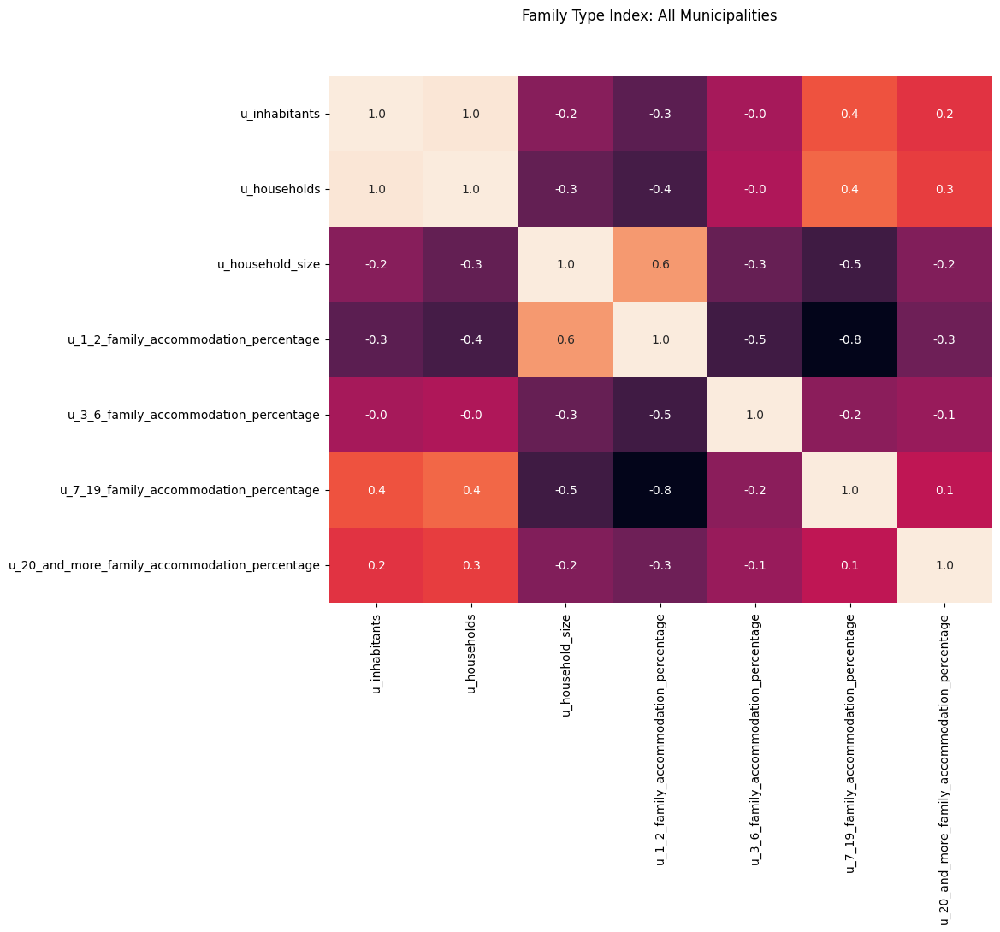

In [151]:
heatmap_plot(data=data, 
             mask=None, 
             indices=family_type_percentage_indices_org, 
             title="Family Type Index: All Municipalities")

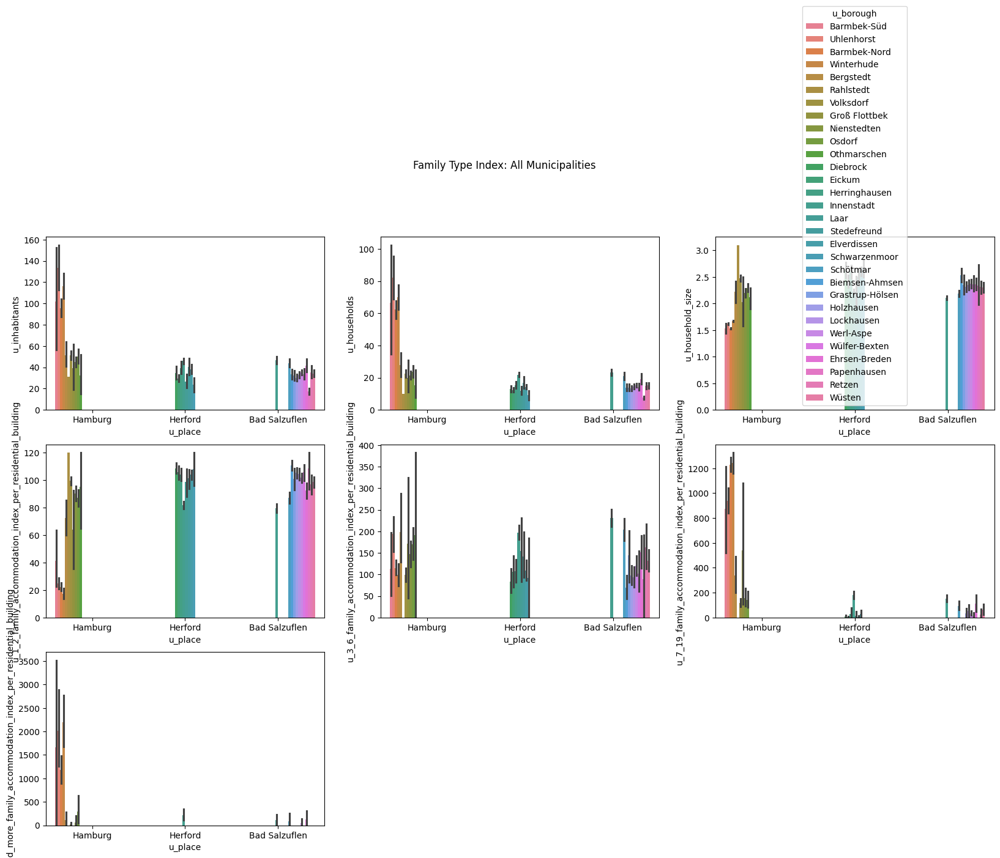

In [152]:
bar_plot(data=data, 
         x="u_place", 
         y=family_type_index_indices_org, 
         hue="u_borough", 
         fig_title="Family Type Index: All Municipalities", 
         nrows=nrows, 
         ncols=ncols)

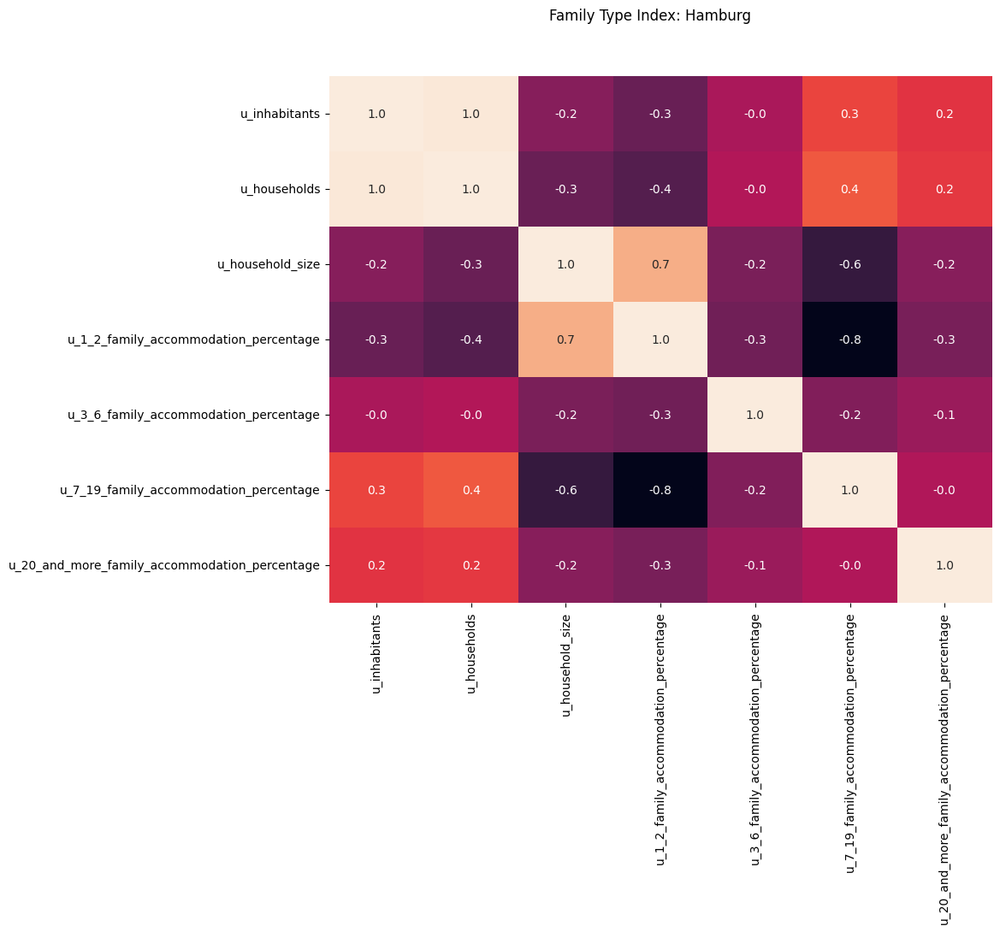

In [153]:
heatmap_plot(data=data, 
             mask=mask_hamburg, 
             indices=family_type_percentage_indices_org, 
             title="Family Type Index: Hamburg")

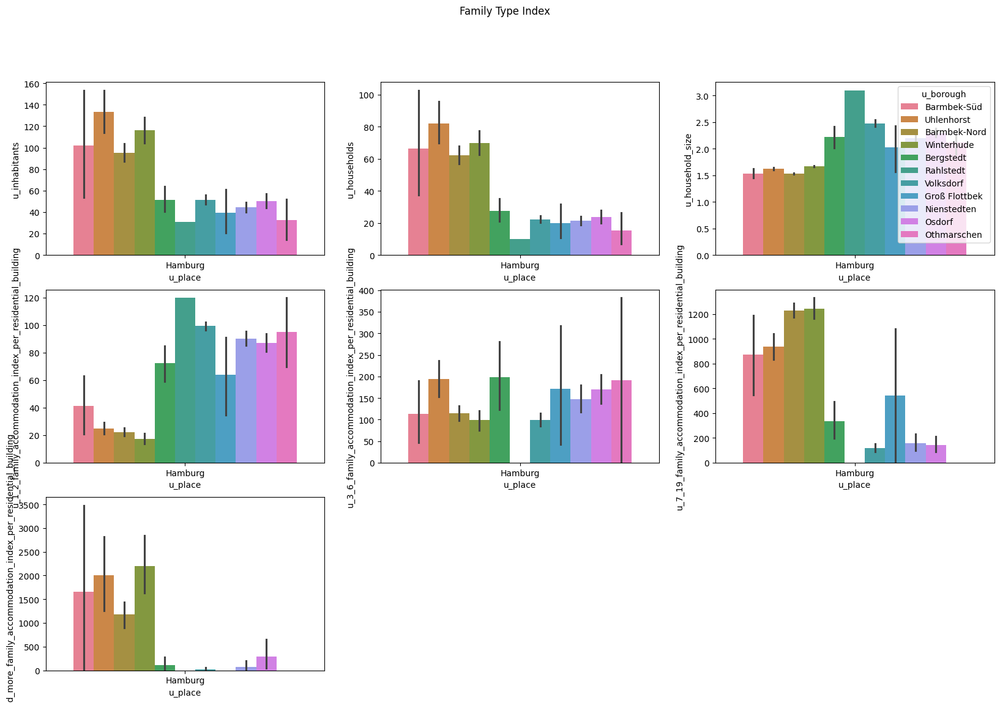

In [154]:
bar_plot(data=data.iloc[mask_hamburg, :], 
         x="u_place", 
         y=family_type_index_indices_org, 
         hue="u_borough",
         fig_title="Family Type Index", 
         nrows=nrows, 
         ncols=ncols)

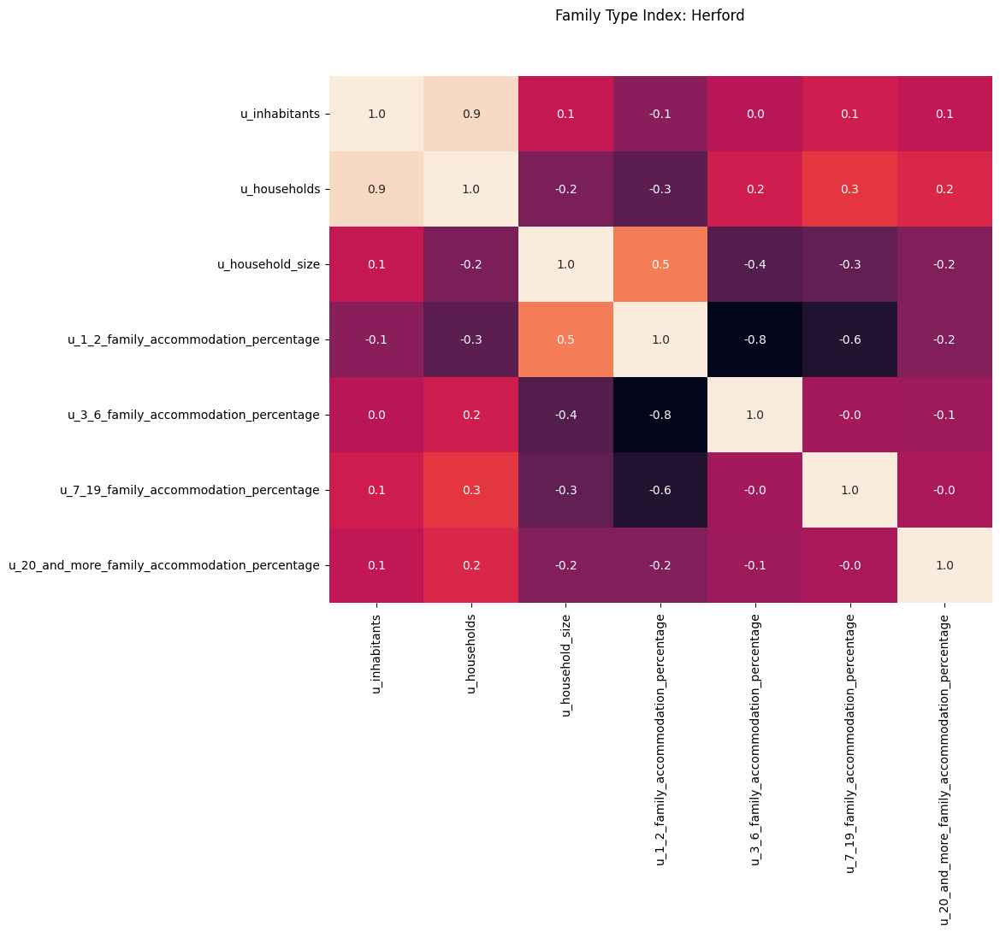

In [155]:
heatmap_plot(data=data, 
             mask=mask_herford, 
             indices=family_type_percentage_indices_org, 
             title="Family Type Index: Herford")

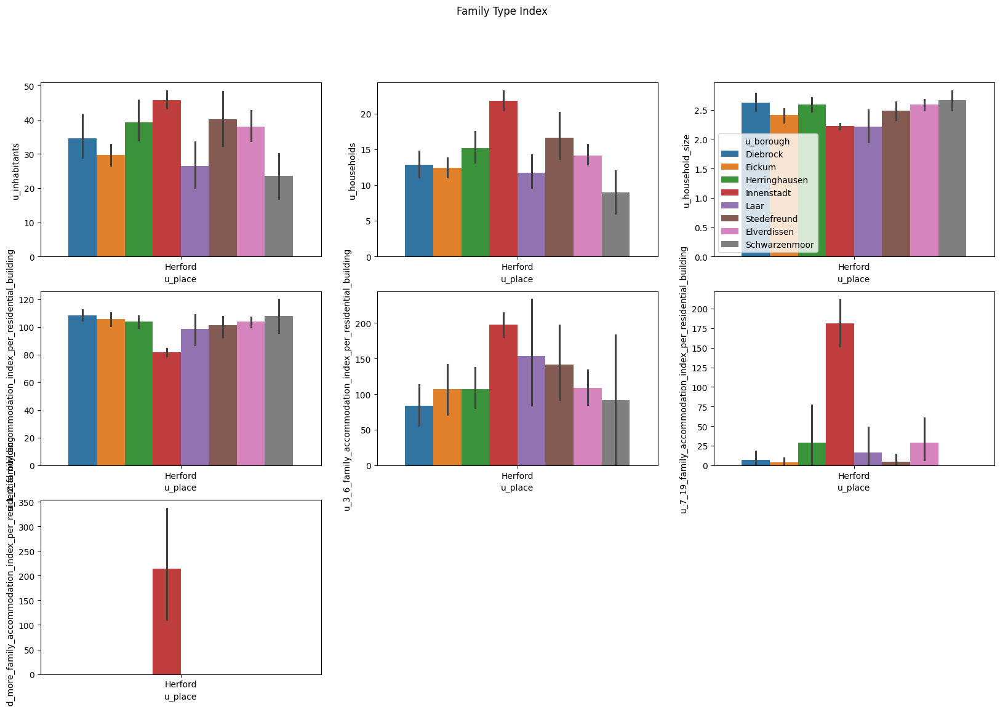

In [156]:
bar_plot(data=data.iloc[mask_herford, :], 
         x="u_place", 
         y=family_type_index_indices_org, 
         hue="u_borough", 
         fig_title="Family Type Index", 
         nrows=nrows, 
         ncols=ncols)

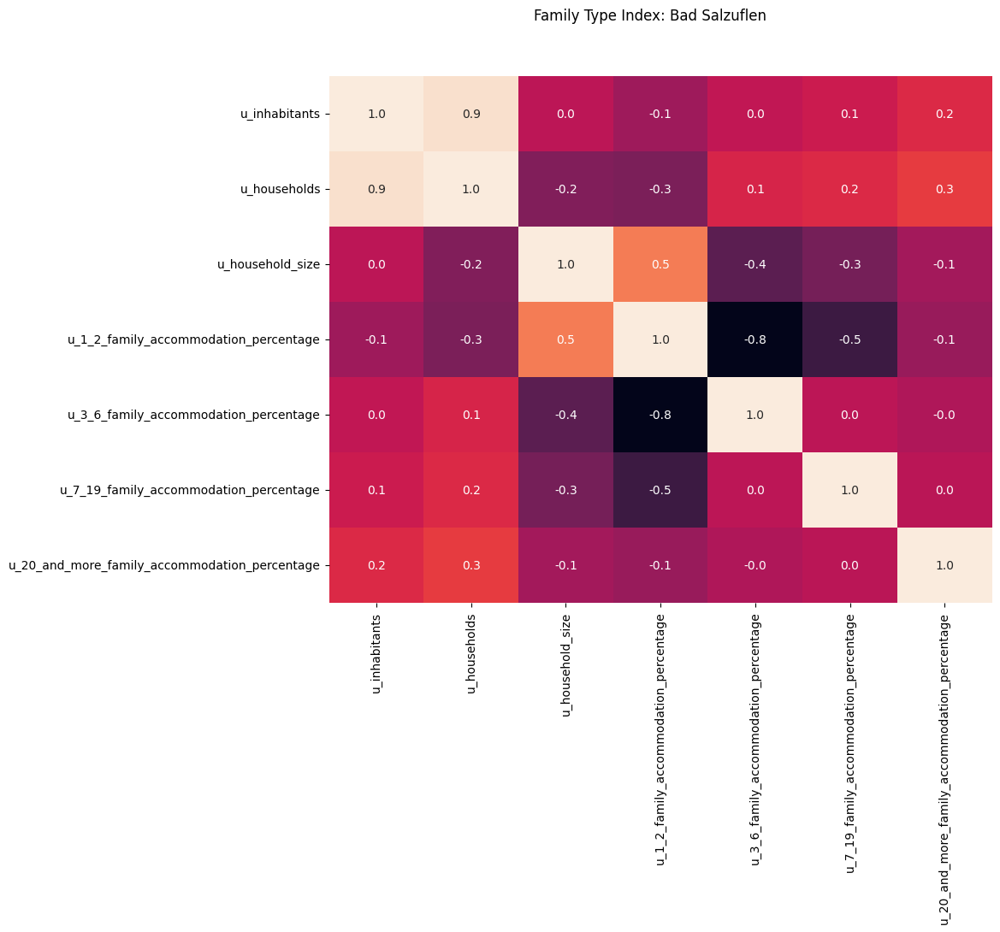

In [157]:
heatmap_plot(data=data, 
             mask=mask_bad_salzuflen, 
             indices=family_type_percentage_indices_org, 
             title="Family Type Index: Bad Salzuflen")

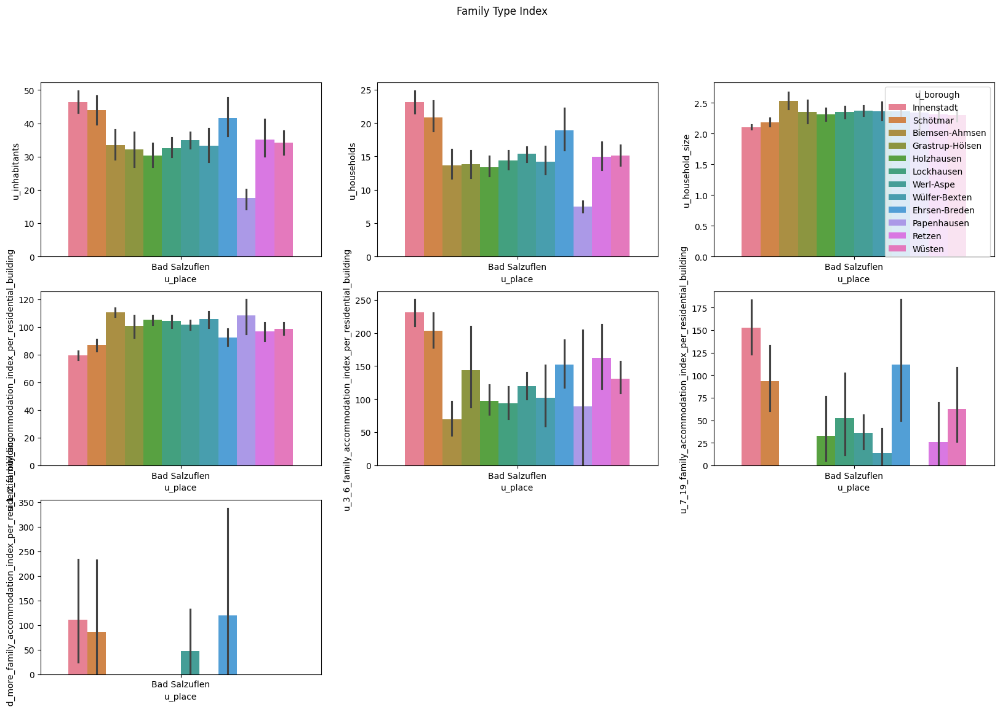

In [158]:
bar_plot(data=data.iloc[mask_bad_salzuflen, :], 
         x="u_place", 
         y=family_type_index_indices_org, 
         hue="u_borough",  
         fig_title="Family Type Index", 
         nrows=nrows, 
         ncols=ncols)

**Conclusion:**

I) Overall observations:
 1. In overall most of the "u_household_income*" is disributed in the range of [0, 10].
 2. For Hamburg, there is a positive correlation of the number of households with income 2500+ in Bamberk-Nord, Uhlenhorst, and Bamberk-Süd.
 3. In Herford households with income 2500+ is concentrated in Innenstadt and Biebrock.
 4. In Bad Salzuflen this trend is noticeable in Innenstadt and Schötmar.
 5. Some imbalance is noticeable during the overall histplot of the data, with Hamburg having the most of the observations, followed by Bad Salzuflen and then Herford.
 6. Most of the Hamburg data is comming from Bamberk-Nord and Volksdorf. Bamberk-Süd, Uhlenhorst, Bamberk-Nord, and Winterhude has higher u_households.
 7. As for Herford and Bad Salzuflen, Innenstadt is mostly observed with a slight occupation of Schötmar for Bad Salzuflen. Innenstadt, Chötmar, and Ehrsen-Breden has higher u_households.

II) Correlation Analysis:
 1. In Hamburg there is a positive correlation observed between the u_household_income_2500+ and the u_households.
 2. In Herford as well as in Bad Salzuflen this trnd is not very noticeable.
 3. In overall, #households with lower incomes than 2500 has a positive correlation with u_households.
 4. #households with income 2500+ is concentrated in Bamberk-Nord, Uhlenhorst and Volksdorf with them having the highest positive correlation between u_households and u_income_households_2500+.
 5. Herford and Bad Salzuflen does not show much of a correlation between these variables.
 6. Analysing the Index of the u_households_income_2500+ and u_households show that there is a small negative correlation between the two.
 7. Households with immigrantion background show a positive correlation with the number of single person households, however a negative correlation exist when looking at the u_household_size variable.
 8. A positive correlation exist between the number of multiple person household with children and the household size.



## Age Distribution of the Population:

In [159]:
data.iloc[:, 38].describe()

count    4756.000000
mean       53.115033
std         7.287617
min        30.611100
25%        47.500000
50%        53.184150
75%        58.302375
max        74.500000
Name: u_household_head_age, dtype: float64

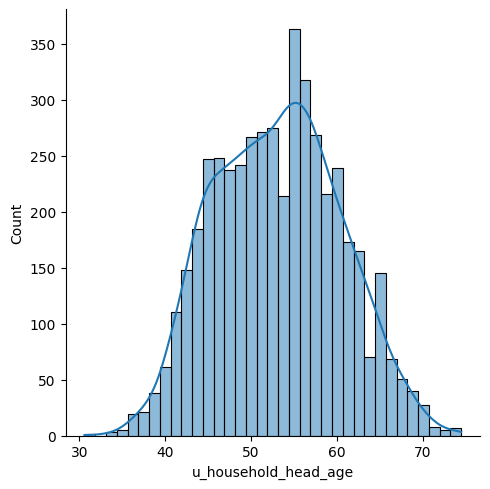

In [160]:
sns.displot(data=data, x="u_household_head_age", kde=True)
plt.show()

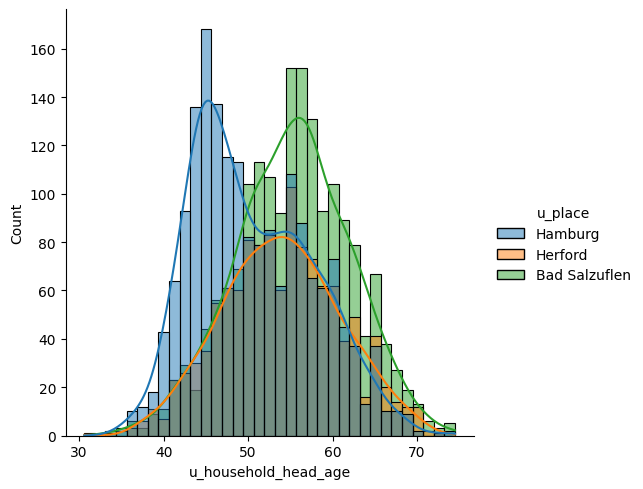

In [161]:
sns.displot(data=data, x="u_household_head_age", hue="u_place", kde=True)
plt.show()

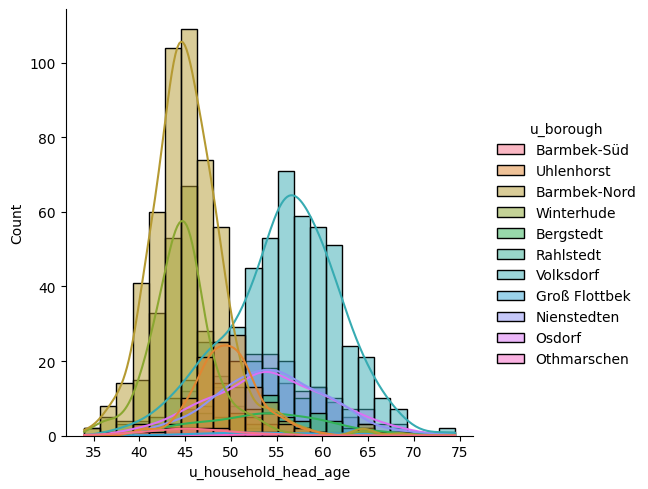

In [162]:
sns.displot(data=data.iloc[mask_hamburg], x="u_household_head_age", hue="u_borough", kde=True)
plt.show()

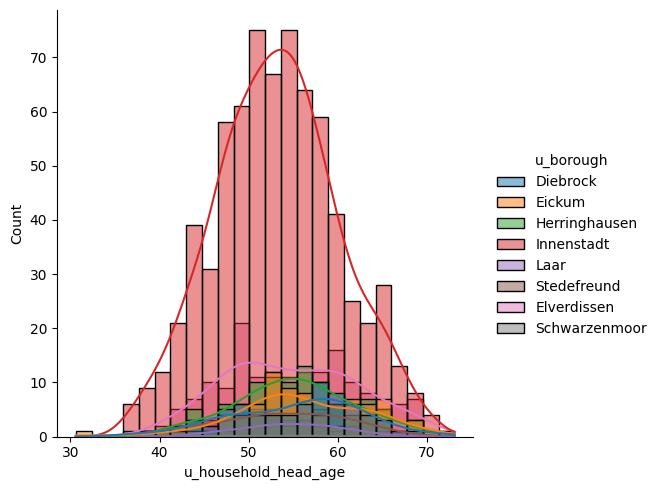

In [163]:
sns.displot(data=data.iloc[mask_herford], x="u_household_head_age", hue="u_borough", kde=True)
plt.show()

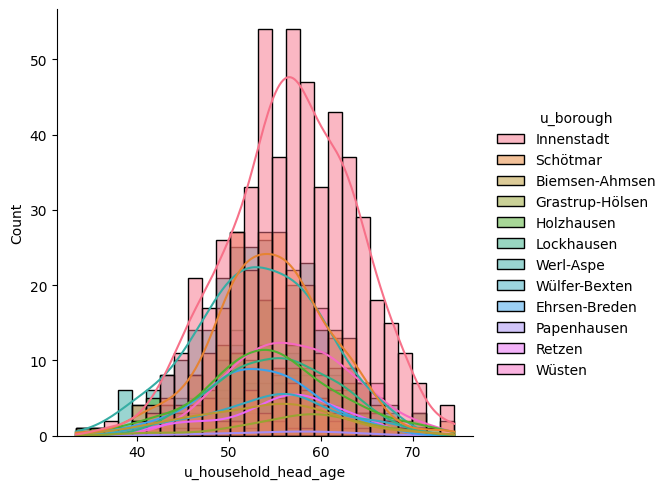

In [164]:
sns.displot(data=data.iloc[mask_bad_salzuflen], x="u_household_head_age", hue="u_borough", kde=True)
plt.show()

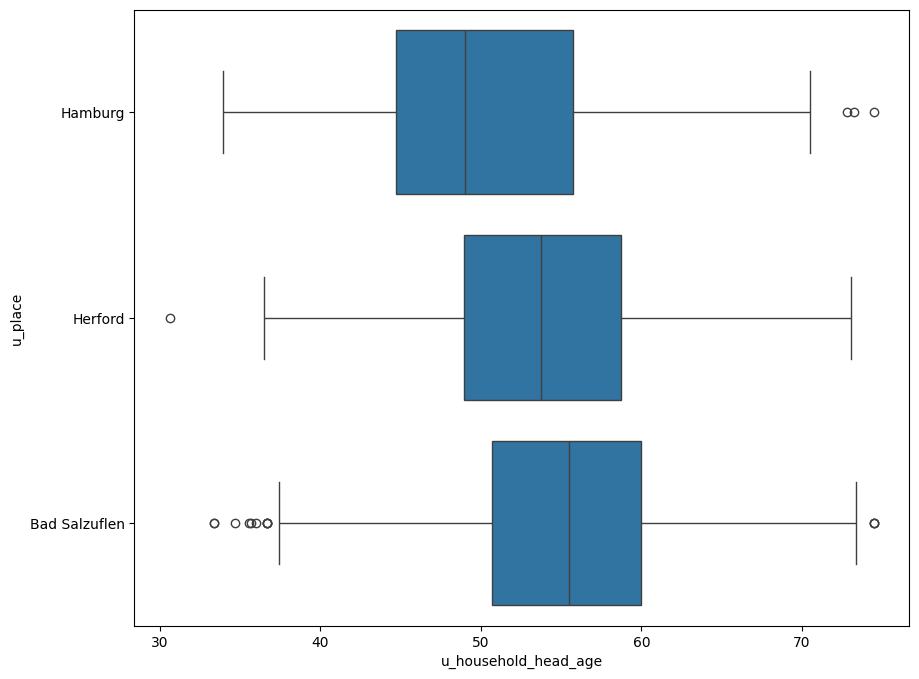

In [165]:
sns.boxplot(data=data, x="u_household_head_age", y="u_place")
plt.show()

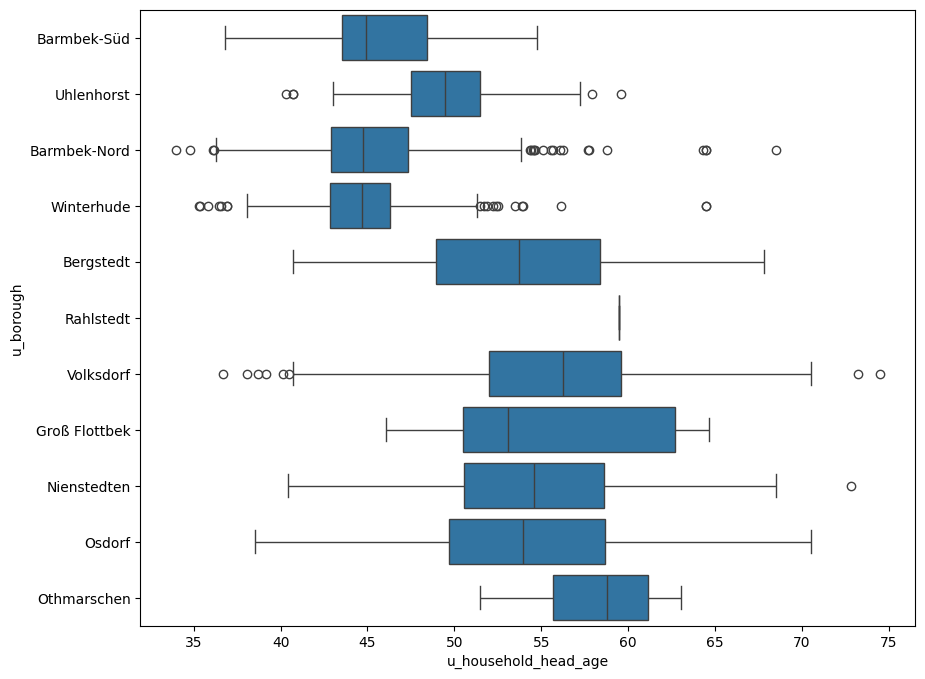

In [166]:
sns.boxplot(data=data.iloc[mask_hamburg], x="u_household_head_age", y="u_borough")
plt.show()

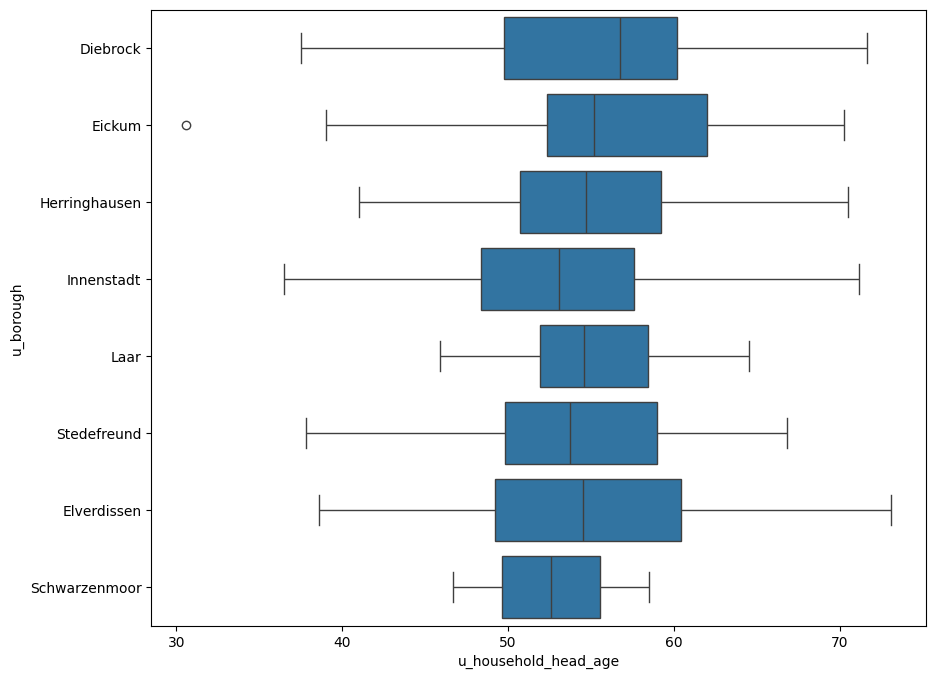

In [167]:
sns.boxplot(data=data.iloc[mask_herford], x="u_household_head_age", y="u_borough")
plt.show()

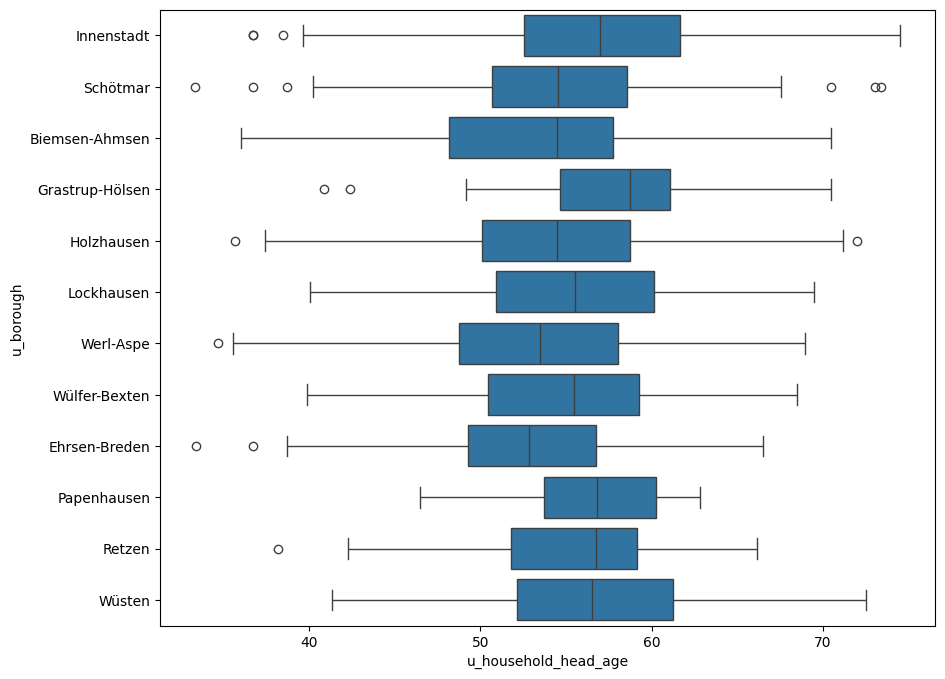

In [168]:
sns.boxplot(data=data.iloc[mask_bad_salzuflen], x="u_household_head_age", y="u_borough")
plt.show()

In [169]:
data.iloc[:, [23, 26, 29, 32, 35]].describe()

,u_household_head_up_to_under_30_years,u_household_head_30_to_under_40_years,u_household_head_40_to_under_50_years,u_household_head_50_to_under_60_years,u_household_head_60_years_and_older
count,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000
mean,3.740749,5.264929,4.447645,5.090412,9.413583
std,7.420569,9.265884,6.876834,6.360616,10.704810
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,1.000000,1.000000,4.000000
50%,1.000000,2.000000,2.000000,4.000000,6.000000
75%,4.000000,5.000000,5.000000,6.000000,11.000000
max,115.000000,135.000000,99.000000,84.000000,133.000000


In [170]:
data.iloc[:, [24, 27, 30, 33, 36]].describe()

,u_household_head_up_to_under_30_years_percentage,u_household_head_30_to_under_40_years_percentage,u_household_head_40_to_under_50_years_percentage,u_household_head_50_to_under_60_years_percentage,u_household_head_60_years_and_older_percentage
count,4756.000000,4756.00000,4756.000000,4756.00000,4756.000000
mean,10.256859,16.00123,14.858447,19.90936,38.974095
std,9.024275,11.91452,10.673714,13.30570,20.471786
min,0.000000,0.00000,0.000000,0.00000,0.000000
25%,0.000000,7.53540,8.333300,12.27175,22.705850
50%,10.000000,15.38460,14.285700,17.64710,38.126550
75%,16.666700,24.32430,20.000000,26.66670,53.333300
max,60.000000,87.50000,85.714300,100.00000,100.000000


In [171]:
data.iloc[:, [25, 28, 31, 34, 37]].describe()

,u_household_head_up_to_under_30_years_per_household_index,u_household_head_30_to_under_40_years_per_household_index,u_household_head_40_to_under_50_years_per_household_index,u_household_head_50_to_under_60_years_per_household_index,u_household_head_60_years_and_older_per_household_index
count,4756.000000,4756.000000,4756.000000,4756.000000,4756.000000
mean,91.519075,98.708874,98.683285,101.627357,102.739560
std,80.521089,73.498661,70.890103,67.918976,53.965637
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,46.484250,55.346000,62.641250,59.854500
50%,89.227000,94.905000,94.879000,90.079000,100.505500
75%,148.712000,150.053000,132.831000,136.120000,140.592000
max,535.363000,539.772000,569.277000,510.450000,263.610000


In [172]:
age_distribution_indices = data.iloc[:, [23, 26, 29, 32, 35]].columns
age_distribution_percentage_indices = data.iloc[:, [24, 27, 30, 33, 36]].columns
age_distribution_index_indices = data.iloc[:, [25, 28, 31, 34, 37]].columns

age_distribution_indices_org = age_distribution_indices.tolist()
age_distribution_percentage_indices_org = age_distribution_percentage_indices.tolist()
age_distribution_index_indices_org = age_distribution_index_indices.tolist()

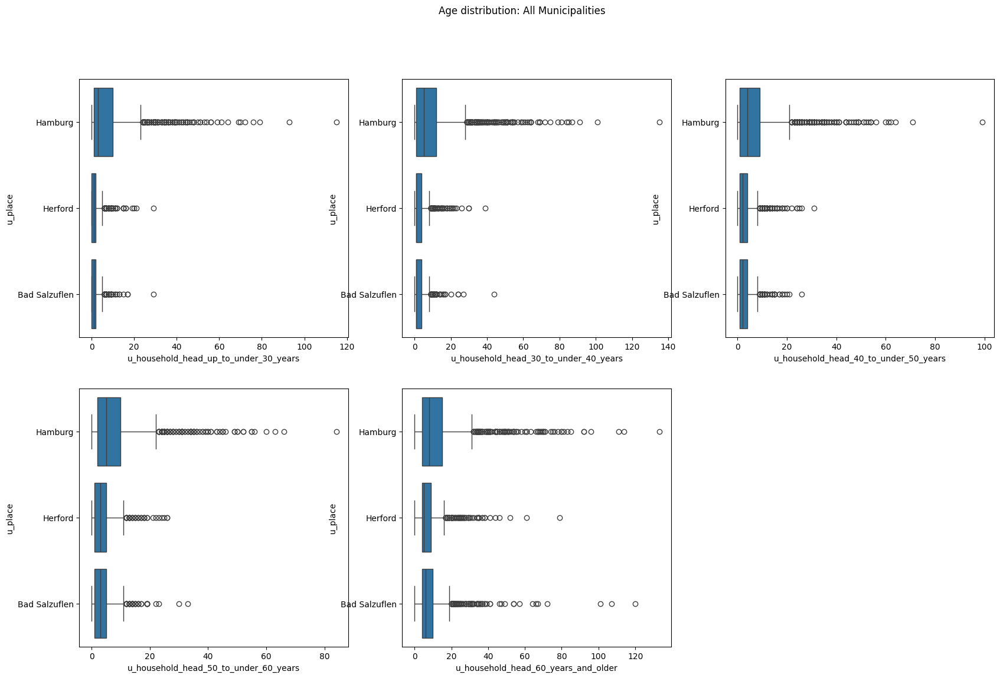

In [173]:
box_plot(data=data, 
         x=age_distribution_indices_org, 
         y="u_place", 
         fig_title="Age distribution: All Municipalities", 
         nrows=2, 
         ncols=3)

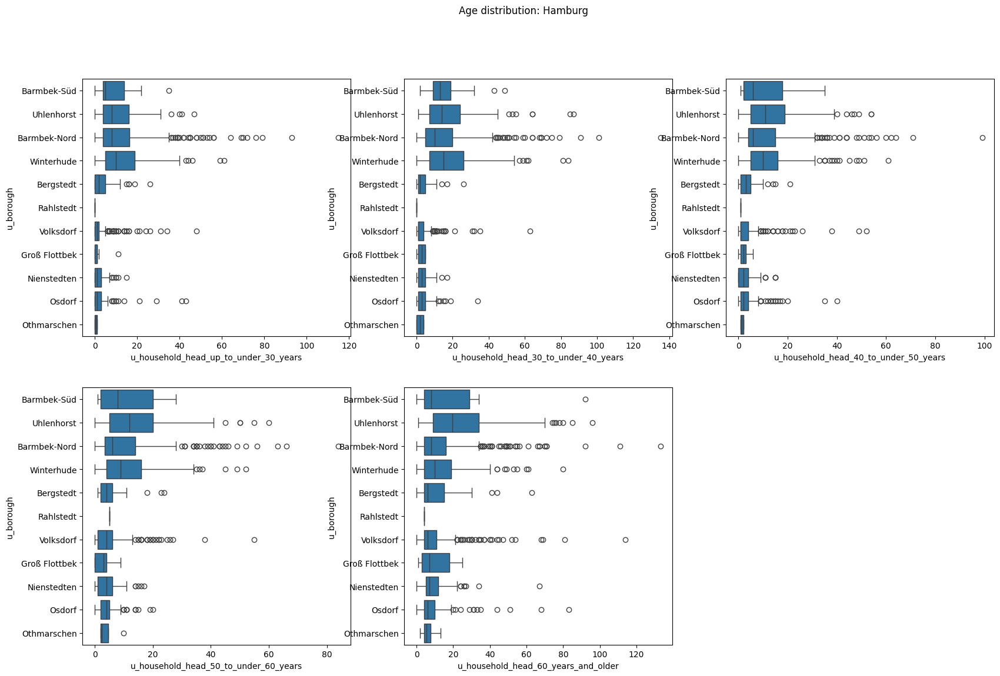

In [174]:
box_plot(data=data[mask_hamburg], 
         x=age_distribution_indices_org, 
         y="u_borough", 
         fig_title="Age distribution: Hamburg", 
         nrows=2, 
         ncols=3)

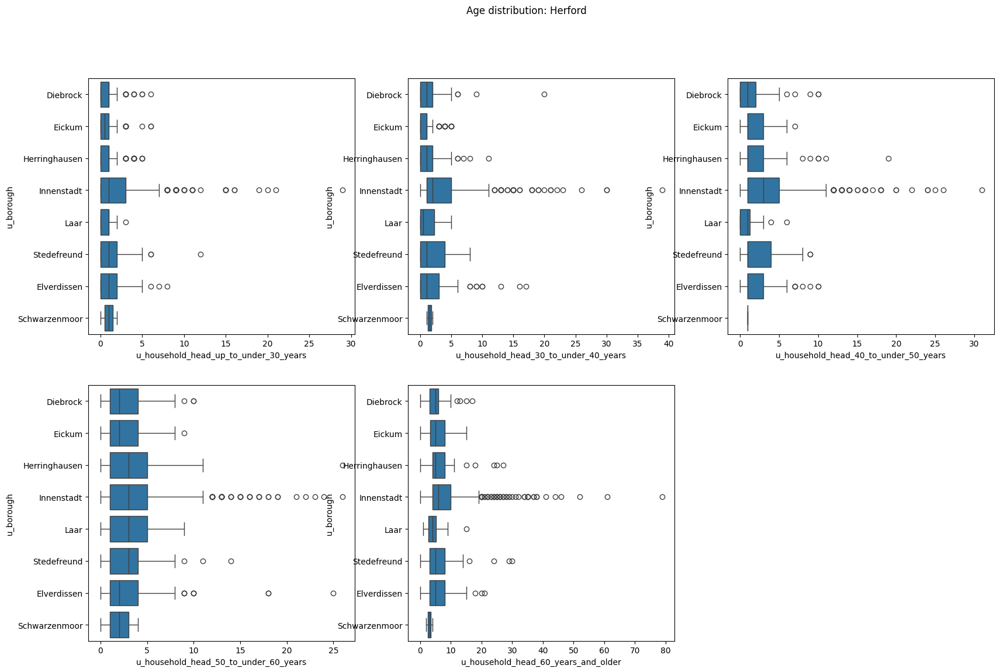

In [175]:
box_plot(data=data[mask_herford], 
         x=age_distribution_indices_org, 
         y="u_borough", 
         fig_title="Age distribution: Herford", 
         nrows=2, 
         ncols=3)

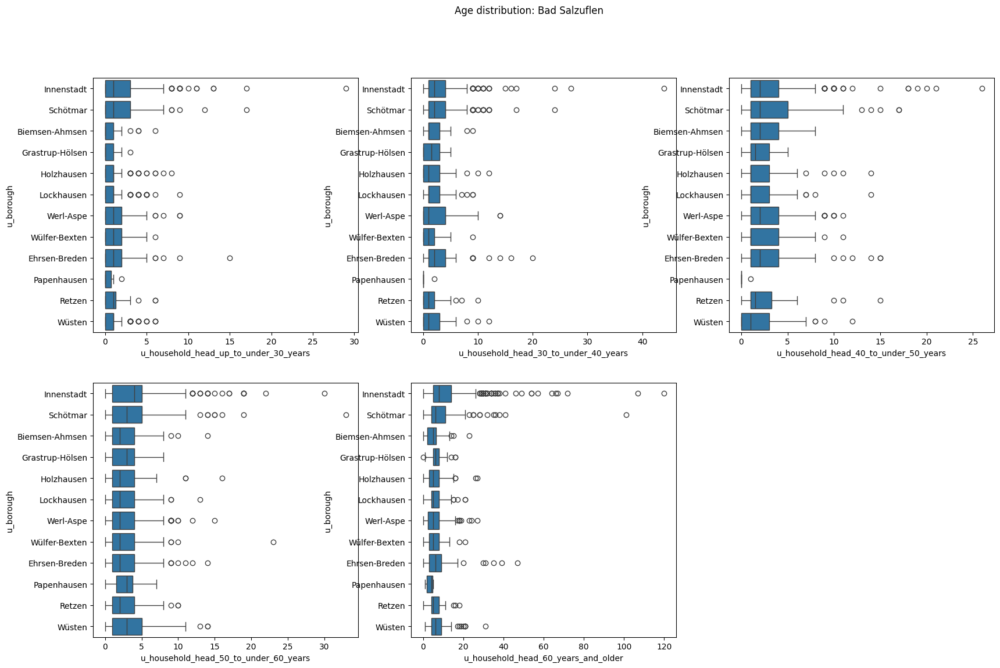

In [176]:
box_plot(data=data[mask_bad_salzuflen], 
         x=age_distribution_indices_org, 
         y="u_borough", 
         fig_title="Age distribution: Bad Salzuflen", 
         nrows=2, 
         ncols=3)

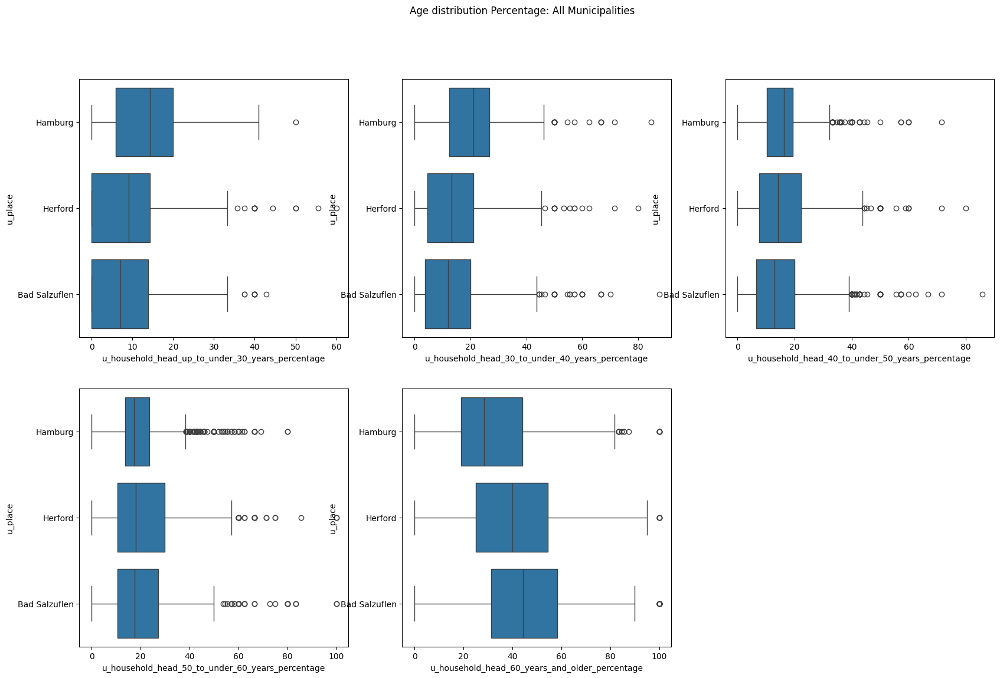

In [177]:
box_plot(data=data, 
         x=age_distribution_percentage_indices_org, 
         y="u_place", 
         fig_title="Age distribution Percentage: All Municipalities", 
         nrows=2, 
         ncols=3)

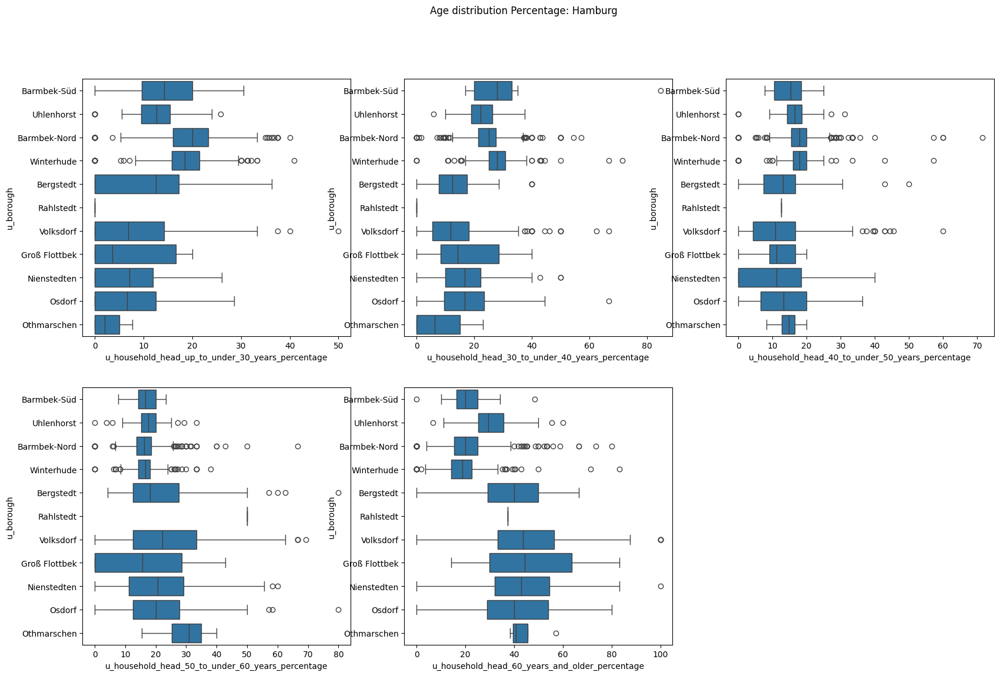

In [178]:
box_plot(data=data[mask_hamburg], 
         x=age_distribution_percentage_indices_org, 
         y="u_borough", 
         fig_title="Age distribution Percentage: Hamburg", 
         nrows=2, 
         ncols=3)

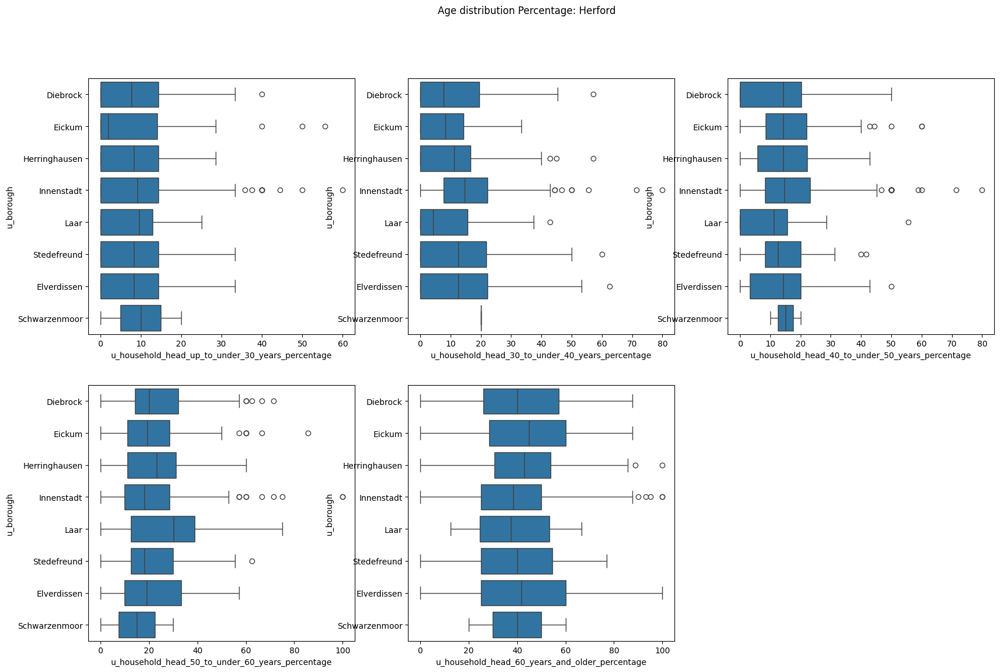

In [179]:
box_plot(data=data[mask_herford], 
         x=age_distribution_percentage_indices_org, 
         y="u_borough", 
         fig_title="Age distribution Percentage: Herford", 
         nrows=2, 
         ncols=3)

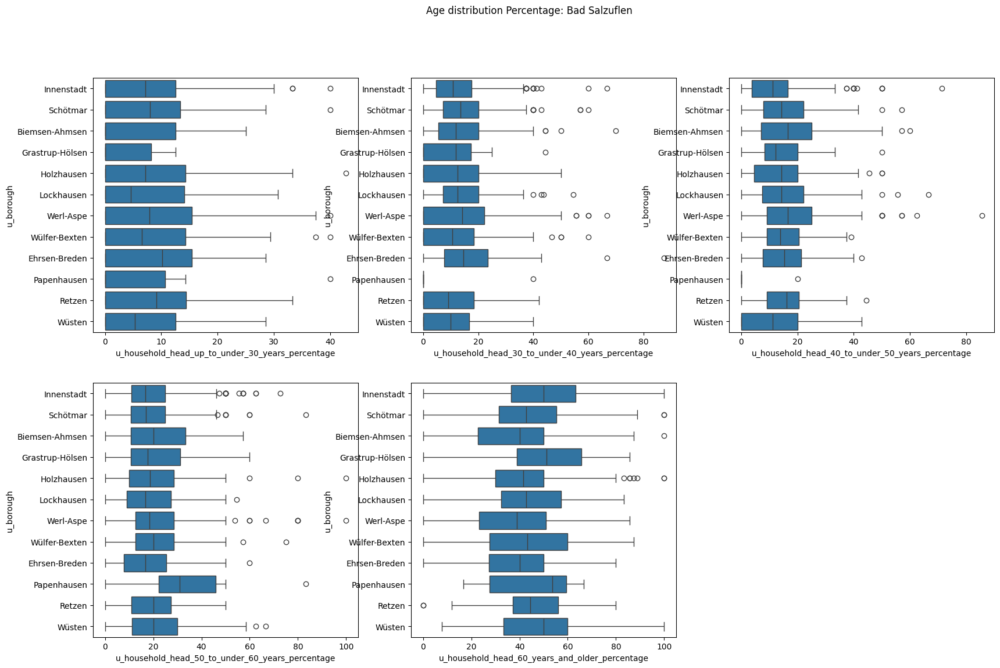

In [180]:
box_plot(data=data[mask_bad_salzuflen], 
         x=age_distribution_percentage_indices_org, 
         y="u_borough", 
         fig_title="Age distribution Percentage: Bad Salzuflen", 
         nrows=2, 
         ncols=3)

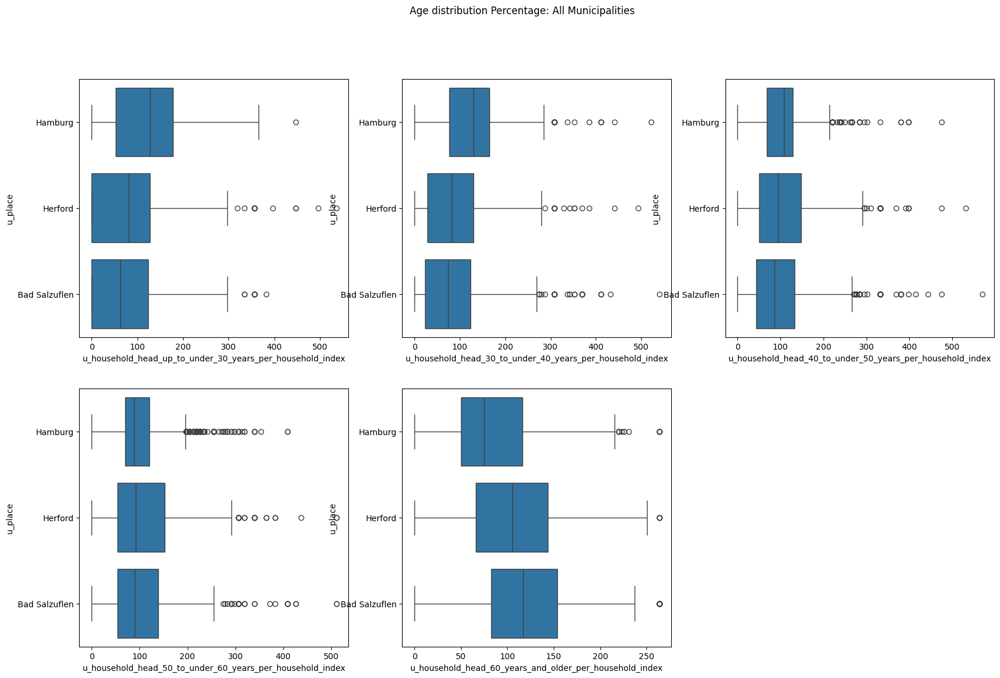

In [181]:
box_plot(data=data, 
         x=age_distribution_index_indices_org, 
         y="u_place", 
         fig_title="Age distribution Percentage: All Municipalities", 
         nrows=2, 
         ncols=3)

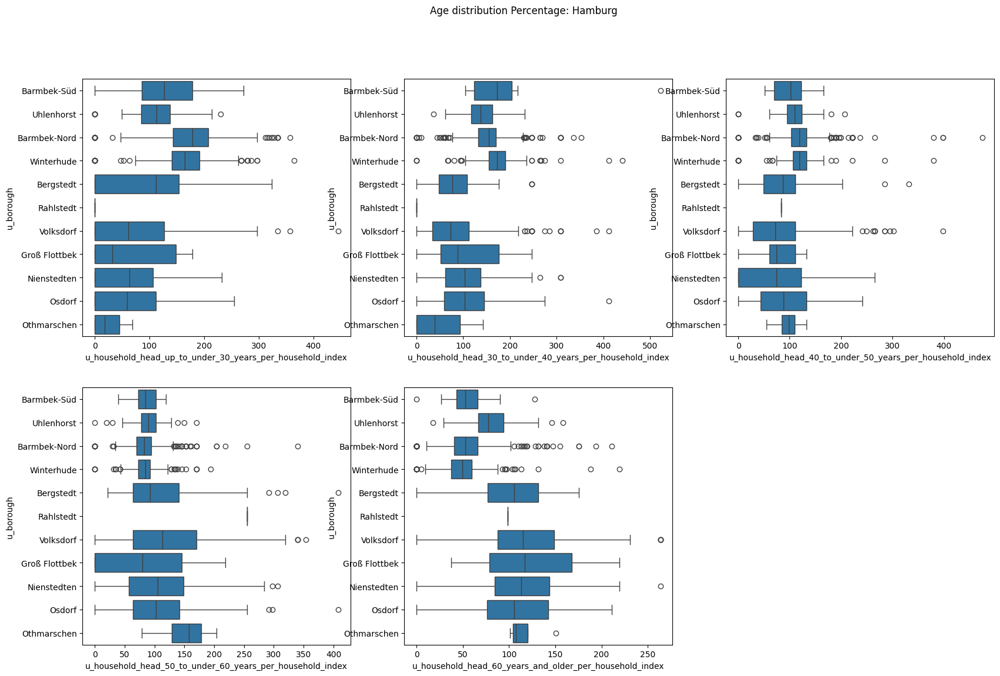

In [182]:
box_plot(data=data[mask_hamburg], 
         x=age_distribution_index_indices_org, 
         y="u_borough", 
         fig_title="Age distribution Percentage: Hamburg", 
         nrows=2, 
         ncols=3)

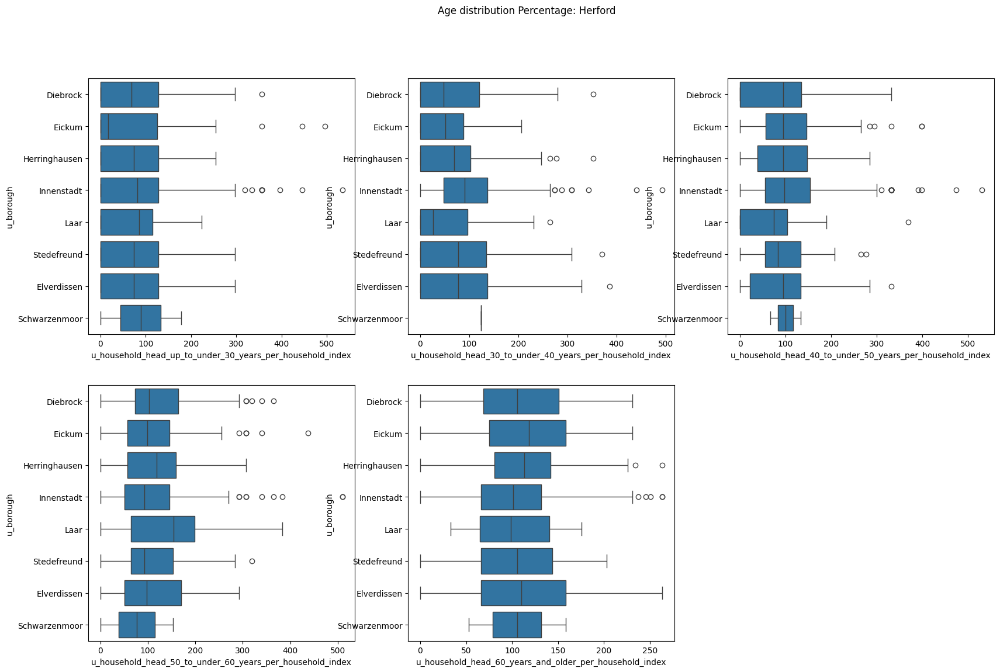

In [183]:
box_plot(data=data[mask_herford], 
         x=age_distribution_index_indices_org, 
         y="u_borough", 
         fig_title="Age distribution Percentage: Herford", 
         nrows=2, 
         ncols=3)

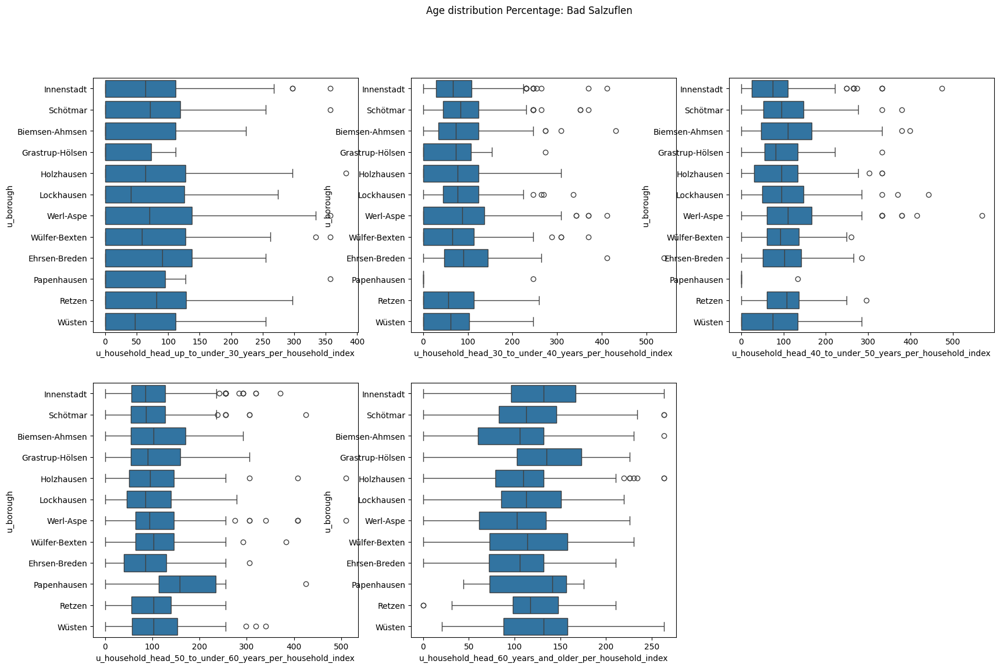

In [184]:
box_plot(data=data[mask_bad_salzuflen], 
         x=age_distribution_index_indices_org, 
         y="u_borough", 
         fig_title="Age distribution Percentage: Bad Salzuflen", 
         nrows=2, 
         ncols=3)

**Conclusion:**
1. Hamburg has the yougest population of households' heads laying in the interval [45, 55]. This is followed by Herford where this variable lays in [48, 58] and then followed by Bad Salzuflen where it is between 52 and 61.
2. Some edges cases can be noticeable in all of the cases.
3. in Hamburg Bamberk-Süd, Bamberk-Nord and Winterhude has the yougest generation of households' heads. Othmarschen, Groß Flottbeck and Volksdorf has the oldest generation.
4. Herford shows a younger generation of households' heads in the Innenstadt area and then followed by Schwarzmoor.
5. Bad Salzuflen has a young generation concentrated in Biemsen-Ahmsen, Holzhausen, however Innenstadt shows a concentration of an older generation of households' heads.

# Segmentation Analysis

## Clustering for region segmentation based on income, housing types, and age demographics.

In [185]:
data = df_resid

For n_clusters = 2 The average silhouette_score is : 0.9103942804813756
For n_clusters = 3 The average silhouette_score is : 0.8443117779591779
For n_clusters = 4 The average silhouette_score is : 0.7269183310382862
For n_clusters = 5 The average silhouette_score is : 0.46276612517708826
For n_clusters = 6 The average silhouette_score is : 0.46789439004011457
For n_clusters = 7 The average silhouette_score is : 0.47813754691804167
For n_clusters = 8 The average silhouette_score is : 0.503879157662318
For n_clusters = 9 The average silhouette_score is : 0.5019355802491376
For n_clusters = 10 The average silhouette_score is : 0.5026890837763305


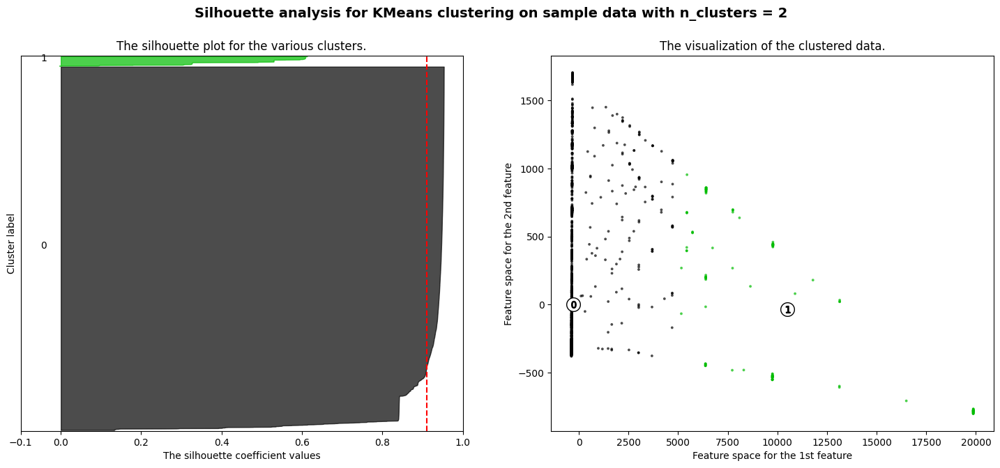

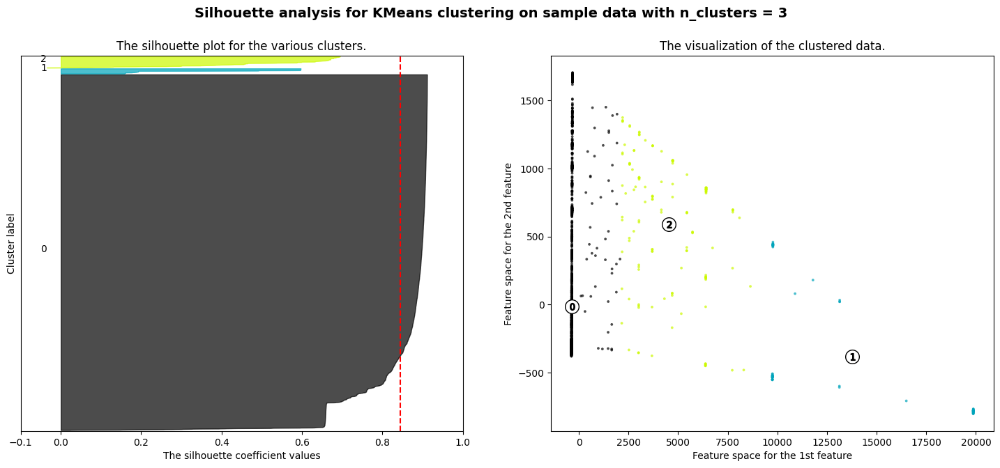

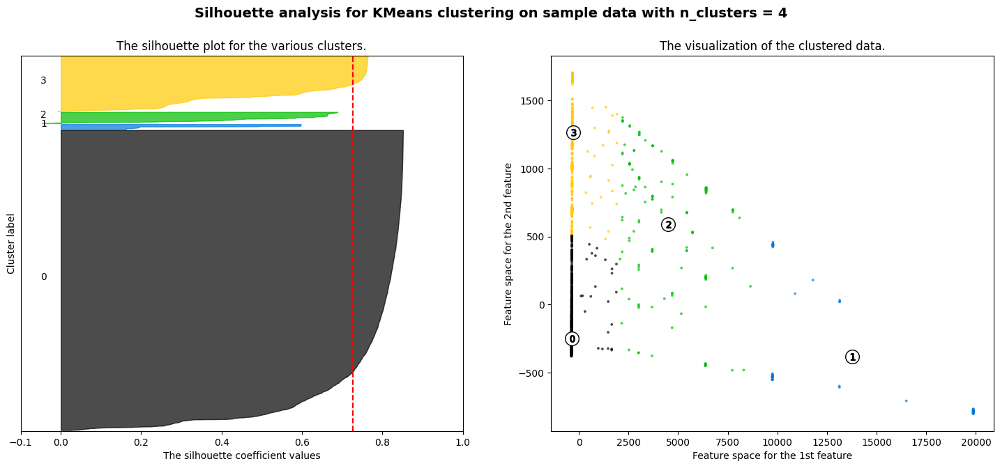

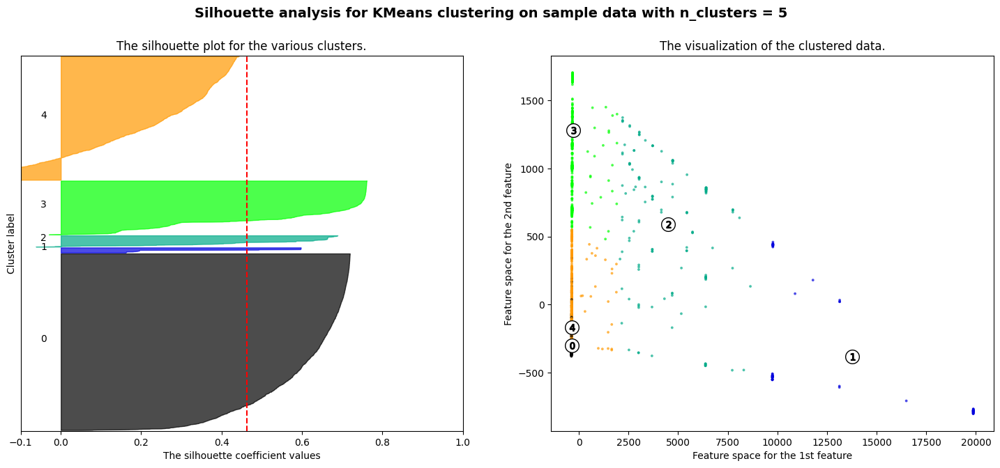

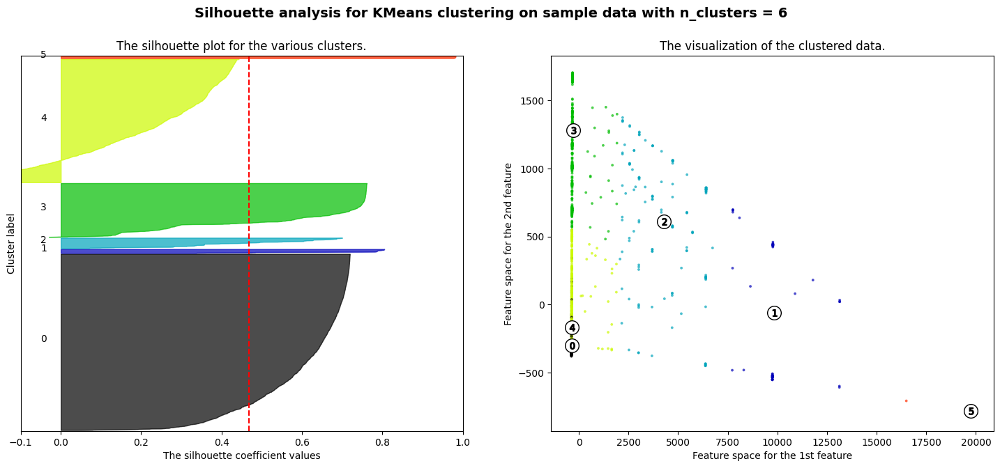

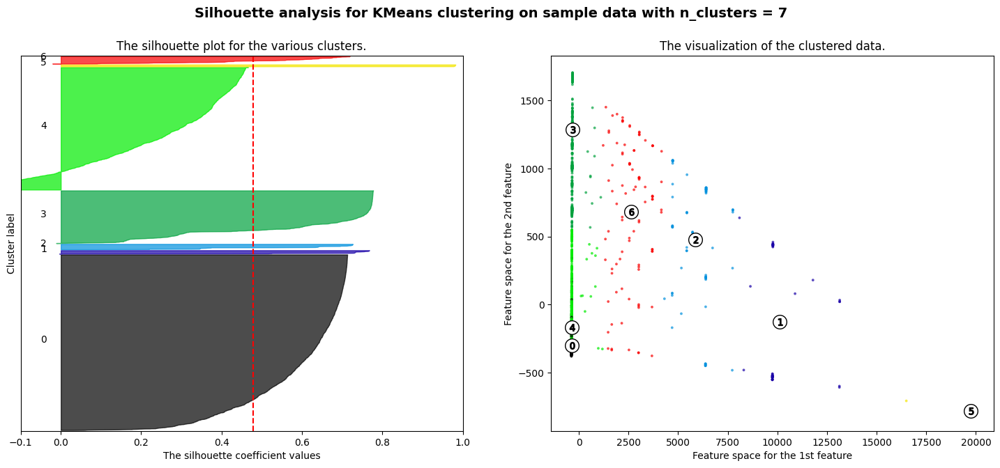

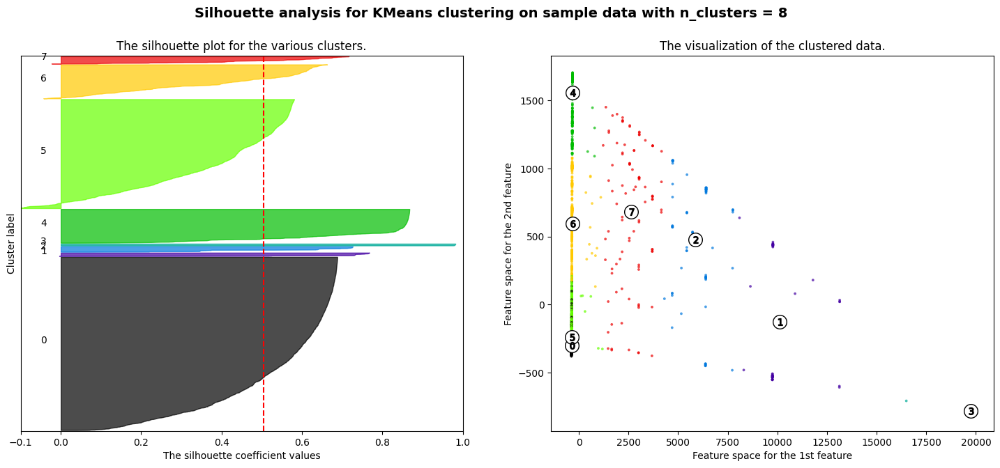

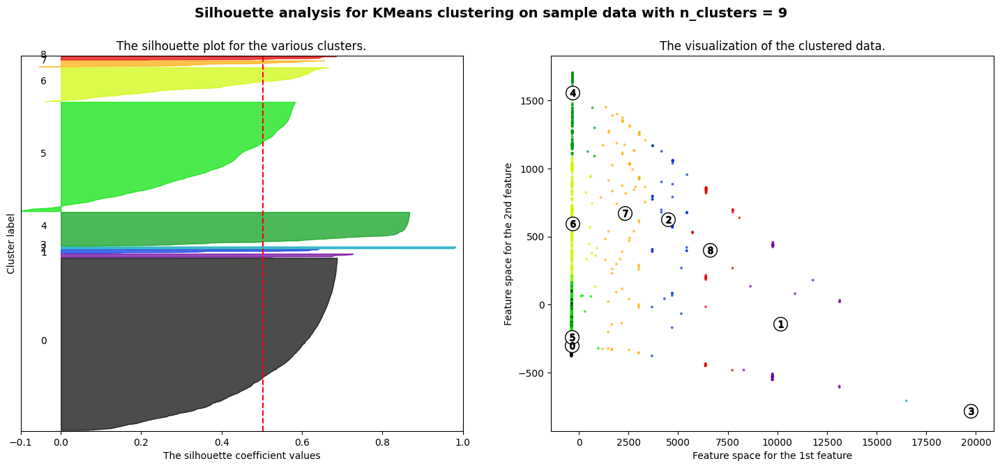

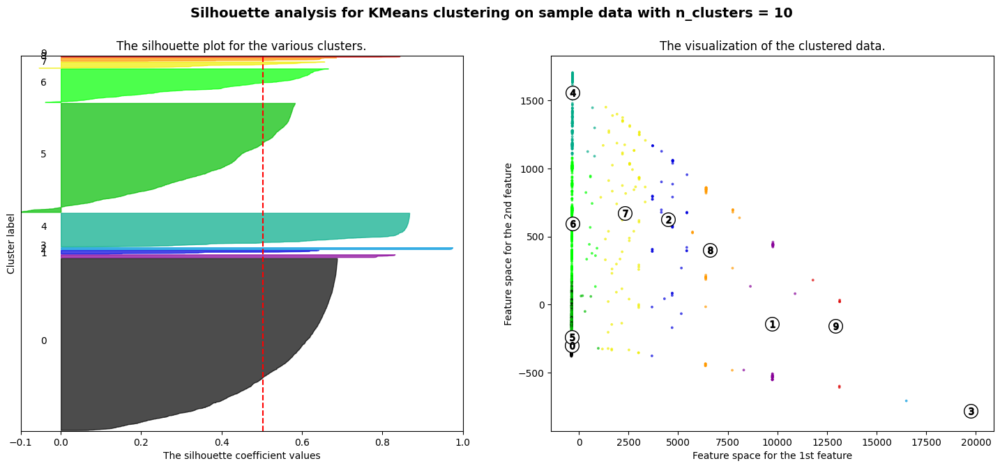

In [186]:
# Silouhette analysis to determin a suitable n_clusters for the KMeans algorithm

# Const to wether apply dimensionality reduction
DIM_REDUCE = True

# prepare our data
income_array = data.iloc[:, [56, 59, 62, 65]].values
house_types_array = data.iloc[:, [10, 13, 16, 19, 22, 66, 67, 68, 71, 74, 77, 80]].values
age_dem_array = data.iloc[:, [25, 28, 31, 38]].values

# concatenate into one array
X = np.concatenate((income_array, 
                    house_types_array,
                    age_dem_array), axis=1)

if DIM_REDUCE:
    # reduce dimensionality into 3 components using PCA
    dim_reducer = PCA(n_components=3, random_state=0)
    X = dim_reducer.fit_transform(X)
    
# a set of n_clusters to test from
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10, n_init="auto")
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(f"For n_clusters = {n_clusters} The average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

In [187]:
clusterer = KMeans(n_clusters=4, random_state=10, n_init="auto")
cluster_labels = clusterer.fit_predict(X)

In [188]:
# Get unique values and their indices
unique_values, unique_indices = np.unique(cluster_labels, return_inverse=True)

# Create separate arrays for each unique value containing its indices
unique_indices_arrays = [np.where(unique_indices == i)[0] for i in range(len(unique_values))]

## Cluster Analysis

### Investigate Income Characterestics

In [189]:
data.iloc[unique_indices_arrays[0], list(range(41, 66, 3))].describe()

,u_household_income_up_to_1000_per_household_index,u_household_income_1000_to_under_1500_per_household_index,u_household_income_1500_to_under_2000_per_household_index,u_household_income_2000_to_under_2500_per_household_index,u_household_income_2500_to_under_3000_per_household_index,u_household_income_3000_to_under_4000_per_household_index,u_household_income_4000_to_under_5000_per_household_index,u_household_income_5000_to_under_7000_per_household_index,u_household_income_7000_and_higher_per_household_index
count,3842.000000,3842.000000,3842.000000,3842.000000,3842.000000,3842.000000,3842.000000,3842.000000,3842.000000
mean,61.421183,75.882722,90.854769,103.316143,92.498453,91.367540,124.359893,135.079535,129.353850
std,95.028976,97.111990,97.771358,95.324228,92.865849,83.778497,114.954738,148.684027,221.801047
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,20.051000,77.747000,96.678000,82.976000,82.004000,106.793000,97.387000,0.000000
75%,120.342000,135.342000,155.494000,161.130000,145.208000,131.207000,189.379500,202.265000,207.742000
max,550.133000,644.487000,680.287000,671.375000,696.998000,562.316000,747.551000,876.481000,1661.935000


In [190]:
data.iloc[unique_indices_arrays[1], list(range(41, 66, 3))].describe()

,u_household_income_up_to_1000_per_household_index,u_household_income_1000_to_under_1500_per_household_index,u_household_income_1500_to_under_2000_per_household_index,u_household_income_2000_to_under_2500_per_household_index,u_household_income_2500_to_under_3000_per_household_index,u_household_income_3000_to_under_4000_per_household_index,u_household_income_4000_to_under_5000_per_household_index,u_household_income_5000_to_under_7000_per_household_index,u_household_income_7000_and_higher_per_household_index
count,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000
mean,189.243657,168.433224,148.569164,105.982269,60.375448,55.630657,58.258925,61.774925,83.908552
std,66.193412,71.803819,60.875259,60.690331,40.787555,32.201828,41.976416,46.740675,81.685874
min,37.754000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,141.144500,124.453000,112.077000,80.971000,37.477000,35.622500,24.071000,23.386500,36.950000
50%,183.378000,164.051000,133.281000,109.241000,47.094000,54.670000,42.717000,48.693000,69.247000
75%,233.390000,206.010000,172.771000,134.275000,80.441500,66.786000,89.931000,94.721000,107.742500
max,427.881000,393.723000,350.624000,377.648000,237.613000,224.926000,169.840000,190.539000,474.838000


In [191]:
data.iloc[unique_indices_arrays[2], list(range(41, 66, 3))].describe()

,u_household_income_up_to_1000_per_household_index,u_household_income_1000_to_under_1500_per_household_index,u_household_income_1500_to_under_2000_per_household_index,u_household_income_2000_to_under_2500_per_household_index,u_household_income_2500_to_under_3000_per_household_index,u_household_income_3000_to_under_4000_per_household_index,u_household_income_4000_to_under_5000_per_household_index,u_household_income_5000_to_under_7000_per_household_index,u_household_income_7000_and_higher_per_household_index
count,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000,145.000000
mean,178.269490,160.603379,149.487441,122.350538,59.605359,55.841510,62.322628,59.534821,74.088269
std,59.748903,55.752048,51.514485,44.143043,34.983482,26.888183,38.479624,41.188096,62.363387
min,18.079000,45.114000,37.620000,14.648000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,138.772000,121.038000,118.097000,97.655000,31.116000,35.947000,28.478000,23.689000,40.047000
50%,181.220000,156.919000,138.454000,113.548000,57.131000,56.232000,61.909000,56.547000,58.830000
75%,226.525000,203.014000,174.534000,142.173000,79.204000,70.541000,92.006000,88.236000,97.761000
max,306.958000,349.271000,343.002000,304.840000,209.745000,180.088000,167.154000,179.791000,362.604000


In [192]:
data.iloc[unique_indices_arrays[3], list(range(41, 66, 3))].describe()

,u_household_income_up_to_1000_per_household_index,u_household_income_1000_to_under_1500_per_household_index,u_household_income_1500_to_under_2000_per_household_index,u_household_income_2000_to_under_2500_per_household_index,u_household_income_2500_to_under_3000_per_household_index,u_household_income_3000_to_under_4000_per_household_index,u_household_income_4000_to_under_5000_per_household_index,u_household_income_5000_to_under_7000_per_household_index,u_household_income_7000_and_higher_per_household_index
count,702.000000,702.000000,702.000000,702.000000,702.000000,702.000000,702.000000,702.000000,702.000000
mean,178.042244,169.410037,147.699514,124.049893,56.022560,64.844057,62.686624,53.054607,54.084937
std,75.247534,69.201789,54.631927,54.244896,48.646935,43.552673,47.445230,52.375082,80.333109
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,135.120000,123.632500,116.000000,94.782000,0.000000,37.488000,27.615250,0.000000,0.000000
50%,183.378000,180.456000,152.652500,118.478000,56.392000,61.503000,60.755000,47.808000,0.000000
75%,226.525000,212.302000,175.700000,151.059000,87.125000,84.574250,94.927000,86.747000,91.275000
max,466.779000,386.692000,444.269000,447.583000,254.114000,308.723000,284.781000,365.200000,553.978000


### Investigate Age Demographics

In [193]:
data.iloc[unique_indices_arrays[0], list(range(23, 38, 3))].describe()

,u_household_head_up_to_under_30_years,u_household_head_30_to_under_40_years,u_household_head_40_to_under_50_years,u_household_head_50_to_under_60_years,u_household_head_60_years_and_older
count,3842.000000,3842.000000,3842.000000,3842.000000,3842.000000
mean,1.725143,2.822228,2.760281,3.840708,7.923998
std,3.013108,3.934956,3.574193,3.974748,8.178556
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,1.000000,1.000000,4.000000
50%,1.000000,2.000000,2.000000,3.000000,6.000000
75%,2.000000,4.000000,4.000000,5.000000,10.000000
max,48.000000,63.000000,52.000000,55.000000,120.000000


In [194]:
data.iloc[unique_indices_arrays[1], list(range(23, 38, 3))].describe()

,u_household_head_up_to_under_30_years,u_household_head_30_to_under_40_years,u_household_head_40_to_under_50_years,u_household_head_50_to_under_60_years,u_household_head_60_years_and_older
count,67.000000,67.000000,67.000000,67.000000,67.000000
mean,12.313433,13.447761,10.208955,8.940299,20.940299
std,9.968449,11.803035,8.557360,7.573640,21.819425
min,0.000000,0.000000,1.000000,0.000000,1.000000
25%,5.000000,6.000000,5.000000,4.000000,8.000000
50%,10.000000,10.000000,8.000000,6.000000,14.000000
75%,15.000000,15.500000,11.500000,10.000000,28.500000
max,43.000000,54.000000,40.000000,34.000000,111.000000


In [195]:
data.iloc[unique_indices_arrays[2], list(range(23, 38, 3))].describe()

,u_household_head_up_to_under_30_years,u_household_head_30_to_under_40_years,u_household_head_40_to_under_50_years,u_household_head_50_to_under_60_years,u_household_head_60_years_and_older
count,145.000000,145.000000,145.000000,145.000000,145.000000
mean,21.441379,27.882759,19.655172,17.600000,26.386207
std,15.792876,19.637869,13.660761,12.754302,18.089356
min,1.000000,1.000000,0.000000,1.000000,2.000000
25%,12.000000,17.000000,11.000000,9.000000,14.000000
50%,18.000000,24.000000,16.000000,15.000000,21.000000
75%,25.000000,33.000000,24.000000,21.000000,34.000000
max,115.000000,135.000000,99.000000,84.000000,96.000000


In [196]:
data.iloc[unique_indices_arrays[3], list(range(23, 38, 3))].describe()

,u_household_head_up_to_under_30_years,u_household_head_30_to_under_40_years,u_household_head_40_to_under_50_years,u_household_head_50_to_under_60_years,u_household_head_60_years_and_older
count,702.000000,702.000000,702.000000,702.000000,702.000000
mean,10.297721,13.180912,9.991453,8.978632,12.960114
std,11.226038,14.054612,10.400123,9.568782,14.202574
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,4.000000,3.000000,2.000000,4.000000
50%,6.000000,9.000000,6.000000,6.000000,9.000000
75%,14.000000,18.000000,13.000000,11.000000,16.000000
max,76.000000,85.000000,62.000000,60.000000,133.000000


### Investigate Housing Types

In [197]:
data.iloc[unique_indices_arrays[0], list(range(13, 23, 3))].describe()

,u_single_person_households_per_household_index,u_multiple_person_households_without_children_per_household_index,u_multiple_person_households_with_children_per_household_index,u_immigrant_households_per_household_index
count,3842.000000,3842.000000,3842.000000,3842.000000
mean,80.844937,113.189813,113.307217,67.546228
std,54.814872,62.341510,70.865332,114.641948
min,0.000000,0.000000,0.000000,0.000000
25%,35.265500,66.578000,60.314500,0.000000
50%,80.645000,110.963000,105.825000,0.000000
75%,122.297000,147.950000,152.858000,95.758000
max,244.593000,332.888000,343.930000,766.062000


In [198]:
data.iloc[unique_indices_arrays[1], list(range(13, 23, 3))].describe()

,u_single_person_households_per_household_index,u_multiple_person_households_without_children_per_household_index,u_multiple_person_households_with_children_per_household_index,u_immigrant_households_per_household_index
count,67.000000,67.000000,67.000000,67.000000
mean,156.337522,53.281881,69.049821,102.168403
std,30.711806,31.524163,42.793216,67.979858
min,101.480000,0.000000,0.000000,0.000000
25%,139.768000,27.220000,44.945500,50.247000
50%,152.871000,63.407000,62.533000,86.724000
75%,161.788000,75.656000,92.587000,139.572000
max,244.593000,123.644000,158.737000,292.496000


In [199]:
data.iloc[unique_indices_arrays[2], list(range(13, 23, 3))].describe()

,u_single_person_households_per_household_index,u_multiple_person_households_without_children_per_household_index,u_multiple_person_households_with_children_per_household_index,u_immigrant_households_per_household_index
count,145.000000,145.000000,145.000000,145.000000
mean,147.688297,67.660855,66.355938,124.625931
std,24.131722,18.862629,28.830717,108.465865
min,89.684000,6.658000,0.000000,20.704000
25%,137.584000,60.525000,57.322000,62.536000
50%,144.652000,71.333000,66.999000,96.970000
75%,151.072000,79.259000,81.176000,141.117000
max,231.005000,110.963000,160.501000,727.758000


In [200]:
data.iloc[unique_indices_arrays[3], list(range(13, 23, 3))].describe()

,u_single_person_households_per_household_index,u_multiple_person_households_without_children_per_household_index,u_multiple_person_households_with_children_per_household_index,u_immigrant_households_per_household_index
count,702.000000,702.000000,702.000000,702.000000
mean,141.847356,72.851882,69.205882,132.100772
std,26.966470,30.139959,40.761348,136.881167
min,47.855000,0.000000,0.000000,0.000000
25%,127.189000,60.631500,47.925750,58.928000
50%,138.426500,76.820000,68.786000,90.958000
75%,149.077250,90.383500,88.187000,161.276000
max,244.593000,190.222000,257.947000,766.062000


## Detrmining a geo-point with a Minimum Radius of 1km:

The proposed approach which can be followed to construct a geo-point which has an optimal reacheability to all the targetter regions:

1. Separate the targetted cluster(s) based on the "u_place" variable.
2. Create a polygone out of the "u_coordinates" variable for each "u_place".
3. Interpolate the centroid of the polygone while maximizing the "u_inhabitants" and "u_households".